In [ ]:
from google.colab import drive
drive.mount('/content/drive')
import os
import pandas as pd
import numpy as np

BASE_DIR = "/content/drive/MyDrive/Weather Trend Forecasting"

DATA_FILE = os.path.join(
    BASE_DIR,
    "processed_outputs",
    "outlier_processed_outputs",
    "GlobalWeatherRepository_missing_outlier_cleaned.csv")
df = pd.read_csv(DATA_FILE)
df["last_updated"] = pd.to_datetime(
    df["last_updated"],
    errors="coerce")
df = df.dropna(subset=[
        "country",
        "location_name",
        "last_updated"])
df = df.sort_values(["location_name", "last_updated"]).reset_index(drop=True)
print("Dataset shape:", df.shape)
display(df.head())

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Dataset shape: (141508, 41)


,last_updated,country,location_name,latitude,longitude,timezone,last_updated_epoch,temperature_celsius,temperature_fahrenheit,condition_text,...,air_quality_PM2.5,air_quality_PM10,air_quality_us-epa-index,air_quality_gb-defra-index,sunrise,sunset,moonrise,moonset,moon_phase,moon_illumination
0,2024-05-31 16:15:00,Belgium,'S Gravenjansdijk,51.25,3.63,Europe/Brussels,1717164900,16.0,60.8,Moderate rain,...,2.2,3.4,1,1,05:36 AM,09:52 PM,02:59 AM,02:09 PM,Waning Crescent,47
1,2024-06-01 16:30:00,Belgium,'S Gravenjansdijk,51.25,3.63,Europe/Brussels,1717252200,16.0,60.8,Overcast,...,6.5,19.6,1,1,05:35 AM,09:53 PM,03:12 AM,03:34 PM,Waning Crescent,35
2,2024-06-04 16:15:00,Belgium,'S Gravenjansdijk,51.25,3.63,Europe/Brussels,1717510500,18.0,64.4,Partly cloudy,...,5.7,6.0,1,1,05:33 AM,09:56 PM,03:56 AM,07:57 PM,Waning Crescent,8
3,2024-06-05 16:15:00,Belgium,'S Gravenjansdijk,51.25,3.63,Europe/Brussels,1717596900,15.0,59.0,Partly cloudy,...,1.2,2.4,1,1,05:33 AM,09:56 PM,04:17 AM,09:25 PM,Waning Crescent,3
4,2024-06-11 16:15:00,Belgium,'S Gravenjansdijk,51.25,3.63,Europe/Brussels,1718115300,15.2,59.4,Partly cloudy,...,0.5,0.9,1,1,05:30 AM,10:01 PM,10:16 AM,01:31 AM,Waxing Crescent,21


In [ ]:
# Count cities with sequence length >= 700
city_length_df = (df.groupby(["country", "location_name"]).size()
    .reset_index(name="sequence_length"))
city_length_df = city_length_df.sort_values("sequence_length",ascending=False)
qualified_city_df = city_length_df[
    city_length_df["sequence_length"] >= 700]
print("Number of cities with length >=700:",len(qualified_city_df))
print("Maximum sequence length:",
    qualified_city_df["sequence_length"].max())
print("Minimum sequence length among selected:",
    qualified_city_df["sequence_length"].min())
display(qualified_city_df.head(100))

Number of cities with length >=700: 182
Maximum sequence length: 728
Minimum sequence length among selected: 702


,country,location_name,sequence_length
0,Afghanistan,Kabul,728
231,Thailand,Nan,728
256,Vatican City,Vatican City,728
112,Japan,Tokyo,728
114,Jordan,Amman,728
...,...,...,...
34,Bulgaria,Sofia,726
253,Uruguay,Montevideo,726
147,Mauritania,Nouakchott,726
148,Mauritius,Port Louis,726


In [ ]:
# Save qualified cities
OUTPUT_DIR = os.path.join(BASE_DIR,"prediction_outputs")
os.makedirs(OUTPUT_DIR,exist_ok=True)
qualified_city_df.to_csv(os.path.join(OUTPUT_DIR,"cities_length_ge_700.csv"),index=False)
print("Saved:",os.path.join(OUTPUT_DIR,"cities_length_ge_700.csv"))

Saved: /content/drive/MyDrive/Weather Trend Forecasting/prediction_outputs/cities_length_ge_700.csv


In [ ]:
import os
import numpy as np
import pandas as pd

BASE_DIR = "/content/drive/MyDrive/Weather Trend Forecasting"
DATA_FILE = os.path.join(
    BASE_DIR,
    "processed_outputs",
    "outlier_processed_outputs",
    "GlobalWeatherRepository_missing_outlier_cleaned.csv")
CITY_FILE = os.path.join(
    BASE_DIR,
    "prediction_outputs",
    "cities_length_ge_700.csv")
OUTPUT_DIR = os.path.join(
    BASE_DIR,
    "prediction_outputs",
    "temperature_main_dataset")
os.makedirs(OUTPUT_DIR,exist_ok=True)

df = pd.read_csv(DATA_FILE)
df["last_updated"] = pd.to_datetime(df["last_updated"],errors="coerce")
df = df.sort_values(["location_name", "last_updated"]).reset_index(drop=True)
qualified_city_df = pd.read_csv(CITY_FILE)
print("Qualified cities:",len(qualified_city_df))

# build dataset
train_samples = []
test_samples = []
city_order = []
for _, row in qualified_city_df.iterrows():
    city = row["location_name"]
    country = row["country"]
    city_df = (
        df[(df["country"] == country)&(df["location_name"] == city)]
        .sort_values("last_updated").reset_index(drop=True))
    temp = (city_df["temperature_celsius"].values)

    # retain first 700 only
    temp = temp[:700]
    if len(temp) < 700:
        continue
    train_part = temp[:600]
    test_part = temp[600:700]
    train_samples.append(train_part)
    test_samples.append(test_part)
    city_order.append({"country": country,"location_name": city})

# convert
X_main_train = np.array(train_samples)
Y_main_test = np.array(test_samples)
city_order_df = pd.DataFrame(city_order)
print("Main train shape:",X_main_train.shape)
print("Main test shape:",Y_main_test.shape)
display(city_order_df.head())

# save csv
pd.DataFrame(X_main_train).to_csv(os.path.join(OUTPUT_DIR,"temperature_train_input.csv"),index=False)
pd.DataFrame(Y_main_test).to_csv(os.path.join(OUTPUT_DIR,"temperature_test_target.csv"),index=False)
city_order_df.to_csv(os.path.join(OUTPUT_DIR,"city_order.csv"),index=False)

# save numpy
np.save(os.path.join(OUTPUT_DIR,"temperature_train_input.npy"),X_main_train)
np.save(os.path.join(OUTPUT_DIR,"temperature_test_target.npy"),Y_main_test)
print("Saved to:",OUTPUT_DIR)

Qualified cities: 182
Main train shape: (182, 600)
Main test shape: (182, 100)


,country,location_name
0,Afghanistan,Kabul
1,Thailand,Nan
2,Vatican City,Vatican City
3,Japan,Tokyo
4,Jordan,Amman


Saved to: /content/drive/MyDrive/Weather Trend Forecasting/prediction_outputs/temperature_main_dataset


In [ ]:
# Build Auxiliary Input Dataset
# 8 auxiliary inputs, each with shape (182, 600)
#
# 1. STL_trend_of_temperature
# 2. STL_seasonal_of_temperature
# 3. Gaussian_7_temperature
# 4. Gaussian_30_temperature
# 5. humidity
# 6. pressure_mb
# 7. uv_index
# 8. cloud

import os
import numpy as np
import pandas as pd
from scipy.ndimage import gaussian_filter1d
from statsmodels.tsa.seasonal import STL

BASE_DIR = "/content/drive/MyDrive/Weather Trend Forecasting"
DATA_FILE = os.path.join(
    BASE_DIR,
    "processed_outputs",
    "outlier_processed_outputs",
    "GlobalWeatherRepository_missing_outlier_cleaned.csv")
MAIN_DATASET_DIR = os.path.join(
    BASE_DIR,
    "prediction_outputs",
    "temperature_main_dataset")
AUX_OUTPUT_DIR = os.path.join(
    BASE_DIR,
    "prediction_outputs",
    "temperature_auxiliary_dataset")
os.makedirs(AUX_OUTPUT_DIR, exist_ok=True)

# Load processed full data and city order
df = pd.read_csv(DATA_FILE)
df["last_updated"] = pd.to_datetime(
    df["last_updated"],
    errors="coerce")
df = df.sort_values(["location_name", "last_updated"]).reset_index(drop=True)
city_order_df = pd.read_csv(
    os.path.join(MAIN_DATASET_DIR, "city_order.csv"))
X_main_train = np.load(os.path.join(MAIN_DATASET_DIR, "temperature_train_input.npy"))
print("Main train shape:", X_main_train.shape)
print("Number of cities in city_order:", len(city_order_df))
assert X_main_train.shape[0] == len(city_order_df)
assert X_main_train.shape[1] == 600

Main train shape: (182, 600)
Number of cities in city_order: 182


In [ ]:
# Helper functions

def get_city_first_600_values(df, country, city, feature):
    city_df = (df[(df["country"] == country)&(df["location_name"] == city)]
        .sort_values("last_updated").reset_index(drop=True))
    values = pd.to_numeric(city_df[feature],errors="coerce").values[:600]
    if len(values) < 600:
        raise ValueError(f"{city} has fewer than 600 records for {feature}")
    values = pd.Series(values).interpolate(limit_direction="both").values
    return values

def compute_stl_components(y, period=30):
    # Compute STL trend and seasonal components on training window only.
    y = pd.Series(y).astype(float).interpolate(limit_direction="both").values
    try:
        stl = STL(y,period=period,robust=True)
        result = stl.fit()
        trend = result.trend
        seasonal = result.seasonal
    except Exception:
        # fallback if STL fails
        trend = pd.Series(y).rolling(window=30,center=True,min_periods=1).mean().values
        seasonal = y - trend
    return trend, seasonal

def gaussian_smooth_by_window(y, window_size):
    # Use Gaussian smoothing where approximately 6 sigma covers the window.
    sigma = max(window_size / 6, 1)
    return gaussian_filter1d(y.astype(float),sigma=sigma)

In [ ]:
# Compute STL trend / seasonal from 182×600 temperature input
stl_trend_list = []
stl_seasonal_list = []
for i in range(X_main_train.shape[0]):
    y = X_main_train[i]
    trend, seasonal = compute_stl_components(y,period=30)
    stl_trend_list.append(trend)
    stl_seasonal_list.append(seasonal)
X_stl_trend = np.array(stl_trend_list)
X_stl_seasonal = np.array(stl_seasonal_list)
print("STL trend shape:", X_stl_trend.shape)
print("STL seasonal shape:", X_stl_seasonal.shape)

STL trend shape: (182, 600)
STL seasonal shape: (182, 600)


In [ ]:
# Gaussian smoothing on main temperature input
X_gaussian_7 = np.array([
    gaussian_smooth_by_window(row, window_size=7)
    for row in X_main_train])
X_gaussian_30 = np.array([
    gaussian_smooth_by_window(row, window_size=30)
    for row in X_main_train])
print("Gaussian 7 shape:", X_gaussian_7.shape)
print("Gaussian 30 shape:", X_gaussian_30.shape)

Gaussian 7 shape: (182, 600)
Gaussian 30 shape: (182, 600)


In [ ]:
# Read aligned meteorological auxiliary variables

aux_weather_features = [
    "humidity",
    "pressure_mb",
    "uv_index",
    "cloud"]

weather_aux_arrays = {feature: [] for feature in aux_weather_features}

for _, row in city_order_df.iterrows():
    country = row["country"]
    city = row["location_name"]
    for feature in aux_weather_features:
        values = get_city_first_600_values(df,country,city,feature)
        weather_aux_arrays[feature].append(values)

X_humidity = np.array(weather_aux_arrays["humidity"])
X_pressure_mb = np.array(weather_aux_arrays["pressure_mb"])
X_uv_index = np.array(weather_aux_arrays["uv_index"])
X_cloud = np.array(weather_aux_arrays["cloud"])

print("Humidity shape:", X_humidity.shape)
print("Pressure shape:", X_pressure_mb.shape)
print("UV shape:", X_uv_index.shape)
print("Cloud shape:", X_cloud.shape)

Humidity shape: (182, 600)
Pressure shape: (182, 600)
UV shape: (182, 600)
Cloud shape: (182, 600)


In [ ]:
# Validate all auxiliary inputs
aux_arrays = {
    "STL_trend_of_temperature": X_stl_trend,
    "STL_seasonal_of_temperature": X_stl_seasonal,
    "Gaussian_7_temperature": X_gaussian_7,
    "Gaussian_30_temperature": X_gaussian_30,
    "humidity": X_humidity,
    "pressure_mb": X_pressure_mb,
    "uv_index": X_uv_index,
    "cloud": X_cloud}
for name, arr in aux_arrays.items():
    print(name, arr.shape, "NaN count:", np.isnan(arr).sum())
    assert arr.shape == (X_main_train.shape[0], 600)
print("All auxiliary inputs validated.")

STL_trend_of_temperature (182, 600) NaN count: 0
STL_seasonal_of_temperature (182, 600) NaN count: 0
Gaussian_7_temperature (182, 600) NaN count: 0
Gaussian_30_temperature (182, 600) NaN count: 0
humidity (182, 600) NaN count: 0
pressure_mb (182, 600) NaN count: 0
uv_index (182, 600) NaN count: 0
cloud (182, 600) NaN count: 0
All auxiliary inputs validated.


In [ ]:
# Save each auxiliary input separately
for name, arr in aux_arrays.items():
    np.save(os.path.join(AUX_OUTPUT_DIR,f"{name}.npy"),arr)
    pd.DataFrame(arr).to_csv(os.path.join(AUX_OUTPUT_DIR,f"{name}.csv"),index=False)
print("Saved individual auxiliary inputs to:")
print(AUX_OUTPUT_DIR)

Saved individual auxiliary inputs to:
/content/drive/MyDrive/Weather Trend Forecasting/prediction_outputs/temperature_auxiliary_dataset


In [ ]:
# Save stacked auxiliary tensor
# Shape: (182, 600, 8)

aux_feature_names = list(aux_arrays.keys())
X_auxiliary = np.stack(
    [aux_arrays[name]for name in aux_feature_names],axis=-1)
print("Stacked auxiliary input shape:", X_auxiliary.shape)
np.save(os.path.join(AUX_OUTPUT_DIR,"X_auxiliary_8features.npy"),X_auxiliary)
pd.DataFrame({
    "feature_index": range(len(aux_feature_names)),
    "feature_name": aux_feature_names}).to_csv(
    os.path.join(AUX_OUTPUT_DIR,"auxiliary_feature_names.csv"),index=False)

print("Saved stacked auxiliary tensor:")
print(os.path.join(AUX_OUTPUT_DIR, "X_auxiliary_8features.npy"))
print("Saved feature name mapping:")
print(os.path.join(AUX_OUTPUT_DIR, "auxiliary_feature_names.csv"))

Stacked auxiliary input shape: (182, 600, 8)
Saved stacked auxiliary tensor:
/content/drive/MyDrive/Weather Trend Forecasting/prediction_outputs/temperature_auxiliary_dataset/X_auxiliary_8features.npy
Saved feature name mapping:
/content/drive/MyDrive/Weather Trend Forecasting/prediction_outputs/temperature_auxiliary_dataset/auxiliary_feature_names.csv


Visualizing sample #100
City: Kuala Lumpur
Country: Malaysia
Main input shape: (182, 600)
Auxiliary input shape: (182, 600, 8)
Test target shape: (182, 100)


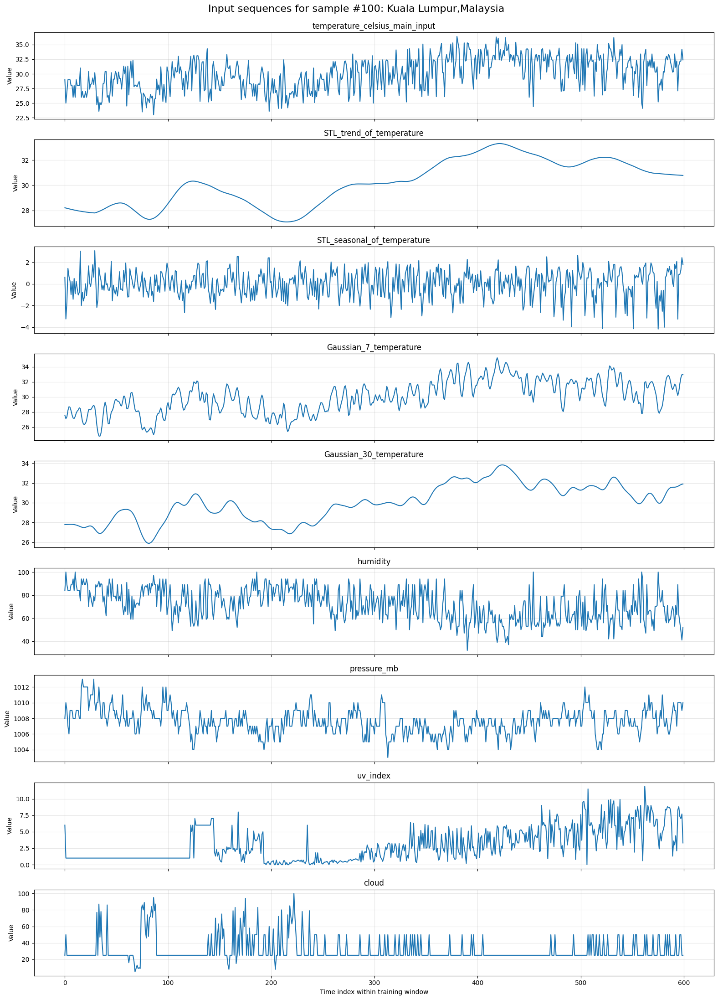

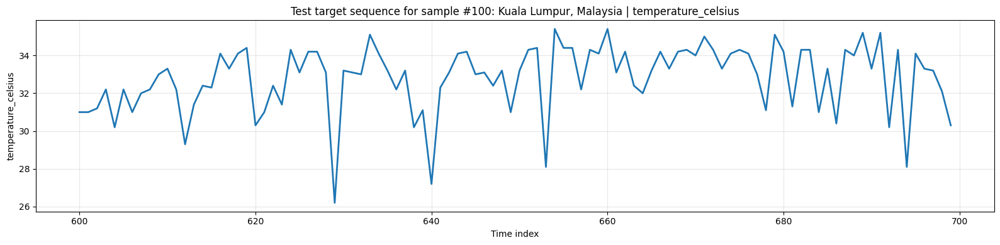

In [ ]:
# Visualize sample #100 from 9 input sequences + test target
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
BASE_DIR = "/content/drive/MyDrive/Weather Trend Forecasting"
MAIN_DIR = os.path.join(
    BASE_DIR,
    "prediction_outputs",
    "temperature_main_dataset")
AUX_DIR = os.path.join(
    BASE_DIR,
    "prediction_outputs",
    "temperature_auxiliary_dataset")
X_main = np.load(os.path.join(MAIN_DIR, "temperature_train_input.npy"))
Y_test = np.load(os.path.join(MAIN_DIR, "temperature_test_target.npy"))
X_aux = np.load(os.path.join(AUX_DIR, "X_auxiliary_8features.npy"))
city_order = pd.read_csv(os.path.join(MAIN_DIR, "city_order.csv"))
aux_feature_names = pd.read_csv(
    os.path.join(AUX_DIR, "auxiliary_feature_names.csv")
)["feature_name"].tolist()

sample_idx = 99
country = city_order.loc[sample_idx, "country"]
city = city_order.loc[sample_idx, "location_name"]
print(f"Visualizing sample #{sample_idx + 1}")
print(f"City: {city}")
print(f"Country: {country}")
print("Main input shape:", X_main.shape)
print("Auxiliary input shape:", X_aux.shape)
print("Test target shape:", Y_test.shape)

# Build 9 input sequences
input_sequences = {"temperature_celsius_main_input": X_main[sample_idx]}
for i, name in enumerate(aux_feature_names):
    input_sequences[name] = X_aux[sample_idx, :, i]

# Plot 9 input sequences
fig, axes = plt.subplots(nrows=9,ncols=1,figsize=(16, 22),sharex=True)
x_train = np.arange(600)
for ax, (name, values) in zip(axes, input_sequences.items()):
    ax.plot(x_train, values, linewidth=1.5)
    ax.set_title(name)
    ax.set_ylabel("Value")
    ax.grid(True, alpha=0.3)
axes[-1].set_xlabel("Time index within training window")
fig.suptitle(f"Input sequences for sample #{sample_idx + 1}: {city},{country}",
    fontsize=16,y=0.995)
plt.tight_layout()
plt.show()

# Plot test target sequence
plt.figure(figsize=(16, 4))
plt.plot(np.arange(600, 700), Y_test[sample_idx], linewidth=2)
plt.title(
    f"Test target sequence for sample #{sample_idx + 1}: "
    f"{city}, {country} | temperature_celsius")
plt.xlabel("Time index")
plt.ylabel("temperature_celsius")
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

**SARIMAX**

In [ ]:
# SARIMAX Forecasting with Main Temperature Input + 8 Aux Inputs
# Train: 182 × 600
# Forecast: 182 × 100

import os
import warnings
warnings.filterwarnings("ignore")
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

BASE_DIR = "/content/drive/MyDrive/Weather Trend Forecasting"
MAIN_DIR = os.path.join(
    BASE_DIR,
    "prediction_outputs",
    "temperature_main_dataset")
AUX_DIR = os.path.join(
    BASE_DIR,
    "prediction_outputs",
    "temperature_auxiliary_dataset")
SARIMAX_OUTPUT_DIR = os.path.join(
    BASE_DIR,
    "prediction_outputs",
    "model_outputs",
    "SARIMAX")
FIG_DIR = os.path.join(SARIMAX_OUTPUT_DIR, "figures")
REPORT_DIR = os.path.join(SARIMAX_OUTPUT_DIR, "reports")
PRED_DIR = os.path.join(SARIMAX_OUTPUT_DIR, "predictions")
for p in [SARIMAX_OUTPUT_DIR, FIG_DIR, REPORT_DIR, PRED_DIR]:
    os.makedirs(p, exist_ok=True)

X_main_train = np.load(os.path.join(MAIN_DIR, "temperature_train_input.npy"))
Y_test = np.load(os.path.join(MAIN_DIR, "temperature_test_target.npy"))
X_aux = np.load(os.path.join(AUX_DIR, "X_auxiliary_8features.npy"))
city_order = pd.read_csv(os.path.join(MAIN_DIR, "city_order.csv"))
aux_feature_names = pd.read_csv(
    os.path.join(AUX_DIR, "auxiliary_feature_names.csv")
)["feature_name"].tolist()
print("Main train:", X_main_train.shape)
print("Auxiliary:", X_aux.shape)
print("Test target:", Y_test.shape)
print("Aux features:", aux_feature_names)
assert X_main_train.shape == (182, 600)
assert X_aux.shape == (182, 600, 8)
assert Y_test.shape == (182, 100)

Main train: (182, 600)
Auxiliary: (182, 600, 8)
Test target: (182, 100)
Aux features: ['STL_trend_of_temperature', 'STL_seasonal_of_temperature', 'Gaussian_7_temperature', 'Gaussian_30_temperature', 'humidity', 'pressure_mb', 'uv_index', 'cloud']


In [ ]:
# Helper functions

def repeat_last_pattern(x, forecast_steps=100, pattern_len=30):
    """
    Repeat the last pattern_len points to forecast future exogenous variables.
    This avoids using future test information.
    """
    x = np.asarray(x, dtype=float)
    if len(x) < pattern_len:
        pattern = x
    else:
        pattern = x[-pattern_len:]
    repeats = int(np.ceil(forecast_steps / len(pattern)))
    future = np.tile(pattern, repeats)[:forecast_steps]
    return future


def linear_extrapolate(x, forecast_steps=100, fit_len=90):
    """
    Linear extrapolation based only on the recent training segment.
    Suitable for smooth trend-like auxiliary variables.
    """
    x = np.asarray(x, dtype=float)
    fit_len = min(fit_len, len(x))
    y_fit = x[-fit_len:]
    t_fit = np.arange(fit_len)
    if np.std(y_fit) < 1e-8:
        return np.full(forecast_steps, y_fit[-1])
    coef = np.polyfit(t_fit, y_fit, deg=1)
    t_future = np.arange(fit_len, fit_len + forecast_steps)
    future = coef[0] * t_future + coef[1]
    return future


def build_future_exog_for_city(aux_train, aux_names, forecast_steps=100):
    """
    Forecast future exogenous variables using only the 600-point training window.
    """
    future_exog = []
    for i, name in enumerate(aux_names):
        x = aux_train[:, i]
        if name in [
            "STL_trend_of_temperature",
            "Gaussian_30_temperature"]:
            future = linear_extrapolate(x,forecast_steps=forecast_steps,fit_len=90)
        elif name in [
            "STL_seasonal_of_temperature",
            "Gaussian_7_temperature",
            "humidity",
            "pressure_mb",
            "uv_index",
            "cloud"]:
            future = repeat_last_pattern(x,forecast_steps=forecast_steps,pattern_len=30)
        else:
            future = repeat_last_pattern(x,
                forecast_steps=forecast_steps,
                pattern_len=30)
        future_exog.append(future)
    future_exog = np.stack(future_exog, axis=1)
    return future_exog


def standardize_train_future(train_exog, future_exog):
    """
    Standardize exogenous variables using training statistics only.
    """
    mean = train_exog.mean(axis=0)
    std = train_exog.std(axis=0)
    std[std < 1e-8] = 1.0
    train_scaled = (train_exog - mean) / std
    future_scaled = (future_exog - mean) / std
    return train_scaled, future_scaled, mean, std


def standardize_target(y_train):
    mean = np.mean(y_train)
    std = np.std(y_train)
    if std < 1e-8:
        std = 1.0
    y_scaled = (y_train - mean) / std
    return y_scaled, mean, std


def inverse_target_scale(y_scaled, mean, std):
    return y_scaled * std + mean


def calculate_metrics(y_true, y_pred):
    y_true = np.asarray(y_true, dtype=float)
    y_pred = np.asarray(y_pred, dtype=float)
    mae = mean_absolute_error(y_true, y_pred)
    rmse = np.sqrt(mean_squared_error(y_true, y_pred))
    mape = np.mean(
        np.abs((y_true - y_pred) / np.maximum(np.abs(y_true), 1e-6))
    ) * 100
    smape = np.mean(
        2 * np.abs(y_pred - y_true)
        / np.maximum(np.abs(y_true) + np.abs(y_pred), 1e-6)
    ) * 100
    r2 = r2_score(y_true, y_pred)
    return {
        "MAE": mae,
        "RMSE": rmse,
        "MAPE_%": mape,
        "SMAPE_%": smape,
        "R2": r2}


def naive_last_value_forecast(y_train, forecast_steps=100):
    return np.full(forecast_steps, y_train[-1])

In [ ]:
# SARIMAX model configuration
FORECAST_STEPS = 100
SARIMAX_ORDER = (1, 1, 1)
SARIMAX_SEASONAL_ORDER = (1, 0, 0, 30)
MAXITER = 120

In [ ]:
# Train SARIMAX city by city and forecast 100 points

all_predictions = []
all_metrics = []
model_status_records = []

for city_idx in range(X_main_train.shape[0]):
    country = city_order.loc[city_idx, "country"]
    city = city_order.loc[city_idx, "location_name"]
    print(f"[{city_idx + 1}/182] SARIMAX forecasting: {city}, {country}")
    y_train = X_main_train[city_idx].astype(float)
    y_true = Y_test[city_idx].astype(float)
    exog_train = X_aux[city_idx].astype(float)
    exog_future = build_future_exog_for_city(
        exog_train,
        aux_feature_names,
        forecast_steps=FORECAST_STEPS)

    # Target scaling
    y_scaled, y_mean, y_std = standardize_target(y_train)

    # Exogenous scaling
    exog_train_scaled, exog_future_scaled, _, _ = standardize_train_future(
        exog_train,
        exog_future)

    try:
        model = SARIMAX(
            y_scaled,
            exog=exog_train_scaled,
            order=SARIMAX_ORDER,
            seasonal_order=SARIMAX_SEASONAL_ORDER,
            trend="c",
            enforce_stationarity=False,
            enforce_invertibility=False)
        fitted = model.fit(
            disp=False,
            maxiter=MAXITER)
        forecast_scaled = fitted.forecast(
            steps=FORECAST_STEPS,
            exog=exog_future_scaled)
        y_pred = inverse_target_scale(
            forecast_scaled,
            y_mean,
            y_std)
        status = "sarimax_success"
        aic = fitted.aic
        bic = fitted.bic
    except Exception as e:
        print(f"    SARIMAX failed for {city}. Fallback to naive forecast. Error: {e}")
        y_pred = naive_last_value_forecast(y_train, forecast_steps=FORECAST_STEPS)
        status = "fallback_naive"
        aic = np.nan
        bic = np.nan
    metrics = calculate_metrics(y_true,y_pred)
    all_predictions.append(y_pred)
    all_metrics.append({
        "city_index": city_idx,
        "country": country,
        "location_name": city,
        **metrics})
    model_status_records.append({
        "city_index": city_idx,
        "country": country,
        "location_name": city,
        "status": status,
        "aic": aic,
        "bic": bic})
Y_pred_sarimax = np.array(all_predictions)
metrics_df = pd.DataFrame(all_metrics)
status_df = pd.DataFrame(model_status_records)
print("Prediction shape:", Y_pred_sarimax.shape)
display(metrics_df.head())
display(status_df["status"].value_counts())

[1/182] SARIMAX forecasting: Kabul, Afghanistan
[2/182] SARIMAX forecasting: Nan, Thailand
[3/182] SARIMAX forecasting: Vatican City, Vatican City
[4/182] SARIMAX forecasting: Tokyo, Japan
[5/182] SARIMAX forecasting: Amman, Jordan
[6/182] SARIMAX forecasting: Baghdad, Iraq
[7/182] SARIMAX forecasting: Bujumbura, Burundi
[8/182] SARIMAX forecasting: Kyiv, Ukraine
[9/182] SARIMAX forecasting: Tashkent, Uzbekistan
[10/182] SARIMAX forecasting: Valletta, Malta
[11/182] SARIMAX forecasting: Accra, Ghana
[12/182] SARIMAX forecasting: Warsaw, Poland
[13/182] SARIMAX forecasting: Suva, Fiji Islands
[14/182] SARIMAX forecasting: Malabo, Equatorial Guinea
[15/182] SARIMAX forecasting: Asmara, Eritrea
[16/182] SARIMAX forecasting: N'djamena, Chad
[17/182] SARIMAX forecasting: Dakar, Senegal
[18/182] SARIMAX forecasting: Majuro, Marshall Islands
[19/182] SARIMAX forecasting: Lilongwe, Malawi
[20/182] SARIMAX forecasting: Maputo, Mozambique
[21/182] SARIMAX forecasting: Abu Dhabi, United Arab Emir

,city_index,country,location_name,MAE,RMSE,MAPE_%,SMAPE_%,R2
0,0,Afghanistan,Kabul,7.052118,8.358695,3.655234e+06,78.872894,-0.802703
1,1,Thailand,Nan,6.043527,7.157242,1.800446e+01,20.455112,-3.005169
2,2,Vatican City,Vatican City,3.950508,4.948426,8.671714e+01,44.348116,-1.034552
3,3,Japan,Tokyo,4.769863,6.060895,1.785693e+02,37.588699,-0.473137
4,4,Jordan,Amman,3.037594,3.841968,3.676382e+01,27.619570,-0.452648


,count
status,
sarimax_success,182


In [ ]:
# Overall evaluation
overall_metrics = calculate_metrics(Y_test.flatten(),Y_pred_sarimax.flatten())
overall_metrics_df = pd.DataFrame([{
    "model": "SARIMAX",
    "order": str(SARIMAX_ORDER),
    "seasonal_order": str(SARIMAX_SEASONAL_ORDER),
    **overall_metrics}])
display(overall_metrics_df)

# City-level average metrics
city_metric_summary = metrics_df.describe()
display(city_metric_summary)

,model,order,seasonal_order,MAE,RMSE,MAPE_%,SMAPE_%,R2
0,SARIMAX,"(1, 1, 1)","(1, 0, 0, 30)",3.695764,5.253543,1.149098e+06,41.167622,0.768501


,city_index,MAE,RMSE,MAPE_%,SMAPE_%,R2
count,182.000000,182.000000,182.000000,1.820000e+02,182.000000,182.000000
mean,90.500000,3.695764,4.549563,1.149098e+06,41.167622,-1.623696
std,52.683014,2.145116,2.634258,3.823486e+06,45.863622,2.221607
min,0.000000,0.596075,0.859012,2.475397e+00,2.461276,-24.373670
25%,45.250000,1.900482,2.406959,7.997252e+00,7.842477,-2.109888
50%,90.500000,3.430251,4.162646,1.745634e+01,17.150966,-1.164603
75%,135.750000,4.852793,5.915371,1.494753e+02,64.194248,-0.446274
max,181.000000,10.814744,12.761897,2.423724e+07,169.594307,0.297095


In [ ]:
# Save predictions and metrics
np.save(os.path.join(PRED_DIR, "Y_pred_sarimax.npy"),Y_pred_sarimax)
pd.DataFrame(Y_pred_sarimax).to_csv(os.path.join(PRED_DIR, "Y_pred_sarimax.csv"),index=False)
metrics_df.to_csv(os.path.join(REPORT_DIR, "sarimax_city_level_metrics.csv"),index=False)
overall_metrics_df.to_csv(os.path.join(REPORT_DIR, "sarimax_overall_metrics.csv"),index=False)
status_df.to_csv(os.path.join(REPORT_DIR, "sarimax_model_status.csv"),index=False)
print("Saved SARIMAX predictions and metrics to:")
print(SARIMAX_OUTPUT_DIR)

Saved SARIMAX predictions and metrics to:
/content/drive/MyDrive/Weather Trend Forecasting/prediction_outputs/model_outputs/SARIMAX


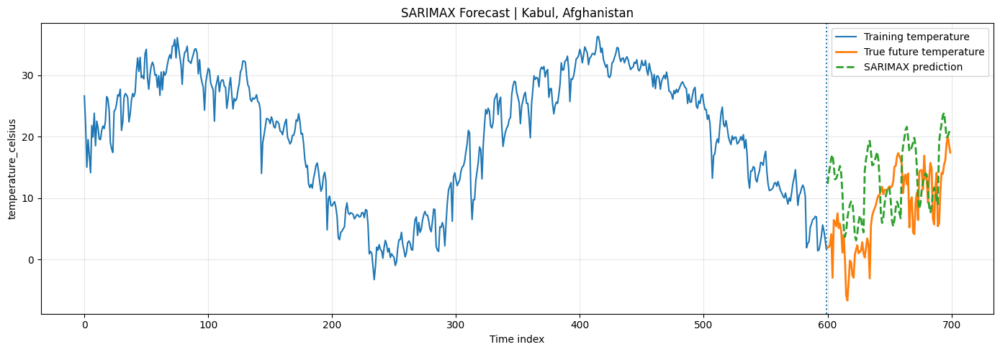

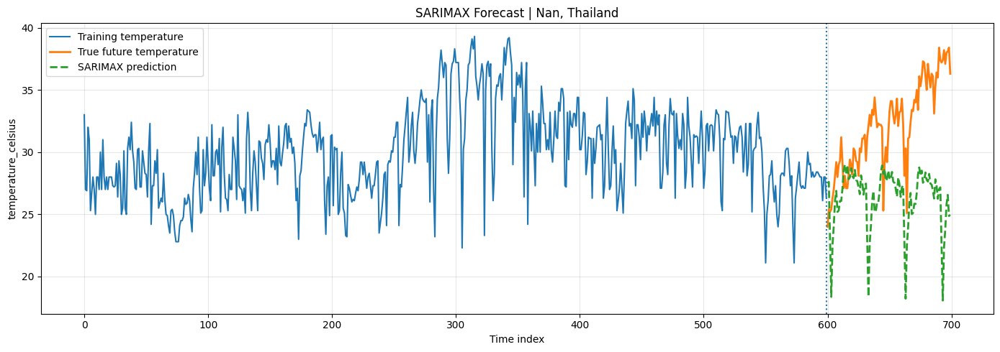

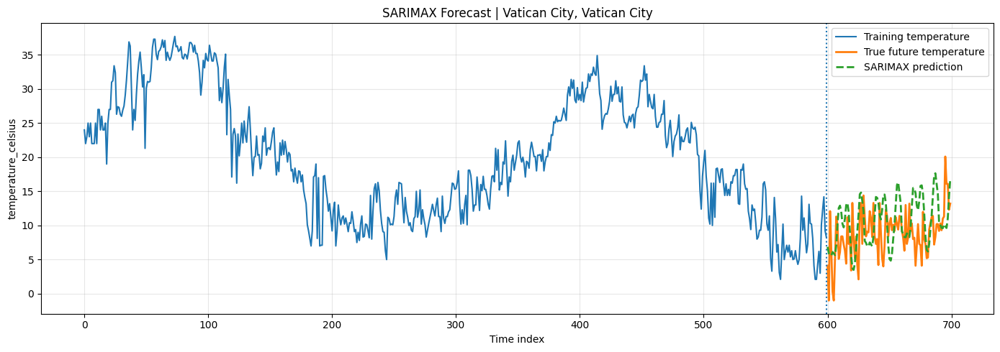

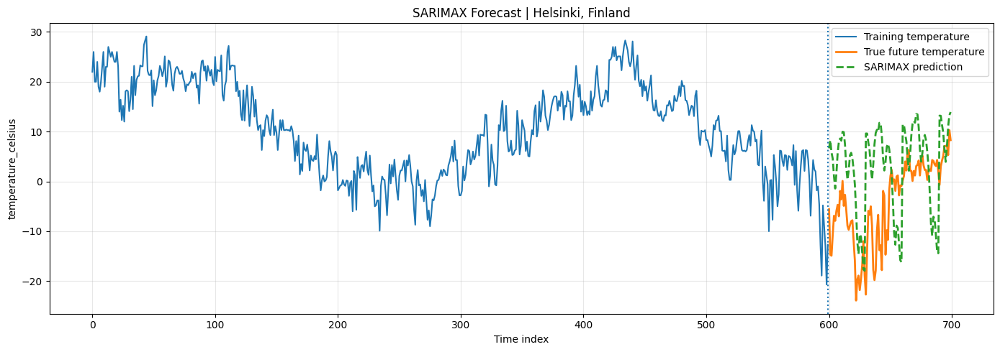

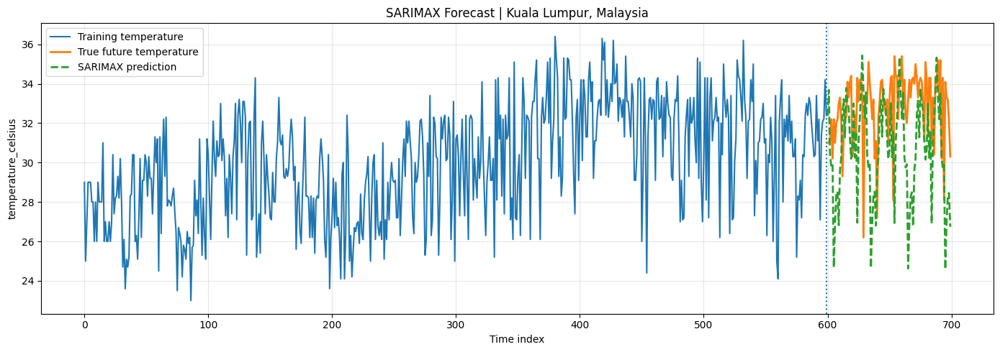

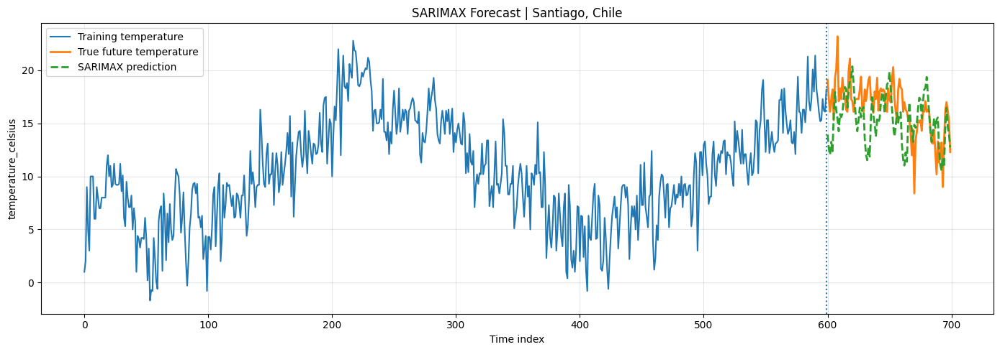

In [ ]:
# Plot sample predictions
sample_indices = [0, 1, 2, 50, 99, 150]
for idx in sample_indices:
    if idx >= len(city_order):
        continue
    country = city_order.loc[idx, "country"]
    city = city_order.loc[idx, "location_name"]
    train_series = X_main_train[idx]
    true_future = Y_test[idx]
    pred_future = Y_pred_sarimax[idx]
    plt.figure(figsize=(14, 5))
    plt.plot(np.arange(600),train_series,label="Training temperature",linewidth=1.5)
    plt.plot(np.arange(600, 700),true_future,label="True future temperature",linewidth=2)
    plt.plot(np.arange(600, 700),pred_future,label="SARIMAX prediction",linewidth=2,linestyle="--")
    plt.axvline(599,linestyle=":",linewidth=1.5)
    plt.title(f"SARIMAX Forecast | {city}, {country}")
    plt.xlabel("Time index")
    plt.ylabel("temperature_celsius")
    plt.legend()
    plt.grid(alpha=0.3)
    plt.tight_layout()
    plt.show()

In [ ]:
# Save selected prediction figures
for idx in sample_indices:
    if idx >= len(city_order):
        continue
    country = city_order.loc[idx, "country"]
    city = city_order.loc[idx, "location_name"]
    train_series = X_main_train[idx]
    true_future = Y_test[idx]
    pred_future = Y_pred_sarimax[idx]
    plt.figure(figsize=(14, 5))
    plt.plot(np.arange(600), train_series, label="Training temperature", linewidth=1.5)
    plt.plot(np.arange(600, 700), true_future, label="True future temperature", linewidth=2)
    plt.plot(np.arange(600, 700), pred_future, label="SARIMAX prediction", linewidth=2, linestyle="--")
    plt.axvline(599, linestyle=":", linewidth=1.5)
    plt.title(f"SARIMAX Forecast | {city}, {country}")
    plt.xlabel("Time index")
    plt.ylabel("temperature_celsius")
    plt.legend()
    plt.grid(alpha=0.3)
    plt.tight_layout()
    fig_name = f"SARIMAX_forecast_city_{idx}_{city.replace(' ', '_')}.png"
    plt.savefig(os.path.join(FIG_DIR, fig_name),dpi=300)
    plt.close()
print("Saved selected SARIMAX forecast figures to:")
print(FIG_DIR)

Saved selected SARIMAX forecast figures to:
/content/drive/MyDrive/Weather Trend Forecasting/prediction_outputs/model_outputs/SARIMAX/figures


In [ ]:
# Generic 20-step Forecast Evaluation

import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

MODEL_NAME = "SARIMAX"   # e.g. "SARIMAX", "Kalman_Filter", "VAR"
Y_pred_current = Y_pred_sarimax   # e.g. Y_pred_sarimax, Y_pred_kalman, Y_pred_var
MODEL_OUTPUT_DIR = os.path.join(
    BASE_DIR,
    "prediction_outputs",
    "model_outputs",
    MODEL_NAME)

SHORT_EVAL_DIR = os.path.join(
    MODEL_OUTPUT_DIR,
    "short_horizon_20step_evaluation")

SHORT_REPORT_DIR = os.path.join(
    SHORT_EVAL_DIR,
    "reports")

SHORT_FIG_DIR = os.path.join(
    SHORT_EVAL_DIR,
    "figures")

for p in [SHORT_EVAL_DIR, SHORT_REPORT_DIR, SHORT_FIG_DIR]:
    os.makedirs(p, exist_ok=True)
SHORT_HORIZON = 20
Y_true_20 = Y_test[:, :SHORT_HORIZON]
Y_pred_20 = Y_pred_current[:, :SHORT_HORIZON]
print("Y_true_20 shape:", Y_true_20.shape)
print("Y_pred_20 shape:", Y_pred_20.shape)
assert Y_true_20.shape == Y_pred_20.shape

Y_true_20 shape: (182, 20)
Y_pred_20 shape: (182, 20)


In [ ]:
# Metrics

def calculate_forecast_metrics(y_true, y_pred):
    y_true = np.asarray(y_true, dtype=float)
    y_pred = np.asarray(y_pred, dtype=float)
    mae = mean_absolute_error(y_true, y_pred)
    rmse = np.sqrt(mean_squared_error(y_true, y_pred))
    smape = np.mean(2 * np.abs(y_pred - y_true)
        / np.maximum(np.abs(y_true) + np.abs(y_pred), 1e-6)) * 100
    r2 = r2_score(y_true, y_pred)
    return {
        "MAE": mae,
        "RMSE": rmse,
        "SMAPE_%": smape,
        "R2": r2}

# Overall 20-step metrics
overall_20_metrics = calculate_forecast_metrics(
    Y_true_20.flatten(),
    Y_pred_20.flatten())
overall_20_metrics_df = pd.DataFrame([{
    "model": MODEL_NAME,
    "horizon": "600_to_620",
    "forecast_steps": SHORT_HORIZON,
    **overall_20_metrics}])
display(overall_20_metrics_df)

# City-level 20-step metrics
city_20_records = []
for city_idx in range(Y_true_20.shape[0]):
    country = city_order.loc[city_idx, "country"]
    city = city_order.loc[city_idx, "location_name"]
    metrics = calculate_forecast_metrics(
        Y_true_20[city_idx],
        Y_pred_20[city_idx])
    city_20_records.append({
        "city_index": city_idx,
        "country": country,
        "location_name": city,
        **metrics})
city_20_metrics_df = pd.DataFrame(city_20_records)
display(city_20_metrics_df.head())
display(city_20_metrics_df.describe())

,model,horizon,forecast_steps,MAE,RMSE,SMAPE_%,R2
0,SARIMAX,600_to_620,20,3.666833,5.491197,48.028982,0.805908


,city_index,country,location_name,MAE,RMSE,SMAPE_%,R2
0,0,Afghanistan,Kabul,9.720416,10.413535,136.792723,-5.678730
1,1,Thailand,Nan,2.515102,2.963618,9.659264,-1.914778
2,2,Vatican City,Vatican City,3.994829,4.740018,64.655961,-0.648542
3,3,Japan,Tokyo,2.902326,3.902761,27.412516,-0.553403
4,4,Jordan,Amman,3.295193,4.120168,37.911509,-0.651518


,city_index,MAE,RMSE,SMAPE_%,R2
count,182.000000,182.000000,182.000000,182.000000,182.000000
mean,90.500000,3.666833,4.363947,48.028982,-2.819552
std,52.683014,3.011310,3.342243,59.718872,3.502642
min,0.000000,0.506817,0.661426,1.807047,-20.082799
25%,45.250000,1.642507,1.995361,7.043517,-3.313632
50%,90.500000,2.662285,3.272032,15.435428,-1.821862
75%,135.750000,4.656067,5.467692,73.232639,-0.817490
max,181.000000,16.902856,18.040383,197.529596,0.579698


In [ ]:
# Save numeric results
overall_20_path = os.path.join(
    SHORT_REPORT_DIR,
    f"{MODEL_NAME}_overall_20step_metrics.csv")
city_20_path = os.path.join(
    SHORT_REPORT_DIR,
    f"{MODEL_NAME}_city_level_20step_metrics.csv")
pred_20_path = os.path.join(
    SHORT_REPORT_DIR,
    f"{MODEL_NAME}_20step_predictions.csv")
overall_20_metrics_df.to_csv(
    overall_20_path,
    index=False)
city_20_metrics_df.to_csv(
    city_20_path,
    index=False)
pd.DataFrame(Y_pred_20).to_csv(
    pred_20_path,
    index=False)
np.save(os.path.join(SHORT_REPORT_DIR,
        f"{MODEL_NAME}_20step_predictions.npy"),Y_pred_20)
print("Saved 20-step evaluation numeric results:")
print(overall_20_path)
print(city_20_path)
print(pred_20_path)

Saved 20-step evaluation numeric results:
/content/drive/MyDrive/Weather Trend Forecasting/prediction_outputs/model_outputs/SARIMAX/short_horizon_20step_evaluation/reports/SARIMAX_overall_20step_metrics.csv
/content/drive/MyDrive/Weather Trend Forecasting/prediction_outputs/model_outputs/SARIMAX/short_horizon_20step_evaluation/reports/SARIMAX_city_level_20step_metrics.csv
/content/drive/MyDrive/Weather Trend Forecasting/prediction_outputs/model_outputs/SARIMAX/short_horizon_20step_evaluation/reports/SARIMAX_20step_predictions.csv


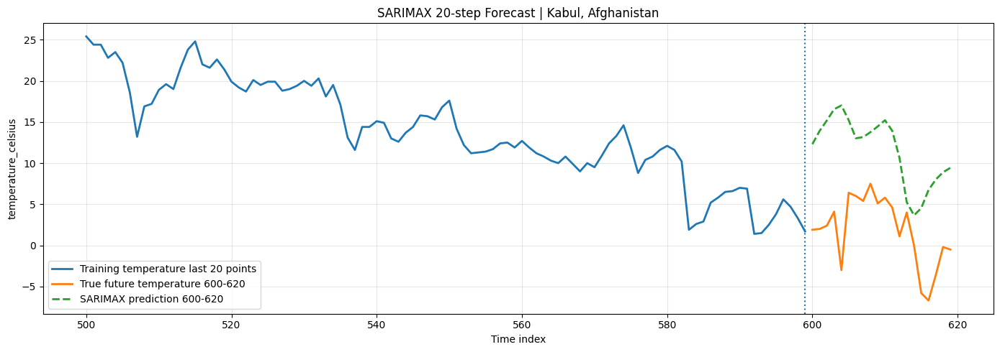

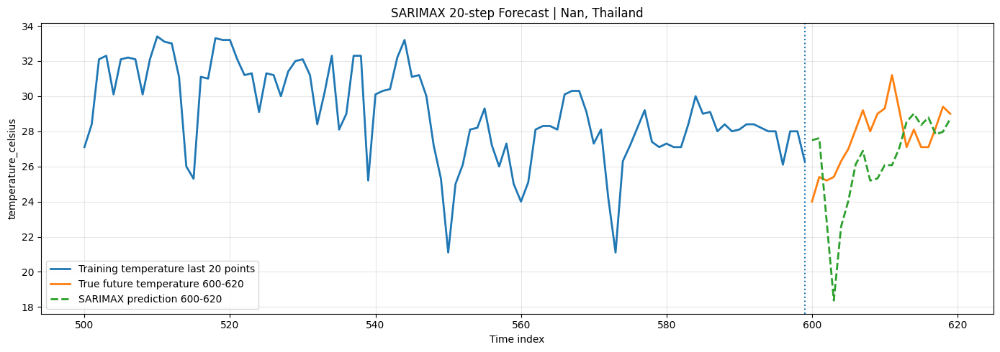

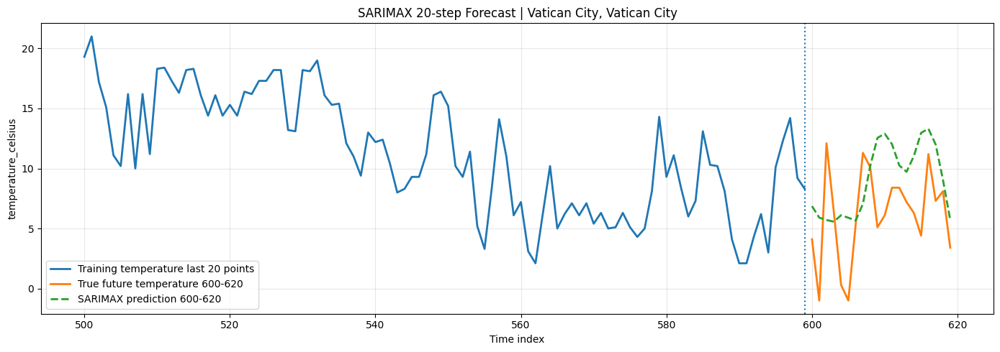

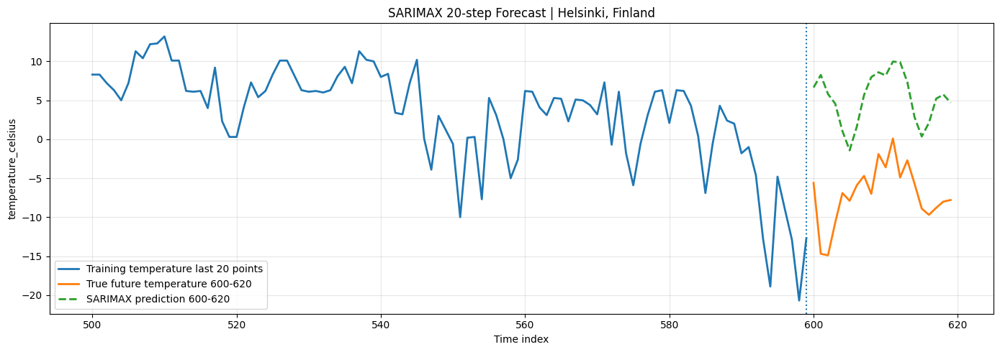

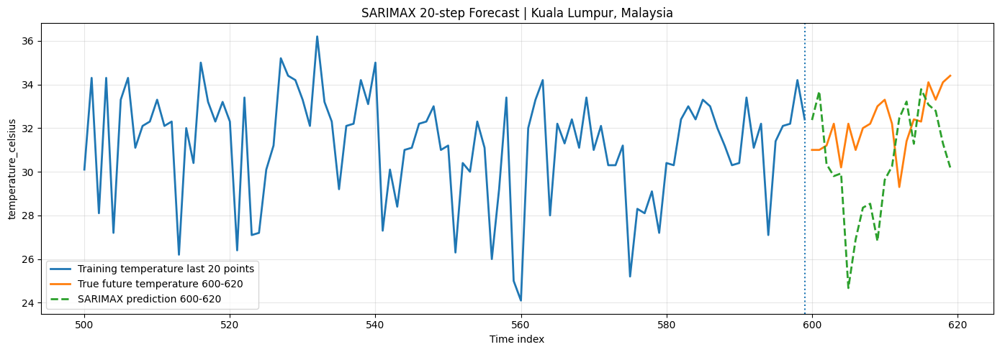

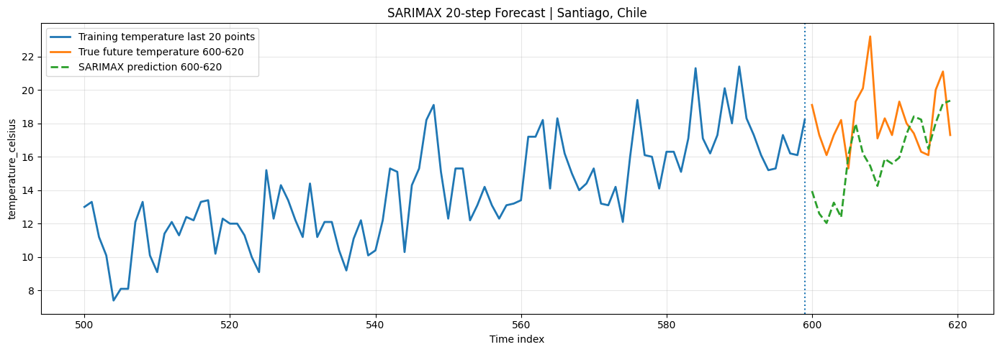

In [ ]:
# Visualization: selected cities
# Shows training 580-600 + true/predicted 600-620
sample_indices = [0, 1, 2, 50, 99, 150]
for idx in sample_indices:
    if idx >= len(city_order):
        continue
    country = city_order.loc[idx, "country"]
    city = city_order.loc[idx, "location_name"]
    plt.figure(figsize=(14, 5))

    # Last 20 training points
    plt.plot(np.arange(500, 600),
        X_main_train[idx, 500:600],
        label="Training temperature last 20 points",
        linewidth=2)

    # True future 20
    plt.plot(np.arange(600, 620),
        Y_true_20[idx],
        label="True future temperature 600-620",
        linewidth=2)

    # Pred future 20
    plt.plot(np.arange(600, 620),
        Y_pred_20[idx],
        label=f"{MODEL_NAME} prediction 600-620",
        linewidth=2,
        linestyle="--")

    plt.axvline(599,linestyle=":",linewidth=1.5)
    plt.title(f"{MODEL_NAME} 20-step Forecast | {city}, {country}")
    plt.xlabel("Time index")
    plt.ylabel("temperature_celsius")
    plt.legend()
    plt.grid(alpha=0.3)
    plt.tight_layout()
    plt.show()

In [ ]:
# Save selected 20-step figures
for idx in sample_indices:
    if idx >= len(city_order):
        continue
    country = city_order.loc[idx, "country"]
    city = city_order.loc[idx, "location_name"]
    plt.figure(figsize=(14, 5))
    plt.plot(np.arange(500, 600),
        X_main_train[idx, 500:600],
        label="Training temperature last 20 points",
        linewidth=2)
    plt.plot(np.arange(600, 620),
        Y_true_20[idx],
        label="True future temperature 600-620",
        linewidth=2)
    plt.plot(np.arange(600, 620),
        Y_pred_20[idx],
        label=f"{MODEL_NAME} prediction 600-620",
        linewidth=2,
        linestyle="--")
    plt.axvline(599,linestyle=":",linewidth=1.5)
    plt.title(f"{MODEL_NAME} 20-step Forecast | {city}, {country}")
    plt.xlabel("Time index")
    plt.ylabel("temperature_celsius")
    plt.legend()
    plt.grid(alpha=0.3)
    plt.tight_layout()
    fig_name = (f"{MODEL_NAME}_20step_forecast_city_{idx}_"
        f"{str(city).replace(' ', '_')}.png")
    plt.savefig(os.path.join(SHORT_FIG_DIR,fig_name),dpi=300)
    plt.close()
print("Saved 20-step forecast figures to:")
print(SHORT_FIG_DIR)

Saved 20-step forecast figures to:
/content/drive/MyDrive/Weather Trend Forecasting/prediction_outputs/model_outputs/SARIMAX/short_horizon_20step_evaluation/figures


**Kalman Filter**

In [ ]:
# Kalman Filter Temperature Forecasting
# Input:  temperature + 8 auxiliary features, shape (182, 600, 9)
# Output: temperature forecast, shape (182, 100)

import os
import warnings
warnings.filterwarnings("ignore")
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.linear_model import RidgeCV
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

BASE_DIR = "/content/drive/MyDrive/Weather Trend Forecasting"
MAIN_DIR = os.path.join(BASE_DIR,"prediction_outputs","temperature_main_dataset")
AUX_DIR = os.path.join(BASE_DIR,"prediction_outputs","temperature_auxiliary_dataset")
KALMAN_OUTPUT_DIR = os.path.join(BASE_DIR,"prediction_outputs","model_outputs","Kalman_Filter")
FIG_DIR = os.path.join(KALMAN_OUTPUT_DIR, "figures")
REPORT_DIR = os.path.join(KALMAN_OUTPUT_DIR, "reports")
PRED_DIR = os.path.join(KALMAN_OUTPUT_DIR, "predictions")
for p in [KALMAN_OUTPUT_DIR, FIG_DIR, REPORT_DIR, PRED_DIR]:
    os.makedirs(p, exist_ok=True)

X_main_train = np.load(os.path.join(MAIN_DIR, "temperature_train_input.npy"))
Y_test = np.load(os.path.join(MAIN_DIR, "temperature_test_target.npy"))
X_aux = np.load(os.path.join(AUX_DIR, "X_auxiliary_8features.npy"))
city_order = pd.read_csv(os.path.join(MAIN_DIR, "city_order.csv"))
aux_feature_names = pd.read_csv(
    os.path.join(AUX_DIR, "auxiliary_feature_names.csv")
)["feature_name"].tolist()

print("Main input:", X_main_train.shape)
print("Aux input:", X_aux.shape)
print("Target:", Y_test.shape)
print("Aux features:", aux_feature_names)
assert X_main_train.shape == (182, 600)
assert X_aux.shape == (182, 600, 8)
assert Y_test.shape == (182, 100)

Main input: (182, 600)
Aux input: (182, 600, 8)
Target: (182, 100)
Aux features: ['STL_trend_of_temperature', 'STL_seasonal_of_temperature', 'Gaussian_7_temperature', 'Gaussian_30_temperature', 'humidity', 'pressure_mb', 'uv_index', 'cloud']


In [ ]:
# Helper functions

FORECAST_STEPS = 100
def repeat_last_pattern(x, forecast_steps=100, pattern_len=30):
    x = np.asarray(x, dtype=float)
    if len(x) < pattern_len:
        pattern = x
    else:
        pattern = x[-pattern_len:]
    repeats = int(np.ceil(forecast_steps / len(pattern)))
    return np.tile(pattern, repeats)[:forecast_steps]


def linear_extrapolate(x, forecast_steps=100, fit_len=90):
    x = np.asarray(x, dtype=float)
    fit_len = min(fit_len, len(x))
    y_fit = x[-fit_len:]
    t_fit = np.arange(fit_len)
    if np.std(y_fit) < 1e-8:
        return np.full(forecast_steps, y_fit[-1])
    coef = np.polyfit(t_fit, y_fit, deg=1)
    t_future = np.arange(fit_len, fit_len + forecast_steps)
    return coef[0] * t_future + coef[1]


def build_future_exog_for_city(aux_train, aux_names, forecast_steps=100):
    future_exog = []
    for i, name in enumerate(aux_names):
        x = aux_train[:, i]
        if name in ["STL_trend_of_temperature",
            "Gaussian_30_temperature"]:
            future = linear_extrapolate(x,
                forecast_steps=forecast_steps,
                fit_len=90)
        else:
            future = repeat_last_pattern(x,
                forecast_steps=forecast_steps,
                pattern_len=30)
        future_exog.append(future)
    return np.stack(future_exog, axis=1)


def standardize_series(y):
    mean = np.mean(y)
    std = np.std(y)
    if std < 1e-8:
        std = 1.0
    return (y - mean) / std, mean, std


def inverse_standardize(y_scaled, mean, std):
    return y_scaled * std + mean


def standardize_exog(train_exog, future_exog):
    mean = train_exog.mean(axis=0)
    std = train_exog.std(axis=0)
    std[std < 1e-8] = 1.0
    train_scaled = (train_exog - mean) / std
    future_scaled = (future_exog - mean) / std
    return train_scaled, future_scaled


def calculate_metrics(y_true, y_pred):
    y_true = np.asarray(y_true, dtype=float)
    y_pred = np.asarray(y_pred, dtype=float)
    mae = mean_absolute_error(y_true, y_pred)
    rmse = np.sqrt(mean_squared_error(y_true, y_pred))
    smape = np.mean(2 * np.abs(y_pred - y_true)
        / np.maximum(np.abs(y_true) + np.abs(y_pred), 1e-6)) * 100
    r2 = r2_score(y_true, y_pred)
    return {
        "MAE": mae,
        "RMSE": rmse,
        "SMAPE_%": smape,
        "R2": r2}

In [ ]:
# Stable Damped Kalman Forecast for one city
# Replace the previous kalman_forecast_one_city()

from sklearn.linear_model import RidgeCV
import numpy as np
import pandas as pd

def kalman_forecast_one_city(
    y_train,
    aux_train,
    forecast_steps=100,
    damping=0.92,
    use_exog=True
):
    """
    Stable Damped Local Linear Trend Kalman Filter.
    State: x_t = [level_t, slope_t]
    Dynamics:
        level_t = level_{t-1} + damping * slope_{t-1} + small_exog_effect
        slope_t = damping * slope_{t-1}
    Observation: y_t = level_t + noise
    This version is designed for long-horizon temperature forecasting.
    """
    y_train = np.asarray(y_train, dtype=float)
    aux_train = np.asarray(aux_train, dtype=float)

    # Future auxiliary variables estimated from training only
    aux_future = build_future_exog_for_city(
        aux_train,
        aux_feature_names,
        forecast_steps=forecast_steps)

    # Standardization
    y_scaled, y_mean, y_std = standardize_series(y_train)
    aux_train_scaled, aux_future_scaled = standardize_exog(aux_train,aux_future)

    # Learn only a weak exogenous correction to temperature change
    if use_exog:
        dy = np.diff(y_scaled)
        # Use only the more physical auxiliary variables.
        # Avoid STL / Gaussian trend features as direct control in Kalman,
        # because they can duplicate the state trend and cause drift.
        preferred_aux_names = [
            "humidity",
            "pressure_mb",
            "uv_index",
            "cloud"]
        preferred_idx = [
            i for i, name in enumerate(aux_feature_names)
            if name in preferred_aux_names]
        if len(preferred_idx) > 0:
            U = aux_train_scaled[1:, preferred_idx]
            ridge = RidgeCV(
                alphas=np.logspace(-3, 3, 20))
            ridge.fit(U, dy)
            beta = ridge.coef_
            intercept = ridge.intercept_

            # shrink exogenous contribution to avoid long-horizon drift
            beta = beta * 0.15
            intercept = intercept * 0.15
            aux_future_used = aux_future_scaled[:, preferred_idx]
            ridge_alpha = ridge.alpha_
        else:
            beta = np.zeros(0)
            intercept = 0.0
            aux_future_used = np.zeros((forecast_steps, 0))
            ridge_alpha = np.nan
    else:
        beta = np.zeros(0)
        intercept = 0.0
        aux_future_used = np.zeros((forecast_steps, 0))
        ridge_alpha = np.nan

    # Kalman matrices
    F = np.array([
        [1.0, damping],
        [0.0, damping]])
    H = np.array([[1.0, 0.0]])
    dy_train = np.diff(y_scaled)
    q_base = max(np.var(dy_train), 1e-5)
    Q = np.array([
        [q_base * 0.05, 0.0],
        [0.0, q_base * 0.005]])
    R = np.array([[max(q_base * 0.2, 1e-5)]])
    initial_slope = np.mean(np.diff(y_scaled[:min(30, len(y_scaled))]))
    x = np.array([y_scaled[0],initial_slope])
    P = np.eye(2) * 0.1
    for t in range(1, len(y_scaled)):

        # Predict
        x_pred = F @ x
        P_pred = F @ P @ F.T + Q

        # Update
        y_obs = y_scaled[t]

        innovation = y_obs - (H @ x_pred)[0]
        S = H @ P_pred @ H.T + R
        K = P_pred @ H.T @ np.linalg.inv(S)
        x = x_pred + K.flatten() * innovation
        P = (np.eye(2) - K @ H) @ P_pred

    # Forecast future without observation update
    forecasts_scaled = []

    # Reasonable scaled bounds from training distribution
    lower_bound = np.percentile(y_scaled, 1) - 0.5
    upper_bound = np.percentile(y_scaled, 99) + 0.5
    for t in range(forecast_steps):
        exog_effect = 0.0
        if use_exog and len(beta) > 0:
            exog_effect = np.dot(aux_future_used[t], beta) + intercept

            # cap one-step exogenous effect
            exog_effect = np.clip(exog_effect, -0.08, 0.08)
        x = F @ x
        x[0] += exog_effect
        x[1] *= damping
        x[0] = np.clip(x[0], lower_bound, upper_bound)
        P = F @ P @ F.T + Q
        forecasts_scaled.append(x[0])
    forecasts_scaled = np.array(forecasts_scaled)
    forecasts = inverse_standardize(
        forecasts_scaled,
        y_mean,
        y_std)
    model_info = {
        "ridge_alpha": ridge_alpha,
        "damping": damping,
        "q_level": Q[0, 0],
        "q_slope": Q[1, 1],
        "r_obs": R[0, 0],
        "use_exog": use_exog}
    return forecasts, model_info

In [ ]:
# Train

all_predictions = []
all_metrics = []
status_records = []

for city_idx in range(X_main_train.shape[0]):
    country = city_order.loc[city_idx, "country"]
    city = city_order.loc[city_idx, "location_name"]
    print(f"[{city_idx + 1}/182] Kalman forecasting: {city}, {country}")
    y_train = X_main_train[city_idx]
    y_true = Y_test[city_idx]
    aux_train = X_aux[city_idx]
    try:
        y_pred, model_info = kalman_forecast_one_city(
            y_train,
            aux_train,
            forecast_steps=FORECAST_STEPS)
        status = "kalman_success"
    except Exception as e:
        print(f"    Kalman failed for {city}. Fallback to last-value. Error: {e}")
        y_pred = np.full(FORECAST_STEPS, y_train[-1])
        model_info = {
            "ridge_alpha": np.nan,
            "q_level": np.nan,
            "q_slope": np.nan,
            "r_obs": np.nan}
        status = "fallback_last_value"
    metrics = calculate_metrics(
        y_true,
        y_pred)
    all_predictions.append(y_pred)
    all_metrics.append({
        "city_index": city_idx,
        "country": country,
        "location_name": city,
        **metrics})
    status_records.append({
        "city_index": city_idx,
        "country": country,
        "location_name": city,
        "status": status,
        **model_info})

Y_pred_kalman = np.array(all_predictions)
kalman_metrics_df = pd.DataFrame(all_metrics)
kalman_status_df = pd.DataFrame(status_records)
print("Kalman prediction shape:", Y_pred_kalman.shape)
display(kalman_metrics_df.head())
display(kalman_status_df["status"].value_counts())

[1/182] Kalman forecasting: Kabul, Afghanistan
[2/182] Kalman forecasting: Nan, Thailand
[3/182] Kalman forecasting: Vatican City, Vatican City
[4/182] Kalman forecasting: Tokyo, Japan
[5/182] Kalman forecasting: Amman, Jordan
[6/182] Kalman forecasting: Baghdad, Iraq
[7/182] Kalman forecasting: Bujumbura, Burundi
[8/182] Kalman forecasting: Kyiv, Ukraine
[9/182] Kalman forecasting: Tashkent, Uzbekistan
[10/182] Kalman forecasting: Valletta, Malta
[11/182] Kalman forecasting: Accra, Ghana
[12/182] Kalman forecasting: Warsaw, Poland
[13/182] Kalman forecasting: Suva, Fiji Islands
[14/182] Kalman forecasting: Malabo, Equatorial Guinea
[15/182] Kalman forecasting: Asmara, Eritrea
[16/182] Kalman forecasting: N'djamena, Chad
[17/182] Kalman forecasting: Dakar, Senegal
[18/182] Kalman forecasting: Majuro, Marshall Islands
[19/182] Kalman forecasting: Lilongwe, Malawi
[20/182] Kalman forecasting: Maputo, Mozambique
[21/182] Kalman forecasting: Abu Dhabi, United Arab Emirates
[22/182] Kalman 

,city_index,country,location_name,MAE,RMSE,SMAPE_%,R2
0,0,Afghanistan,Kabul,10.672572,12.708573,182.775969,-3.167166
1,1,Thailand,Nan,6.613783,7.472007,22.271557,-3.365199
2,2,Vatican City,Vatican City,3.993623,5.035853,51.365312,-1.107079
3,3,Japan,Tokyo,3.805310,4.895158,29.558218,0.039045
4,4,Jordan,Amman,7.943442,8.696515,113.303122,-6.442920


,count
status,
kalman_success,182


In [ ]:
# Overall metrics
overall_metrics = calculate_metrics(Y_test.flatten(),Y_pred_kalman.flatten())
kalman_overall_metrics_df = pd.DataFrame([{
    "model": "Kalman_Filter_with_Exogenous_Control",
    **overall_metrics}])
display(kalman_overall_metrics_df)
display(kalman_metrics_df.describe())

,model,MAE,RMSE,SMAPE_%,R2
0,Kalman_Filter_with_Exogenous_Control,5.8227,8.084604,62.798368,0.45177


,city_index,MAE,RMSE,SMAPE_%,R2
count,182.000000,182.000000,182.000000,182.000000,182.000000
mean,90.500000,5.822700,6.643158,62.798368,-4.150409
std,52.683014,4.177018,4.620235,67.666360,4.283955
min,0.000000,0.649278,0.832702,2.595672,-26.906941
25%,45.250000,2.358079,2.784550,10.039328,-5.719752
50%,90.500000,4.292497,5.099148,25.232782,-3.010841
75%,135.750000,9.082496,10.572339,125.600186,-1.282973
max,181.000000,17.375179,19.865938,199.214362,0.604396


In [ ]:
# Save predictions and metrics
np.save(os.path.join(PRED_DIR, "Y_pred_kalman.npy"),Y_pred_kalman)
pd.DataFrame(Y_pred_kalman).to_csv(os.path.join(PRED_DIR, "Y_pred_kalman.csv"),index=False)
kalman_metrics_df.to_csv(os.path.join(REPORT_DIR, "kalman_city_level_metrics.csv"),index=False)
kalman_overall_metrics_df.to_csv(os.path.join(REPORT_DIR, "kalman_overall_metrics.csv"),index=False)
kalman_status_df.to_csv(os.path.join(REPORT_DIR, "kalman_model_status.csv"),index=False)
print("Saved Kalman model outputs to:")
print(KALMAN_OUTPUT_DIR)

Saved Kalman model outputs to:
/content/drive/MyDrive/Weather Trend Forecasting/prediction_outputs/model_outputs/Kalman_Filter


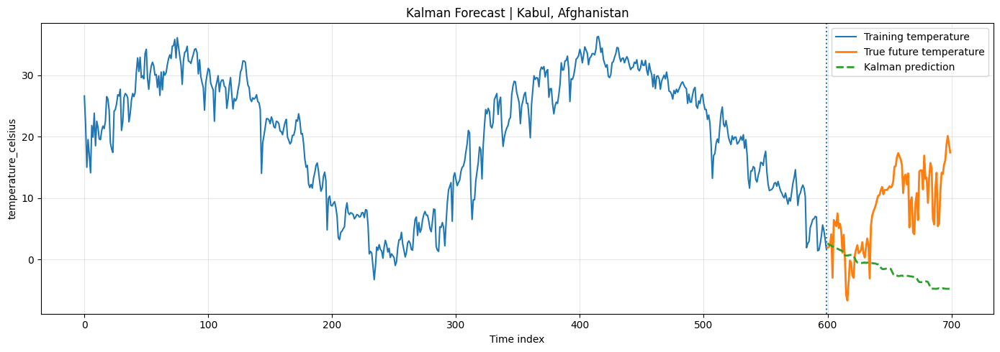

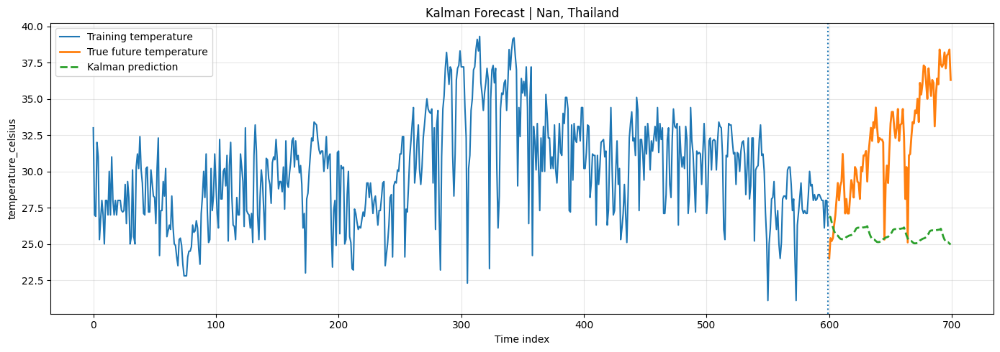

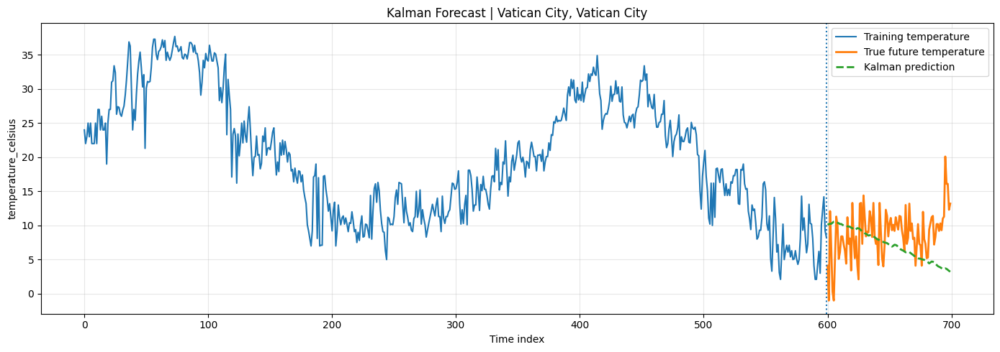

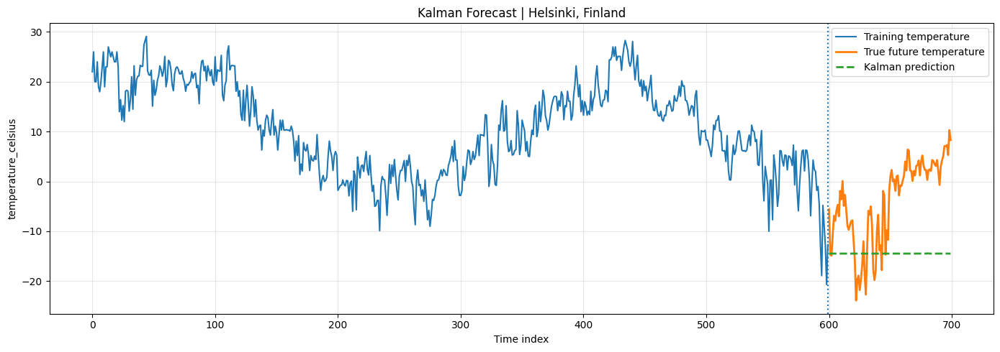

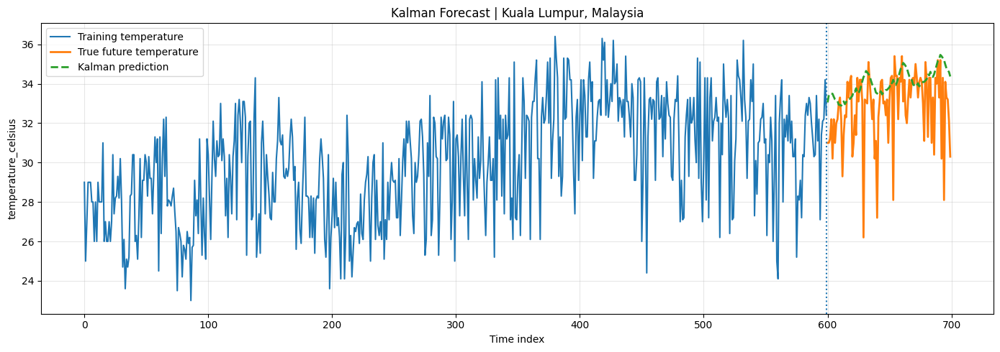

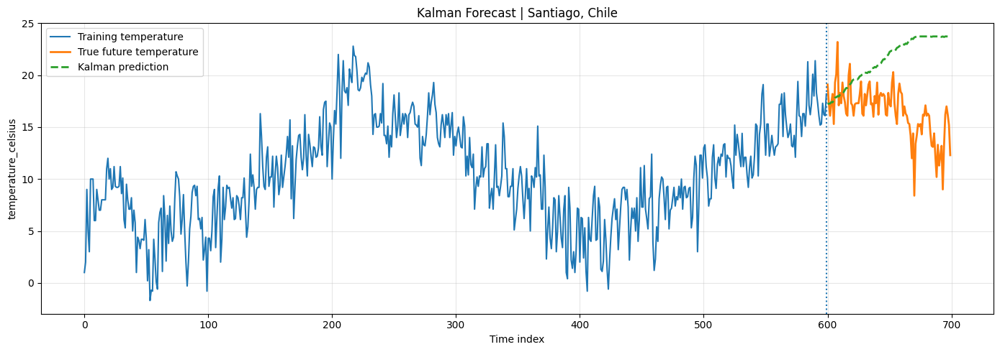

In [ ]:
# Visualization: selected cities
sample_indices = [0, 1, 2, 50, 99, 150]
for idx in sample_indices:
    if idx >= len(city_order):
        continue
    country = city_order.loc[idx, "country"]
    city = city_order.loc[idx, "location_name"]
    train_series = X_main_train[idx]
    true_future = Y_test[idx]
    pred_future = Y_pred_kalman[idx]
    plt.figure(figsize=(14, 5))
    plt.plot(
        np.arange(600),
        train_series,
        label="Training temperature",
        linewidth=1.5)
    plt.plot(
        np.arange(600, 700),
        true_future,
        label="True future temperature",
        linewidth=2)
    plt.plot(
        np.arange(600, 700),
        pred_future,
        label="Kalman prediction",
        linewidth=2,
        linestyle="--")
    plt.axvline(
        599,
        linestyle=":",
        linewidth=1.5)
    plt.title(f"Kalman Forecast | {city}, {country}")
    plt.xlabel("Time index")
    plt.ylabel("temperature_celsius")
    plt.legend()
    plt.grid(alpha=0.3)
    plt.tight_layout()
    plt.show()

In [ ]:
# Save selected figures
for idx in sample_indices:
    if idx >= len(city_order):
        continue
    country = city_order.loc[idx, "country"]
    city = city_order.loc[idx, "location_name"]
    train_series = X_main_train[idx]
    true_future = Y_test[idx]
    pred_future = Y_pred_kalman[idx]
    plt.figure(figsize=(14, 5))
    plt.plot(np.arange(600),train_series,label="Training temperature",linewidth=1.5)
    plt.plot(np.arange(600, 700),true_future,label="True future temperature",linewidth=2)
    plt.plot(np.arange(600, 700),pred_future,label="Kalman prediction",linewidth=2,linestyle="--")
    plt.axvline(599,linestyle=":",linewidth=1.5)
    plt.title(f"Kalman Forecast | {city}, {country}")
    plt.xlabel("Time index")
    plt.ylabel("temperature_celsius")
    plt.legend()
    plt.grid(alpha=0.3)
    plt.tight_layout()
    fig_name = f"Kalman_forecast_city_{idx}_{str(city).replace(' ', '_')}.png"
    plt.savefig(os.path.join(FIG_DIR, fig_name),dpi=300)
    plt.close()
print("Saved Kalman forecast figures to:")
print(FIG_DIR)

Saved Kalman forecast figures to:
/content/drive/MyDrive/Weather Trend Forecasting/prediction_outputs/model_outputs/Kalman_Filter/figures


In [ ]:
# Generic 20-step Forecast Evaluation

import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

MODEL_NAME = "Kalman_Filter"   # e.g. "SARIMAX", "Kalman_Filter", "VAR"
Y_pred_current = Y_pred_kalman   # e.g. Y_pred_sarimax, Y_pred_kalman, Y_pred_var
MODEL_OUTPUT_DIR = os.path.join(
    BASE_DIR,
    "prediction_outputs",
    "model_outputs",
    MODEL_NAME)

SHORT_EVAL_DIR = os.path.join(
    MODEL_OUTPUT_DIR,
    "short_horizon_20step_evaluation")

SHORT_REPORT_DIR = os.path.join(
    SHORT_EVAL_DIR,
    "reports")

SHORT_FIG_DIR = os.path.join(
    SHORT_EVAL_DIR,
    "figures")

for p in [SHORT_EVAL_DIR, SHORT_REPORT_DIR, SHORT_FIG_DIR]:
    os.makedirs(p, exist_ok=True)
SHORT_HORIZON = 20
Y_true_20 = Y_test[:, :SHORT_HORIZON]
Y_pred_20 = Y_pred_current[:, :SHORT_HORIZON]
print("Y_true_20 shape:", Y_true_20.shape)
print("Y_pred_20 shape:", Y_pred_20.shape)
assert Y_true_20.shape == Y_pred_20.shape

Y_true_20 shape: (182, 20)
Y_pred_20 shape: (182, 20)


In [ ]:
# Metrics

def calculate_forecast_metrics(y_true, y_pred):
    y_true = np.asarray(y_true, dtype=float)
    y_pred = np.asarray(y_pred, dtype=float)
    mae = mean_absolute_error(y_true, y_pred)
    rmse = np.sqrt(mean_squared_error(y_true, y_pred))
    smape = np.mean(2 * np.abs(y_pred - y_true)
        / np.maximum(np.abs(y_true) + np.abs(y_pred), 1e-6)) * 100
    r2 = r2_score(y_true, y_pred)
    return {
        "MAE": mae,
        "RMSE": rmse,
        "SMAPE_%": smape,
        "R2": r2}

# Overall 20-step metrics
overall_20_metrics = calculate_forecast_metrics(
    Y_true_20.flatten(),
    Y_pred_20.flatten())
overall_20_metrics_df = pd.DataFrame([{
    "model": MODEL_NAME,
    "horizon": "600_to_620",
    "forecast_steps": SHORT_HORIZON,
    **overall_20_metrics}])
display(overall_20_metrics_df)

# City-level 20-step metrics
city_20_records = []
for city_idx in range(Y_true_20.shape[0]):
    country = city_order.loc[city_idx, "country"]
    city = city_order.loc[city_idx, "location_name"]
    metrics = calculate_forecast_metrics(
        Y_true_20[city_idx],
        Y_pred_20[city_idx])
    city_20_records.append({
        "city_index": city_idx,
        "country": country,
        "location_name": city,
        **metrics})
city_20_metrics_df = pd.DataFrame(city_20_records)
display(city_20_metrics_df.head())
display(city_20_metrics_df.describe())

,model,horizon,forecast_steps,MAE,RMSE,SMAPE_%,R2
0,Kalman_Filter,600_to_620,20,3.452896,4.974452,45.586659,0.840719


,city_index,country,location_name,MAE,RMSE,SMAPE_%,R2
0,0,Afghanistan,Kabul,3.054443,3.731276,120.813461,0.142543
1,1,Thailand,Nan,2.563925,2.878419,9.502069,-1.749598
2,2,Vatican City,Vatican City,4.380915,5.460609,64.043988,-1.187873
3,3,Japan,Tokyo,2.297602,3.005697,22.501176,0.078637
4,4,Jordan,Amman,3.653232,4.433797,51.862138,-0.912515


,city_index,MAE,RMSE,SMAPE_%,R2
count,182.000000,182.000000,182.000000,182.000000,182.000000
mean,90.500000,3.452896,4.028861,45.586659,-2.700165
std,52.683014,2.651054,2.925830,55.359808,4.675890
min,0.000000,0.485928,0.575858,1.912726,-34.362235
25%,45.250000,1.508480,1.817098,6.547288,-2.819621
50%,90.500000,2.568859,3.135615,15.643137,-1.219358
75%,135.750000,4.665311,5.646763,73.077246,-0.402260
max,181.000000,16.186643,18.870105,196.071809,0.393376


In [ ]:
# Save numeric results
overall_20_path = os.path.join(
    SHORT_REPORT_DIR,
    f"{MODEL_NAME}_overall_20step_metrics.csv")
city_20_path = os.path.join(
    SHORT_REPORT_DIR,
    f"{MODEL_NAME}_city_level_20step_metrics.csv")
pred_20_path = os.path.join(
    SHORT_REPORT_DIR,
    f"{MODEL_NAME}_20step_predictions.csv")
overall_20_metrics_df.to_csv(
    overall_20_path,
    index=False)
city_20_metrics_df.to_csv(
    city_20_path,
    index=False)
pd.DataFrame(Y_pred_20).to_csv(
    pred_20_path,
    index=False)
np.save(os.path.join(SHORT_REPORT_DIR,
        f"{MODEL_NAME}_20step_predictions.npy"),Y_pred_20)
print("Saved 20-step evaluation numeric results:")
print(overall_20_path)
print(city_20_path)
print(pred_20_path)

Saved 20-step evaluation numeric results:
/content/drive/MyDrive/Weather Trend Forecasting/prediction_outputs/model_outputs/Kalman_Filter/short_horizon_20step_evaluation/reports/Kalman_Filter_overall_20step_metrics.csv
/content/drive/MyDrive/Weather Trend Forecasting/prediction_outputs/model_outputs/Kalman_Filter/short_horizon_20step_evaluation/reports/Kalman_Filter_city_level_20step_metrics.csv
/content/drive/MyDrive/Weather Trend Forecasting/prediction_outputs/model_outputs/Kalman_Filter/short_horizon_20step_evaluation/reports/Kalman_Filter_20step_predictions.csv


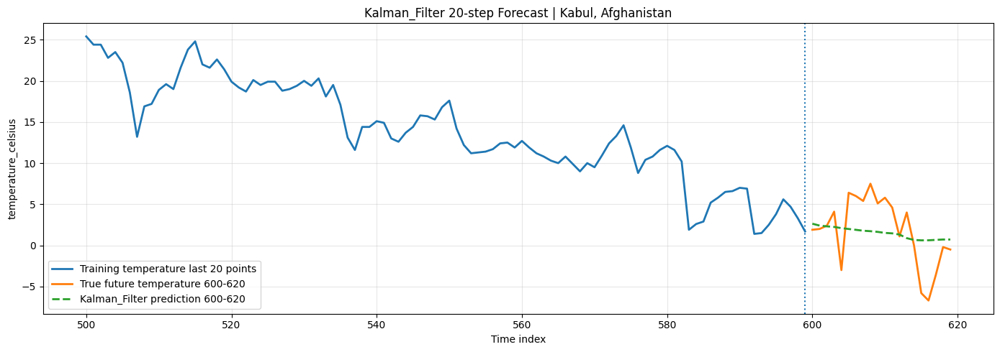

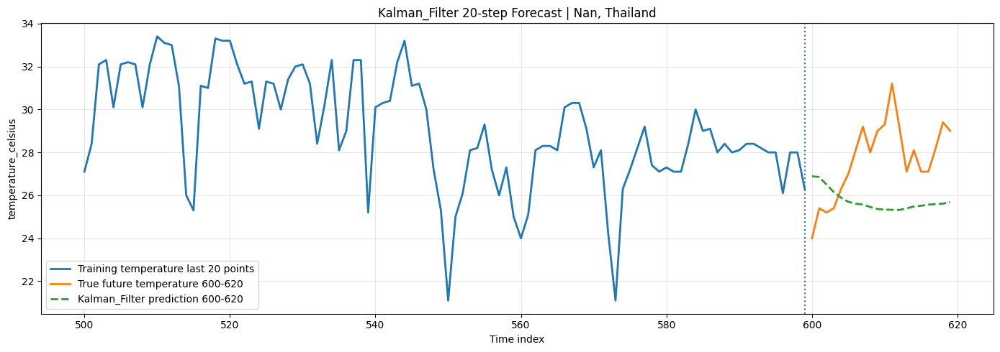

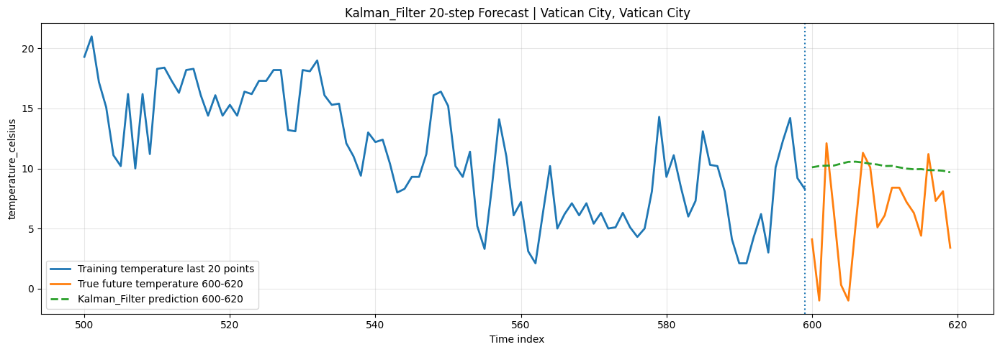

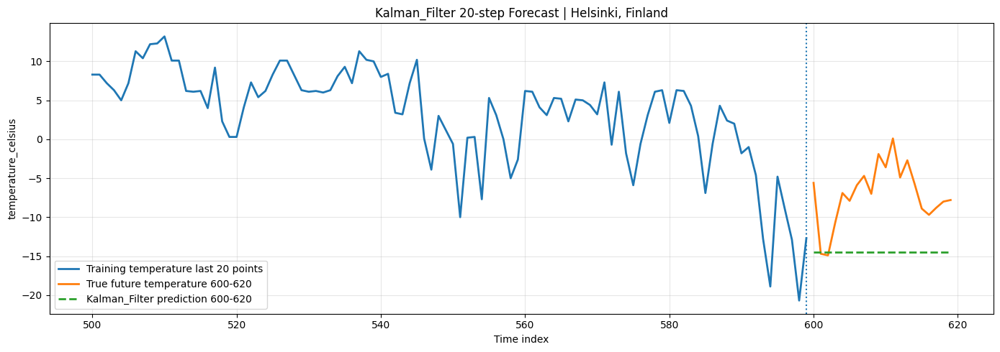

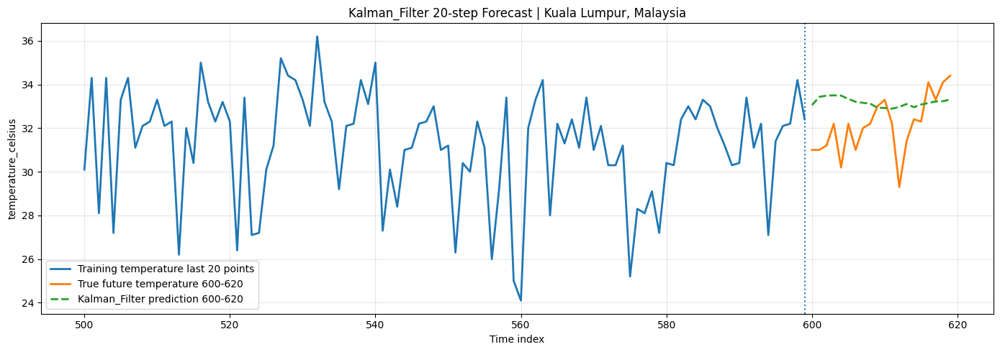

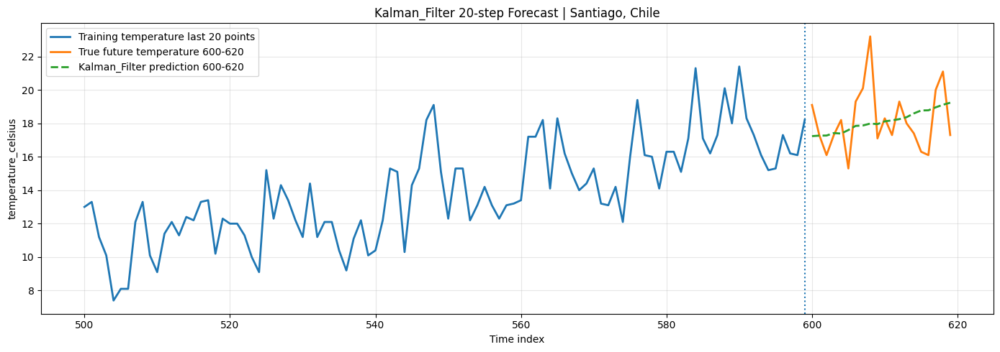

In [ ]:
# Visualization: selected cities
# Shows training 580-600 + true/predicted 600-620
sample_indices = [0, 1, 2, 50, 99, 150]
for idx in sample_indices:
    if idx >= len(city_order):
        continue
    country = city_order.loc[idx, "country"]
    city = city_order.loc[idx, "location_name"]
    plt.figure(figsize=(14, 5))

    # Last 20 training points
    plt.plot(np.arange(500, 600),
        X_main_train[idx, 500:600],
        label="Training temperature last 20 points",
        linewidth=2)

    # True future 20
    plt.plot(np.arange(600, 620),
        Y_true_20[idx],
        label="True future temperature 600-620",
        linewidth=2)

    # Pred future 20
    plt.plot(np.arange(600, 620),
        Y_pred_20[idx],
        label=f"{MODEL_NAME} prediction 600-620",
        linewidth=2,
        linestyle="--")

    plt.axvline(599,linestyle=":",linewidth=1.5)
    plt.title(f"{MODEL_NAME} 20-step Forecast | {city}, {country}")
    plt.xlabel("Time index")
    plt.ylabel("temperature_celsius")
    plt.legend()
    plt.grid(alpha=0.3)
    plt.tight_layout()
    plt.show()

In [ ]:
# Save selected 20-step figures
for idx in sample_indices:
    if idx >= len(city_order):
        continue
    country = city_order.loc[idx, "country"]
    city = city_order.loc[idx, "location_name"]
    plt.figure(figsize=(14, 5))
    plt.plot(np.arange(500, 600),
        X_main_train[idx, 500:600],
        label="Training temperature last 20 points",
        linewidth=2)
    plt.plot(np.arange(600, 620),
        Y_true_20[idx],
        label="True future temperature 600-620",
        linewidth=2)
    plt.plot(np.arange(600, 620),
        Y_pred_20[idx],
        label=f"{MODEL_NAME} prediction 600-620",
        linewidth=2,
        linestyle="--")
    plt.axvline(599,linestyle=":",linewidth=1.5)
    plt.title(f"{MODEL_NAME} 20-step Forecast | {city}, {country}")
    plt.xlabel("Time index")
    plt.ylabel("temperature_celsius")
    plt.legend()
    plt.grid(alpha=0.3)
    plt.tight_layout()
    fig_name = (f"{MODEL_NAME}_20step_forecast_city_{idx}_"
        f"{str(city).replace(' ', '_')}.png")
    plt.savefig(os.path.join(SHORT_FIG_DIR,fig_name),dpi=300)
    plt.close()
print("Saved 20-step forecast figures to:")
print(SHORT_FIG_DIR)

Saved 20-step forecast figures to:
/content/drive/MyDrive/Weather Trend Forecasting/prediction_outputs/model_outputs/Kalman_Filter/short_horizon_20step_evaluation/figures


**VAR（Vector AutoRegression）**

In [ ]:
# VAR Forecasting for Temperature
# Input:  temperature + 8 auxiliary features, shape (182, 600, 9)
# Output: temperature forecast, shape (182, 100)

import os
import warnings
warnings.filterwarnings("ignore")
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from statsmodels.tsa.api import VAR
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

BASE_DIR = "/content/drive/MyDrive/Weather Trend Forecasting"
MAIN_DIR = os.path.join(BASE_DIR,"prediction_outputs","temperature_main_dataset")
AUX_DIR = os.path.join(BASE_DIR,"prediction_outputs","temperature_auxiliary_dataset")
VAR_OUTPUT_DIR = os.path.join(BASE_DIR,"prediction_outputs","model_outputs","VAR")
FIG_DIR = os.path.join(VAR_OUTPUT_DIR, "figures")
REPORT_DIR = os.path.join(VAR_OUTPUT_DIR, "reports")
PRED_DIR = os.path.join(VAR_OUTPUT_DIR, "predictions")
for p in [VAR_OUTPUT_DIR, FIG_DIR, REPORT_DIR, PRED_DIR]:
    os.makedirs(p, exist_ok=True)

X_main_train = np.load(os.path.join(MAIN_DIR, "temperature_train_input.npy"))
Y_test = np.load(os.path.join(MAIN_DIR, "temperature_test_target.npy"))
X_aux = np.load(os.path.join(AUX_DIR, "X_auxiliary_8features.npy"))
city_order = pd.read_csv(os.path.join(MAIN_DIR, "city_order.csv"))
aux_feature_names = pd.read_csv(
    os.path.join(AUX_DIR, "auxiliary_feature_names.csv")
)["feature_name"].tolist()
var_feature_names = ["temperature_celsius"] + aux_feature_names

print("Main input:", X_main_train.shape)
print("Aux input:", X_aux.shape)
print("Target:", Y_test.shape)
print("VAR features:", var_feature_names)
assert X_main_train.shape == (182, 600)
assert X_aux.shape == (182, 600, 8)
assert Y_test.shape == (182, 100)

Main input: (182, 600)
Aux input: (182, 600, 8)
Target: (182, 100)
VAR features: ['temperature_celsius', 'STL_trend_of_temperature', 'STL_seasonal_of_temperature', 'Gaussian_7_temperature', 'Gaussian_30_temperature', 'humidity', 'pressure_mb', 'uv_index', 'cloud']


In [ ]:
# Helper functions
FORECAST_STEPS = 100
def calculate_metrics(y_true, y_pred):
    y_true = np.asarray(y_true, dtype=float)
    y_pred = np.asarray(y_pred, dtype=float)
    mae = mean_absolute_error(y_true, y_pred)
    rmse = np.sqrt(mean_squared_error(y_true, y_pred))
    smape = np.mean(2 * np.abs(y_pred - y_true)
        / np.maximum(np.abs(y_true) + np.abs(y_pred), 1e-6)) * 100
    r2 = r2_score(y_true, y_pred)
    return {
        "MAE": mae,
        "RMSE": rmse,
        "SMAPE_%": smape,
        "R2": r2}


def standardize_matrix(X):
    mean = X.mean(axis=0)
    std = X.std(axis=0)
    std[std < 1e-8] = 1.0
    X_scaled = (X - mean) / std
    return X_scaled, mean, std


def inverse_temperature_scale(temp_scaled, mean, std):
    return temp_scaled * std[0] + mean[0]


def safe_clip_forecast(y_pred, y_train, margin=5.0):
    """
    Prevent rare unstable VAR explosions.
    Clipping is based only on training range.
    """
    lower = np.nanmin(y_train) - margin
    upper = np.nanmax(y_train) + margin
    return np.clip(y_pred, lower, upper)


def last_value_forecast(y_train, steps=100):
    return np.full(steps, y_train[-1])


def seasonal_naive_forecast(y_train, steps=100, period=30):
    """
    Repeat the latest period pattern.
    This is used only as fallback if VAR fails or explodes.
    """
    if len(y_train) < period:
        return last_value_forecast(y_train, steps)
    pattern = y_train[-period:]
    repeats = int(np.ceil(steps / period))
    return np.tile(pattern, repeats)[:steps]


def build_var_input_for_city(city_idx):
    temp = X_main_train[city_idx].reshape(-1, 1)
    aux = X_aux[city_idx]
    X = np.concatenate([temp, aux],axis=1)
    X = pd.DataFrame(X,columns=var_feature_names)
    X = X.replace([np.inf, -np.inf], np.nan)
    X = X.interpolate(limit_direction="both")
    X = X.fillna(method="ffill").fillna(method="bfill")
    return X.values.astype(float)


def choose_var_lag_and_fit(X_scaled, maxlags=15):
    # Try selecting lag by AIC, then fallback to smaller lags.
    model = VAR(X_scaled)
    try:
        selected = model.select_order(maxlags=maxlags)
        lag = selected.aic
        if lag is None or lag < 1:
            lag = 1
        lag = int(lag)
    except Exception:
        lag = 5
    candidate_lags = list(dict.fromkeys([lag,min(lag, 10),7,5,3,2,1]))
    last_error = None
    for p in candidate_lags:
        try:
            fitted = model.fit(
                maxlags=p,
                ic=None,
                trend="c")
            return fitted, p, "var_success"
        except Exception as e:
            last_error = e
            continue
    raise RuntimeError(f"VAR fitting failed. Last error: {last_error}")


def var_forecast_one_city(city_idx, forecast_steps=100):
    # Fit VAR for one city and forecast future temperature.
    y_train = X_main_train[city_idx].astype(float)
    X = build_var_input_for_city(city_idx)
    X_scaled, mean, std = standardize_matrix(X)
    try:
        fitted, selected_lag, status = choose_var_lag_and_fit(X_scaled,maxlags=15)
        lag_order = fitted.k_ar
        forecast_input = X_scaled[-lag_order:]
        forecast_scaled = fitted.forecast(
            y=forecast_input,
            steps=forecast_steps)
        temp_forecast_scaled = forecast_scaled[:, 0]
        y_pred = inverse_temperature_scale(temp_forecast_scaled,mean,std)

        # Prevent rare unstable explosions
        y_pred = safe_clip_forecast(y_pred,y_train,margin=5.0)

        # If prediction becomes numerically unstable, fallback
        if (np.any(~np.isfinite(y_pred)) or
            np.std(y_pred) > 5 * np.std(y_train)):
            y_pred = seasonal_naive_forecast(
                y_train,
                steps=forecast_steps,
                period=30)
            status = "fallback_seasonal_naive_unstable"
            selected_lag = np.nan

        return y_pred, {
            "status": status,
            "selected_lag": selected_lag,
            "aic": fitted.aic if status == "var_success" else np.nan,
            "bic": fitted.bic if status == "var_success" else np.nan}
    except Exception as e:
        y_pred = seasonal_naive_forecast(
            y_train,
            steps=forecast_steps,
            period=30)
        return y_pred, {
            "status": f"fallback_seasonal_naive_failed",
            "selected_lag": np.nan,
            "aic": np.nan,
            "bic": np.nan}

In [ ]:
# Run VAR for all 182 cities

all_predictions = []
all_metrics = []
status_records = []

for city_idx in range(X_main_train.shape[0]):
    country = city_order.loc[city_idx, "country"]
    city = city_order.loc[city_idx, "location_name"]
    print(f"[{city_idx + 1}/182] VAR forecasting: {city}, {country}")
    y_true = Y_test[city_idx].astype(float)
    y_pred, model_info = var_forecast_one_city(
        city_idx,
        forecast_steps=FORECAST_STEPS)
    metrics = calculate_metrics(
        y_true,
        y_pred)
    all_predictions.append(y_pred)
    all_metrics.append({
        "city_index": city_idx,
        "country": country,
        "location_name": city,
        **metrics})
    status_records.append({
        "city_index": city_idx,
        "country": country,
        "location_name": city,
        **model_info})

Y_pred_var = np.array(all_predictions)
var_metrics_df = pd.DataFrame(all_metrics)
var_status_df = pd.DataFrame(status_records)
print("VAR prediction shape:", Y_pred_var.shape)
display(var_metrics_df.head())
display(var_status_df["status"].value_counts())
display(var_status_df.head())

[1/182] VAR forecasting: Kabul, Afghanistan
[2/182] VAR forecasting: Nan, Thailand
[3/182] VAR forecasting: Vatican City, Vatican City
[4/182] VAR forecasting: Tokyo, Japan
[5/182] VAR forecasting: Amman, Jordan
[6/182] VAR forecasting: Baghdad, Iraq
[7/182] VAR forecasting: Bujumbura, Burundi
[8/182] VAR forecasting: Kyiv, Ukraine
[9/182] VAR forecasting: Tashkent, Uzbekistan
[10/182] VAR forecasting: Valletta, Malta
[11/182] VAR forecasting: Accra, Ghana
[12/182] VAR forecasting: Warsaw, Poland
[13/182] VAR forecasting: Suva, Fiji Islands
[14/182] VAR forecasting: Malabo, Equatorial Guinea
[15/182] VAR forecasting: Asmara, Eritrea
[16/182] VAR forecasting: N'djamena, Chad
[17/182] VAR forecasting: Dakar, Senegal
[18/182] VAR forecasting: Majuro, Marshall Islands
[19/182] VAR forecasting: Lilongwe, Malawi
[20/182] VAR forecasting: Maputo, Mozambique
[21/182] VAR forecasting: Abu Dhabi, United Arab Emirates
[22/182] VAR forecasting: Port Vila, Vanuatu
[23/182] VAR forecasting: Rome, It

,city_index,country,location_name,MAE,RMSE,SMAPE_%,R2
0,0,Afghanistan,Kabul,6.813947,7.950940,123.787624,-0.631113
1,1,Thailand,Nan,3.013775,3.499117,9.469288,0.042703
2,2,Vatican City,Vatican City,7.018910,8.187548,60.753209,-4.569836
3,3,Japan,Tokyo,7.468905,8.551056,72.979034,-1.932304
4,4,Jordan,Amman,9.911243,10.784318,160.899283,-10.445590


,count
status,
var_success,182


,city_index,country,location_name,status,selected_lag,aic,bic
0,0,Afghanistan,Kabul,var_success,12,-124.583467,-117.281479
1,1,Thailand,Nan,var_success,13,-112.920873,-105.005581
2,2,Vatican City,Vatican City,var_success,10,-116.760911,-110.680707
3,3,Japan,Tokyo,var_success,13,-116.371062,-108.455770
4,4,Jordan,Amman,var_success,10,-117.279196,-111.198992


In [ ]:
# Overall metrics
var_overall_metrics = calculate_metrics(Y_test.flatten(),Y_pred_var.flatten())
var_overall_metrics_df = pd.DataFrame([{
    "model": "VAR",
    "input_features": len(var_feature_names),
    **var_overall_metrics}])
display(var_overall_metrics_df)
display(var_metrics_df.describe())

,model,input_features,MAE,RMSE,SMAPE_%,R2
0,VAR,9,4.972906,7.155297,59.049638,0.570562


,city_index,MAE,RMSE,SMAPE_%,R2
count,182.000000,182.000000,182.000000,182.000000,182.000000
mean,90.500000,4.972906,5.694644,59.049638,-2.831301
std,52.683014,3.965620,4.344307,65.146442,3.607300
min,0.000000,0.535749,0.745372,2.035285,-19.838696
25%,45.250000,1.697393,2.074144,6.892479,-3.572074
50%,90.500000,3.935579,4.526828,21.654237,-1.452814
75%,135.750000,7.169614,8.188249,110.265518,-0.455707
max,181.000000,20.717540,23.648364,193.642069,0.707278


In [ ]:
# Save predictions and metrics
np.save(os.path.join(PRED_DIR, "Y_pred_var.npy"),Y_pred_var)
pd.DataFrame(Y_pred_var).to_csv(os.path.join(PRED_DIR, "Y_pred_var.csv"),index=False)
var_metrics_df.to_csv(os.path.join(REPORT_DIR, "var_city_level_metrics.csv"),index=False)
var_overall_metrics_df.to_csv(os.path.join(REPORT_DIR, "var_overall_metrics.csv"),index=False)
var_status_df.to_csv(os.path.join(REPORT_DIR, "var_model_status.csv"),index=False)
print("Saved VAR outputs to:")
print(VAR_OUTPUT_DIR)

Saved VAR outputs to:
/content/drive/MyDrive/Weather Trend Forecasting/prediction_outputs/model_outputs/VAR


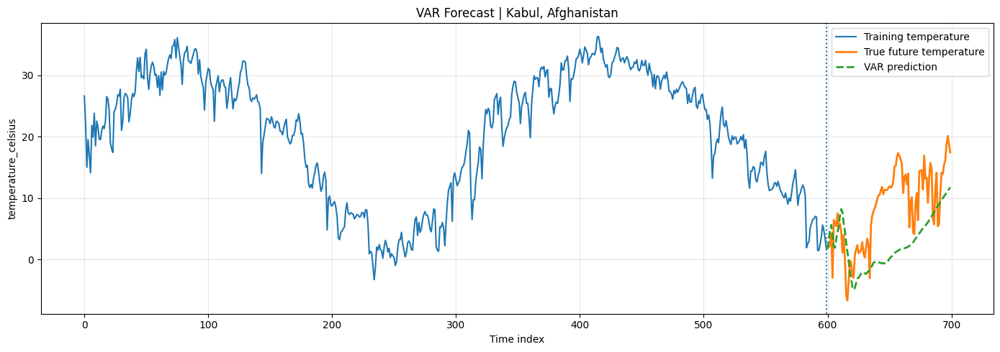

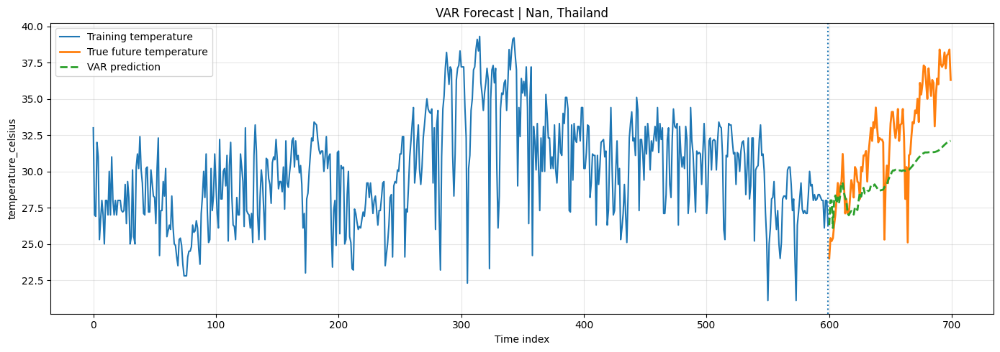

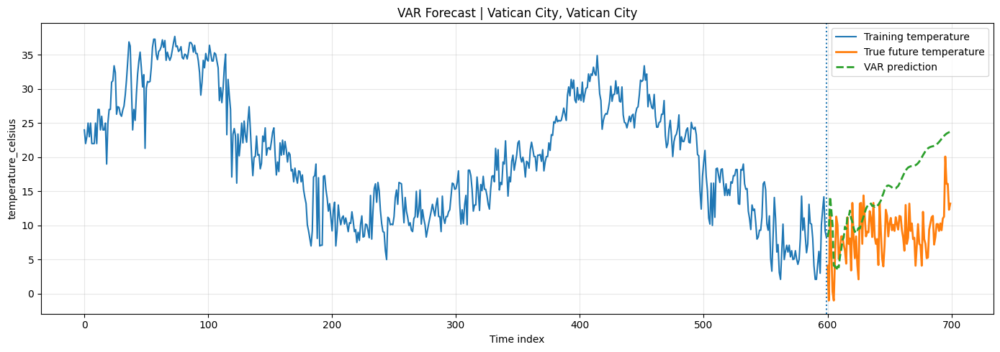

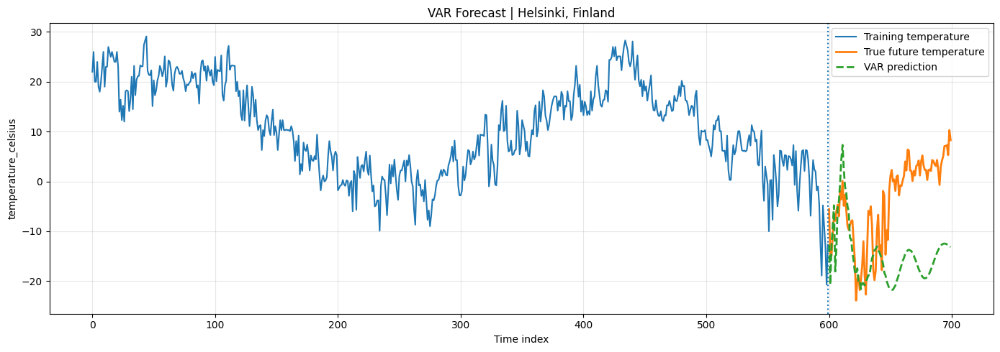

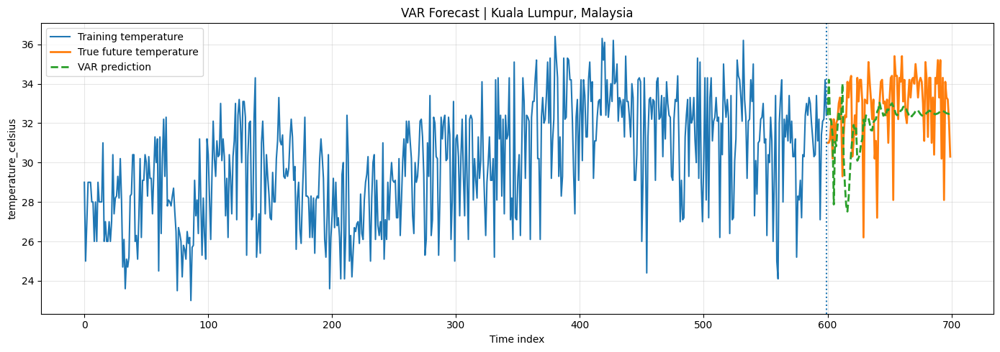

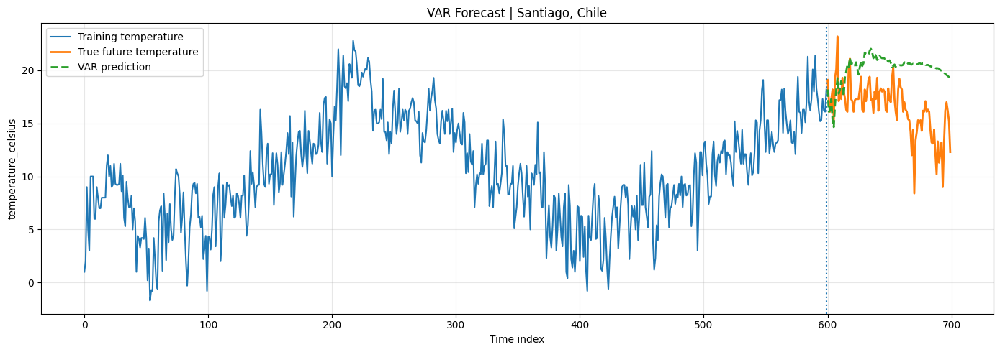

In [ ]:
# Visualization: selected cities
sample_indices = [0, 1, 2, 50, 99, 150]
for idx in sample_indices:
    if idx >= len(city_order):
        continue
    country = city_order.loc[idx, "country"]
    city = city_order.loc[idx, "location_name"]
    train_series = X_main_train[idx]
    true_future = Y_test[idx]
    pred_future = Y_pred_var[idx]
    plt.figure(figsize=(14, 5))
    plt.plot(np.arange(600),train_series,label="Training temperature",linewidth=1.5)
    plt.plot(np.arange(600, 700),true_future,label="True future temperature",linewidth=2)
    plt.plot(np.arange(600, 700),pred_future,label="VAR prediction",linewidth=2,linestyle="--")
    plt.axvline(599,linestyle=":",linewidth=1.5)
    plt.title(f"VAR Forecast | {city}, {country}")
    plt.xlabel("Time index")
    plt.ylabel("temperature_celsius")
    plt.legend()
    plt.grid(alpha=0.3)
    plt.tight_layout()
    plt.show()

In [ ]:
# Save selected visualization figures
for idx in sample_indices:
    if idx >= len(city_order):
        continue
    country = city_order.loc[idx, "country"]
    city = city_order.loc[idx, "location_name"]
    train_series = X_main_train[idx]
    true_future = Y_test[idx]
    pred_future = Y_pred_var[idx]
    plt.figure(figsize=(14, 5))
    plt.plot(np.arange(600),
        train_series,
        label="Training temperature",
        linewidth=1.5)
    plt.plot(np.arange(600, 700),
        true_future,
        label="True future temperature",
        linewidth=2)
    plt.plot(np.arange(600, 700),
        pred_future,
        label="VAR prediction",
        linewidth=2,
        linestyle="--")
    plt.axvline(599,linestyle=":",linewidth=1.5)
    plt.title(f"VAR Forecast | {city}, {country}")
    plt.xlabel("Time index")
    plt.ylabel("temperature_celsius")
    plt.legend()
    plt.grid(alpha=0.3)
    plt.tight_layout()
    fig_name = f"VAR_forecast_city_{idx}_{str(city).replace(' ', '_')}.png"
    plt.savefig(os.path.join(FIG_DIR, fig_name),dpi=300)
    plt.close()
print("Saved VAR figures to:")
print(FIG_DIR)

In [ ]:
# Generic 20-step Forecast Evaluation

import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

MODEL_NAME = "VAR"   # e.g. "SARIMAX", "Kalman_Filter", "VAR"
Y_pred_current = Y_pred_var   # e.g. Y_pred_sarimax, Y_pred_kalman, Y_pred_var
MODEL_OUTPUT_DIR = os.path.join(
    BASE_DIR,
    "prediction_outputs",
    "model_outputs",
    MODEL_NAME)

SHORT_EVAL_DIR = os.path.join(
    MODEL_OUTPUT_DIR,
    "short_horizon_20step_evaluation")

SHORT_REPORT_DIR = os.path.join(
    SHORT_EVAL_DIR,
    "reports")

SHORT_FIG_DIR = os.path.join(
    SHORT_EVAL_DIR,
    "figures")

for p in [SHORT_EVAL_DIR, SHORT_REPORT_DIR, SHORT_FIG_DIR]:
    os.makedirs(p, exist_ok=True)
SHORT_HORIZON = 20
Y_true_20 = Y_test[:, :SHORT_HORIZON]
Y_pred_20 = Y_pred_current[:, :SHORT_HORIZON]
print("Y_true_20 shape:", Y_true_20.shape)
print("Y_pred_20 shape:", Y_pred_20.shape)
assert Y_true_20.shape == Y_pred_20.shape

Y_true_20 shape: (182, 20)
Y_pred_20 shape: (182, 20)


In [ ]:
# Metrics
def calculate_forecast_metrics(y_true, y_pred):
    y_true = np.asarray(y_true, dtype=float)
    y_pred = np.asarray(y_pred, dtype=float)
    mae = mean_absolute_error(y_true, y_pred)
    rmse = np.sqrt(mean_squared_error(y_true, y_pred))
    smape = np.mean(2 * np.abs(y_pred - y_true)
        / np.maximum(np.abs(y_true) + np.abs(y_pred), 1e-6)) * 100
    r2 = r2_score(y_true, y_pred)
    return {
        "MAE": mae,
        "RMSE": rmse,
        "SMAPE_%": smape,
        "R2": r2}

# Overall 20-step metrics
overall_20_metrics = calculate_forecast_metrics(
    Y_true_20.flatten(),
    Y_pred_20.flatten())
overall_20_metrics_df = pd.DataFrame([{
    "model": MODEL_NAME,
    "horizon": "600_to_620",
    "forecast_steps": SHORT_HORIZON,
    **overall_20_metrics}])
display(overall_20_metrics_df)

# City-level 20-step metrics
city_20_records = []
for city_idx in range(Y_true_20.shape[0]):
    country = city_order.loc[city_idx, "country"]
    city = city_order.loc[city_idx, "location_name"]
    metrics = calculate_forecast_metrics(
        Y_true_20[city_idx],
        Y_pred_20[city_idx])
    city_20_records.append({
        "city_index": city_idx,
        "country": country,
        "location_name": city,
        **metrics})
city_20_metrics_df = pd.DataFrame(city_20_records)
display(city_20_metrics_df.head())
display(city_20_metrics_df.describe())

,model,horizon,forecast_steps,MAE,RMSE,SMAPE_%,R2
0,VAR,600_to_620,20,2.994574,4.373599,44.790971,0.876874


,city_index,country,location_name,MAE,RMSE,SMAPE_%,R2
0,0,Afghanistan,Kabul,3.425229,4.156449,100.662730,-0.064002
1,1,Thailand,Nan,1.135111,1.438493,4.135546,0.313285
2,2,Vatican City,Vatican City,4.114575,5.096895,67.374713,-0.906125
3,3,Japan,Tokyo,2.867531,3.333335,31.276214,-0.133178
4,4,Jordan,Amman,3.521316,4.816282,45.260278,-1.256717


,city_index,MAE,RMSE,SMAPE_%,R2
count,182.000000,182.000000,182.000000,182.000000,182.000000
mean,90.500000,2.994574,3.670498,44.790971,-1.808015
std,52.683014,1.990094,2.384756,53.900754,2.480061
min,0.000000,0.533432,0.718219,2.241708,-19.202019
25%,45.250000,1.474845,1.892418,6.779546,-2.120635
50%,90.500000,2.381618,2.979960,12.907905,-1.053391
75%,135.750000,4.165332,5.151363,86.068254,-0.490649
max,181.000000,11.340695,13.840730,176.282500,0.529780


In [ ]:
# Save numeric results
overall_20_path = os.path.join(
    SHORT_REPORT_DIR,
    f"{MODEL_NAME}_overall_20step_metrics.csv")
city_20_path = os.path.join(
    SHORT_REPORT_DIR,
    f"{MODEL_NAME}_city_level_20step_metrics.csv")
pred_20_path = os.path.join(
    SHORT_REPORT_DIR,
    f"{MODEL_NAME}_20step_predictions.csv")
overall_20_metrics_df.to_csv(
    overall_20_path,
    index=False)
city_20_metrics_df.to_csv(
    city_20_path,
    index=False)
pd.DataFrame(Y_pred_20).to_csv(
    pred_20_path,
    index=False)
np.save(os.path.join(SHORT_REPORT_DIR,
        f"{MODEL_NAME}_20step_predictions.npy"),Y_pred_20)
print("Saved 20-step evaluation numeric results:")
print(overall_20_path)
print(city_20_path)
print(pred_20_path)

Saved 20-step evaluation numeric results:
/content/drive/MyDrive/Weather Trend Forecasting/prediction_outputs/model_outputs/VAR/short_horizon_20step_evaluation/reports/VAR_overall_20step_metrics.csv
/content/drive/MyDrive/Weather Trend Forecasting/prediction_outputs/model_outputs/VAR/short_horizon_20step_evaluation/reports/VAR_city_level_20step_metrics.csv
/content/drive/MyDrive/Weather Trend Forecasting/prediction_outputs/model_outputs/VAR/short_horizon_20step_evaluation/reports/VAR_20step_predictions.csv


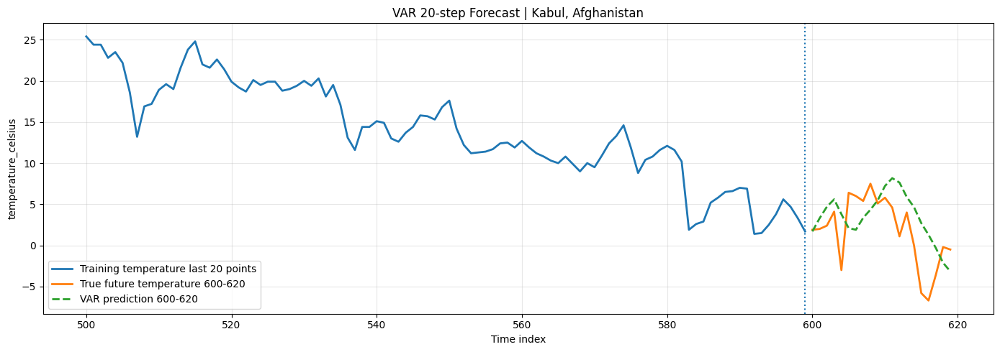

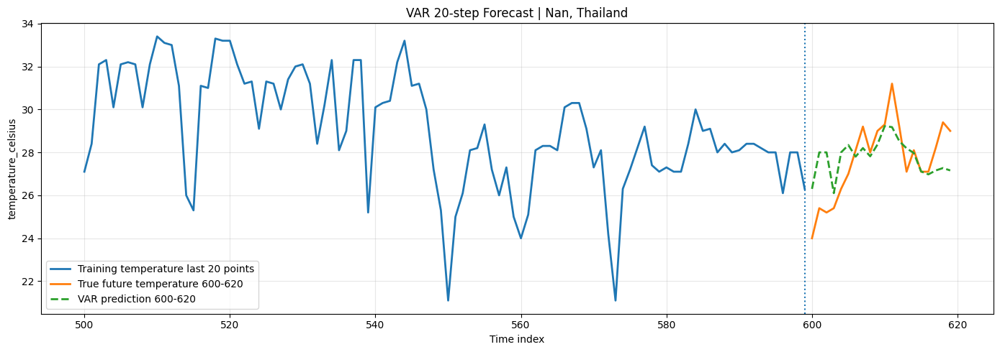

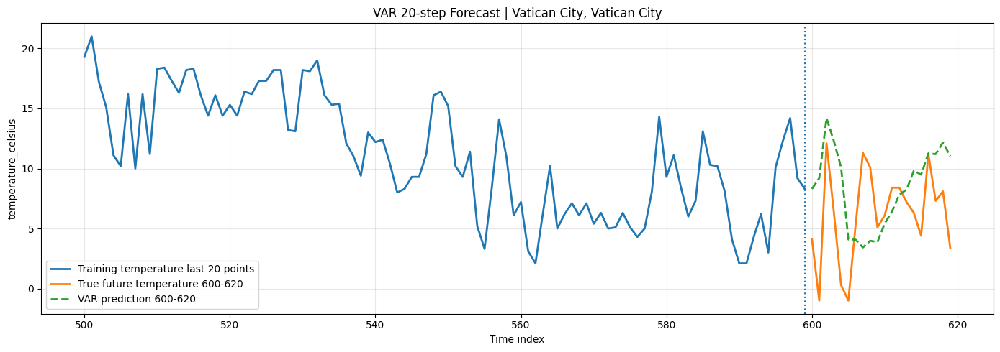

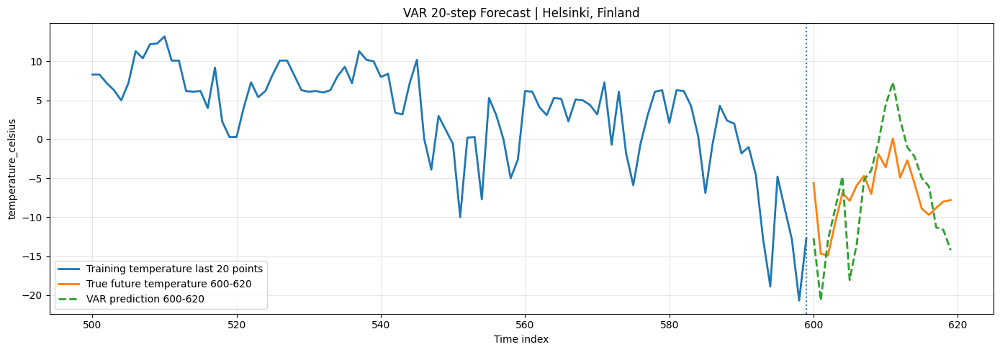

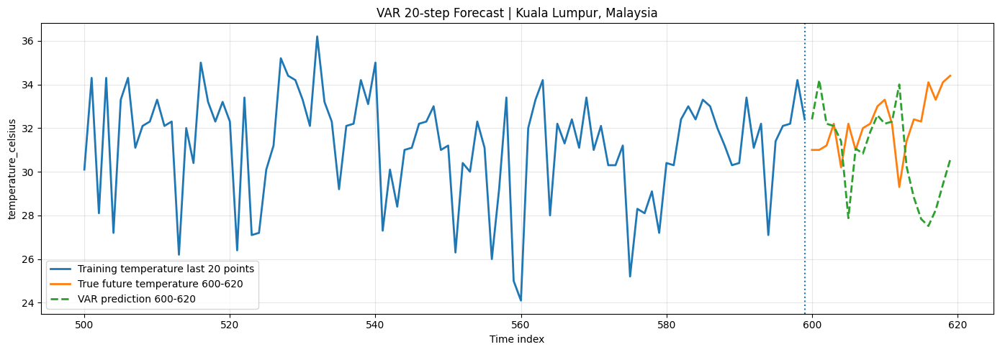

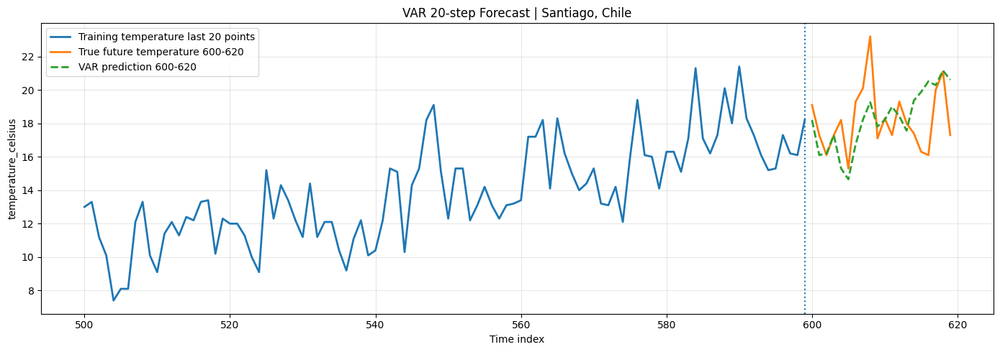

In [ ]:
# Visualization: selected cities
# Shows training 580-600 + true/predicted 600-620
sample_indices = [0, 1, 2, 50, 99, 150]
for idx in sample_indices:
    if idx >= len(city_order):
        continue
    country = city_order.loc[idx, "country"]
    city = city_order.loc[idx, "location_name"]
    plt.figure(figsize=(14, 5))

    # Last 20 training points
    plt.plot(np.arange(500, 600),
        X_main_train[idx, 500:600],
        label="Training temperature last 20 points",
        linewidth=2)

    # True future 20
    plt.plot(np.arange(600, 620),
        Y_true_20[idx],
        label="True future temperature 600-620",
        linewidth=2)

    # Pred future 20
    plt.plot(np.arange(600, 620),
        Y_pred_20[idx],
        label=f"{MODEL_NAME} prediction 600-620",
        linewidth=2,
        linestyle="--")

    plt.axvline(599,linestyle=":",linewidth=1.5)
    plt.title(f"{MODEL_NAME} 20-step Forecast | {city}, {country}")
    plt.xlabel("Time index")
    plt.ylabel("temperature_celsius")
    plt.legend()
    plt.grid(alpha=0.3)
    plt.tight_layout()
    plt.show()

In [ ]:
# Save selected 20-step figures
for idx in sample_indices:
    if idx >= len(city_order):
        continue
    country = city_order.loc[idx, "country"]
    city = city_order.loc[idx, "location_name"]
    plt.figure(figsize=(14, 5))
    plt.plot(np.arange(500, 600),
        X_main_train[idx, 500:600],
        label="Training temperature last 20 points",
        linewidth=2)
    plt.plot(np.arange(600, 620),
        Y_true_20[idx],
        label="True future temperature 600-620",
        linewidth=2)
    plt.plot(np.arange(600, 620),
        Y_pred_20[idx],
        label=f"{MODEL_NAME} prediction 600-620",
        linewidth=2,
        linestyle="--")
    plt.axvline(599,linestyle=":",linewidth=1.5)
    plt.title(f"{MODEL_NAME} 20-step Forecast | {city}, {country}")
    plt.xlabel("Time index")
    plt.ylabel("temperature_celsius")
    plt.legend()
    plt.grid(alpha=0.3)
    plt.tight_layout()
    fig_name = (f"{MODEL_NAME}_20step_forecast_city_{idx}_"
        f"{str(city).replace(' ', '_')}.png")
    plt.savefig(os.path.join(SHORT_FIG_DIR,fig_name),dpi=300)
    plt.close()
print("Saved 20-step forecast figures to:")
print(SHORT_FIG_DIR)

Saved 20-step forecast figures to:
/content/drive/MyDrive/Weather Trend Forecasting/prediction_outputs/model_outputs/VAR/short_horizon_20step_evaluation/figures


**XGBoost**

In [ ]:
# XGBoost Multi-Horizon Forecasting
# Input:  temperature + 8 auxiliary features, shape (182, 600, 9)
# Output: temperature forecast, shape (182, 100)
import os
import warnings
warnings.filterwarnings("ignore")
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.model_selection import train_test_split
try:
    from xgboost import XGBRegressor
except ImportError:
    !pip install xgboost -q
    from xgboost import XGBRegressor

In [ ]:
BASE_DIR = "/content/drive/MyDrive/Weather Trend Forecasting"
MAIN_DIR = os.path.join(
    BASE_DIR,
    "prediction_outputs",
    "temperature_main_dataset")
AUX_DIR = os.path.join(
    BASE_DIR,
    "prediction_outputs",
    "temperature_auxiliary_dataset")
XGB_OUTPUT_DIR = os.path.join(
    BASE_DIR,
    "prediction_outputs",
    "model_outputs",
    "XGBoost")
FIG_DIR = os.path.join(XGB_OUTPUT_DIR, "figures")
REPORT_DIR = os.path.join(XGB_OUTPUT_DIR, "reports")
PRED_DIR = os.path.join(XGB_OUTPUT_DIR, "predictions")
for p in [XGB_OUTPUT_DIR, FIG_DIR, REPORT_DIR, PRED_DIR]:
    os.makedirs(p, exist_ok=True)

X_main_train = np.load(os.path.join(MAIN_DIR, "temperature_train_input.npy"))
Y_test = np.load(os.path.join(MAIN_DIR, "temperature_test_target.npy"))
X_aux = np.load(os.path.join(AUX_DIR, "X_auxiliary_8features.npy"))
city_order = pd.read_csv(os.path.join(MAIN_DIR, "city_order.csv"))
aux_feature_names = pd.read_csv(
    os.path.join(AUX_DIR, "auxiliary_feature_names.csv")
)["feature_name"].tolist()
feature_names = ["temperature_celsius"] + aux_feature_names

print("Main input:", X_main_train.shape)
print("Aux input:", X_aux.shape)
print("Target:", Y_test.shape)
print("Feature names:", feature_names)

assert X_main_train.shape == (182, 600)
assert X_aux.shape == (182, 600, 8)
assert Y_test.shape == (182, 100)

# Combined input: (182, 600, 9)
X_all = np.concatenate([X_main_train[:, :, None],X_aux],axis=2)
print("Combined input:", X_all.shape)

Main input: (182, 600)
Aux input: (182, 600, 8)
Target: (182, 100)
Feature names: ['temperature_celsius', 'STL_trend_of_temperature', 'STL_seasonal_of_temperature', 'Gaussian_7_temperature', 'Gaussian_30_temperature', 'humidity', 'pressure_mb', 'uv_index', 'cloud']
Combined input: (182, 600, 9)


In [ ]:
# Metrics
def calculate_metrics(y_true, y_pred):
    y_true = np.asarray(y_true, dtype=float)
    y_pred = np.asarray(y_pred, dtype=float)
    mae = mean_absolute_error(y_true, y_pred)
    rmse = np.sqrt(mean_squared_error(y_true, y_pred))
    smape = np.mean(2 * np.abs(y_pred - y_true)
        / np.maximum(np.abs(y_true) + np.abs(y_pred), 1e-6)) * 100
    r2 = r2_score(y_true, y_pred)
    return {
        "MAE": mae,
        "RMSE": rmse,
        "SMAPE_%": smape,
        "R2": r2}

In [ ]:
# Feature construction

WINDOW_SIZE = 120
FORECAST_STEPS = 100
TRAIN_STRIDE = 2

def extract_window_features(window):
    """
    window shape: (WINDOW_SIZE, 9)
    Uses:
    1. flattened recent sequence
    2. temperature lag features
    3. rolling statistics
    4. auxiliary recent mean/std/last values
    """
    window = np.asarray(window, dtype=float)
    temp = window[:, 0]

    # Full flattened sequence
    flat_features = window.flatten()

    # Temperature lags
    lag_indices = [1, 2, 3, 7, 14, 30, 60, 90, 120]
    temp_lags = []
    for lag in lag_indices:
        temp_lags.append(temp[-lag])
    temp_lags = np.array(temp_lags)

    # Temperature rolling statistics
    rolling_windows = [7, 14, 30, 60, 120]
    temp_stats = []
    for w in rolling_windows:
        segment = temp[-w:]
        temp_stats.extend([
            np.mean(segment),
            np.std(segment),
            np.min(segment),
            np.max(segment),
            segment[-1] - segment[0]])
    temp_stats = np.array(temp_stats)

    # Auxiliary statistics
    aux_stats = []
    for j in range(window.shape[1]):
        series = window[:, j]
        aux_stats.extend([
            series[-1],
            np.mean(series[-7:]),
            np.mean(series[-30:]),
            np.std(series[-30:]),
            series[-1] - series[-7],
            series[-1] - series[-30]])
    aux_stats = np.array(aux_stats)
    return np.concatenate([
        flat_features,
        temp_lags,
        temp_stats,
        aux_stats])


def build_training_data_for_horizon(X_all, horizon, window_size=120, stride=2):
    """
    Build supervised samples for one forecast horizon.
    For a given endpoint t:
        input  = X[t-window_size:t]
        target = temperature[t+horizon-1]
    Only uses positions within first 600 training points.
    """
    X_rows = []
    y_rows = []
    n_city, seq_len, _ = X_all.shape
    max_end = seq_len - horizon + 1
    for city_idx in range(n_city):
        city_seq = X_all[city_idx]
        for end in range(window_size, max_end, stride):
            window = city_seq[end-window_size:end]
            target = city_seq[end + horizon - 1, 0]
            X_rows.append(extract_window_features(window))
            y_rows.append(target)
    X_mat = np.vstack(X_rows)
    y_vec = np.array(y_rows)
    return X_mat, y_vec


def build_forecast_feature_for_city(X_all, city_idx, window_size=120):
    """
    Feature for actual forecasting from t=600.
    """
    window = X_all[city_idx, -window_size:, :]
    return extract_window_features(window)

In [ ]:
# XGBoost parameter setting

USE_GPU = True
xgb_params = {
    "n_estimators": 600,
    "max_depth": 4,
    "learning_rate": 0.03,
    "subsample": 0.85,
    "colsample_bytree": 0.85,
    "min_child_weight": 2,
    "reg_alpha": 0.05,
    "reg_lambda": 2.0,
    "objective": "reg:squarederror",
    "random_state": 42,
    "n_jobs": -1,
    "tree_method": "hist"}
if USE_GPU:
    xgb_params["device"] = "cuda"

print(xgb_params)

{'n_estimators': 600, 'max_depth': 4, 'learning_rate': 0.03, 'subsample': 0.85, 'colsample_bytree': 0.85, 'min_child_weight': 2, 'reg_alpha': 0.05, 'reg_lambda': 2.0, 'objective': 'reg:squarederror', 'random_state': 42, 'n_jobs': -1, 'tree_method': 'hist', 'device': 'cuda'}


In [ ]:
# Train 100 direct XGBoost models

Y_pred_xgb = np.zeros((X_all.shape[0], FORECAST_STEPS))
horizon_metrics_records = []
trained_models = {}
for horizon in range(1, FORECAST_STEPS + 1):
    print(f"\nTraining XGBoost horizon {horizon}/{FORECAST_STEPS}")
    X_h, y_h = build_training_data_for_horizon(
        X_all,
        horizon=horizon,
        window_size=WINDOW_SIZE,
        stride=TRAIN_STRIDE)
    X_train_h, X_val_h, y_train_h, y_val_h = train_test_split(
        X_h,y_h,test_size=0.15,random_state=42,shuffle=True)
    try:
        model = XGBRegressor(**xgb_params)
        model.fit(X_train_h,y_train_h,
            eval_set=[(X_val_h, y_val_h)],
            verbose=False)
    except Exception as e:
        print("GPU training failed, switching to CPU. Error:", e)
        cpu_params = xgb_params.copy()
        cpu_params.pop("device", None)
        cpu_params["tree_method"] = "hist"
        model = XGBRegressor(**cpu_params)
        model.fit(X_train_h,y_train_h,
            eval_set=[(X_val_h, y_val_h)],verbose=False)

    # Forecast this horizon for all 182 cities
    X_forecast_h = np.vstack([
        build_forecast_feature_for_city(X_all,
            city_idx,window_size=WINDOW_SIZE)
        for city_idx in range(X_all.shape[0])])
    y_pred_h = model.predict(X_forecast_h)
    Y_pred_xgb[:, horizon - 1] = y_pred_h
    val_pred = model.predict(X_val_h)
    val_metrics = calculate_metrics(y_val_h,val_pred)
    horizon_metrics_records.append({
        "horizon": horizon,
        **val_metrics})
    trained_models[horizon] = model
horizon_metrics_df = pd.DataFrame(horizon_metrics_records)
print("XGBoost prediction shape:", Y_pred_xgb.shape)
display(horizon_metrics_df.head())


Training XGBoost horizon 1/100

Training XGBoost horizon 2/100

Training XGBoost horizon 3/100

Training XGBoost horizon 4/100

Training XGBoost horizon 5/100

Training XGBoost horizon 6/100

Training XGBoost horizon 7/100

Training XGBoost horizon 8/100

Training XGBoost horizon 9/100

Training XGBoost horizon 10/100

Training XGBoost horizon 11/100

Training XGBoost horizon 12/100

Training XGBoost horizon 13/100

Training XGBoost horizon 14/100

Training XGBoost horizon 15/100

Training XGBoost horizon 16/100

Training XGBoost horizon 17/100

Training XGBoost horizon 18/100

Training XGBoost horizon 19/100

Training XGBoost horizon 20/100

Training XGBoost horizon 21/100

Training XGBoost horizon 22/100

Training XGBoost horizon 23/100

Training XGBoost horizon 24/100

Training XGBoost horizon 25/100

Training XGBoost horizon 26/100

Training XGBoost horizon 27/100

Training XGBoost horizon 28/100

Training XGBoost horizon 29/100

Training XGBoost horizon 30/100

Training XGBoost h

,horizon,MAE,RMSE,SMAPE_%,R2
0,1,0.857921,1.247648,8.753277,0.982121
1,2,1.176390,1.730018,11.459939,0.965718
2,3,1.222378,1.797465,11.769430,0.962320
3,4,1.192672,1.767048,11.229537,0.963912
4,5,1.238522,1.855369,11.454672,0.960185


In [ ]:
# Evaluation: 100-step

xgb_100_overall = calculate_metrics(
    Y_test.flatten(),
    Y_pred_xgb.flatten())

xgb_100_overall_df = pd.DataFrame([{
    "model": "XGBoost",
    "horizon": "600_to_700",
    "forecast_steps": 100,
    **xgb_100_overall}])

city_100_records = []
for city_idx in range(Y_test.shape[0]):
    country = city_order.loc[city_idx, "country"]
    city = city_order.loc[city_idx, "location_name"]
    metrics = calculate_metrics(
        Y_test[city_idx],
        Y_pred_xgb[city_idx])
    city_100_records.append({
        "city_index": city_idx,
        "country": country,
        "location_name": city,
        **metrics})

xgb_100_city_df = pd.DataFrame(city_100_records)
display(xgb_100_overall_df)
display(xgb_100_city_df.describe())

,model,horizon,forecast_steps,MAE,RMSE,SMAPE_%,R2
0,XGBoost,600_to_700,100,4.485566,6.170165,54.106726,0.680671


,city_index,MAE,RMSE,SMAPE_%,R2
count,182.000000,182.000000,182.000000,182.000000,182.000000
mean,90.500000,4.485566,5.184639,54.106726,-2.545793
std,52.683014,3.061058,3.354442,56.870499,3.656571
min,0.000000,0.574037,0.817202,2.373371,-29.749443
25%,45.250000,1.869252,2.174000,7.951342,-3.312656
50%,90.500000,4.021893,4.764096,23.741621,-1.260844
75%,135.750000,6.212483,7.382818,102.240541,-0.522875
max,181.000000,14.590694,16.082415,188.482533,0.663218


In [ ]:
# Evaluation: 20-step

SHORT_HORIZON = 20
Y_true_20 = Y_test[:, :SHORT_HORIZON]
Y_pred_20 = Y_pred_xgb[:, :SHORT_HORIZON]
xgb_20_overall = calculate_metrics(
    Y_true_20.flatten(),
    Y_pred_20.flatten())

xgb_20_overall_df = pd.DataFrame([{
    "model": "XGBoost",
    "horizon": "600_to_620",
    "forecast_steps": 20,
    **xgb_20_overall}])

city_20_records = []

for city_idx in range(Y_true_20.shape[0]):
    country = city_order.loc[city_idx, "country"]
    city = city_order.loc[city_idx, "location_name"]
    metrics = calculate_metrics(
        Y_true_20[city_idx],
        Y_pred_20[city_idx])
    city_20_records.append({
        "city_index": city_idx,
        "country": country,
        "location_name": city,
        **metrics})

xgb_20_city_df = pd.DataFrame(city_20_records)
display(xgb_20_overall_df)
display(xgb_20_city_df.describe())

,model,horizon,forecast_steps,MAE,RMSE,SMAPE_%,R2
0,XGBoost,600_to_620,20,2.980709,4.233581,43.53135,0.884631


,city_index,MAE,RMSE,SMAPE_%,R2
count,182.000000,182.000000,182.000000,182.000000,182.000000
mean,90.500000,2.980709,3.644726,43.531350,-2.368187
std,52.683014,1.816386,2.159817,50.130622,5.369682
min,0.000000,0.557871,0.736494,2.139689,-63.566311
25%,45.250000,1.475845,1.889816,6.359875,-2.598706
50%,90.500000,2.551913,3.301947,13.753980,-1.047163
75%,135.750000,4.005549,4.778278,74.868770,-0.411425
max,181.000000,10.192959,12.109526,173.093686,0.584786


In [ ]:
# Save numeric results
np.save(os.path.join(PRED_DIR, "Y_pred_xgboost.npy"),Y_pred_xgb)
pd.DataFrame(Y_pred_xgb).to_csv(os.path.join(PRED_DIR, "Y_pred_xgboost.csv"),index=False)
xgb_100_overall_df.to_csv(os.path.join(REPORT_DIR, "xgboost_overall_100step_metrics.csv"),index=False)
xgb_100_city_df.to_csv(os.path.join(REPORT_DIR, "xgboost_city_level_100step_metrics.csv"),index=False)
xgb_20_overall_df.to_csv(os.path.join(REPORT_DIR, "xgboost_overall_20step_metrics.csv"),index=False)
xgb_20_city_df.to_csv(os.path.join(REPORT_DIR, "xgboost_city_level_20step_metrics.csv"),index=False)
horizon_metrics_df.to_csv(os.path.join(REPORT_DIR, "xgboost_validation_metrics_by_horizon.csv"),index=False)
print("Saved XGBoost results to:")
print(XGB_OUTPUT_DIR)

Saved XGBoost results to:
/content/drive/MyDrive/Weather Trend Forecasting/prediction_outputs/model_outputs/XGBoost


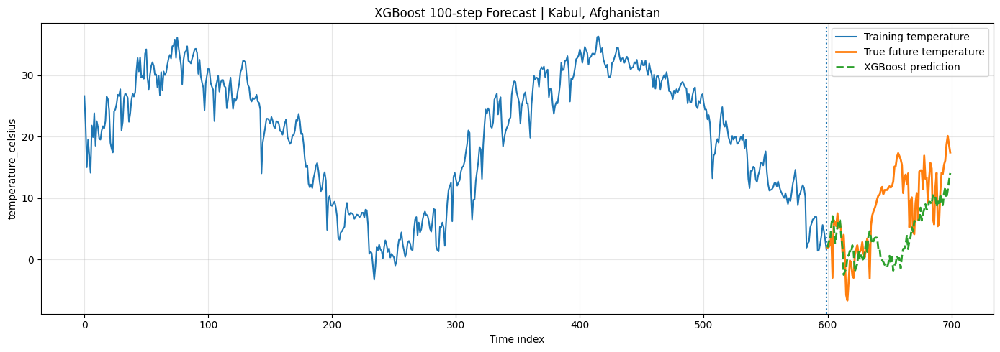

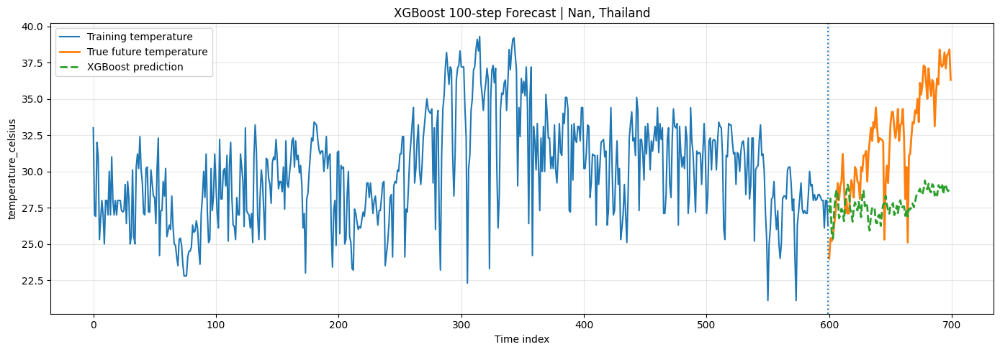

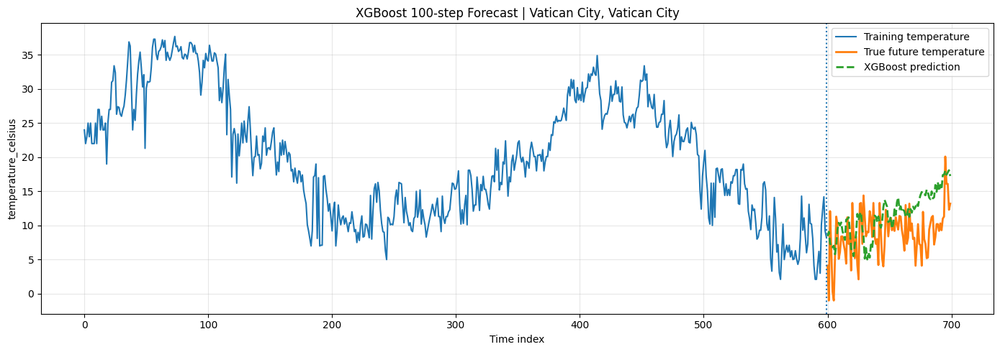

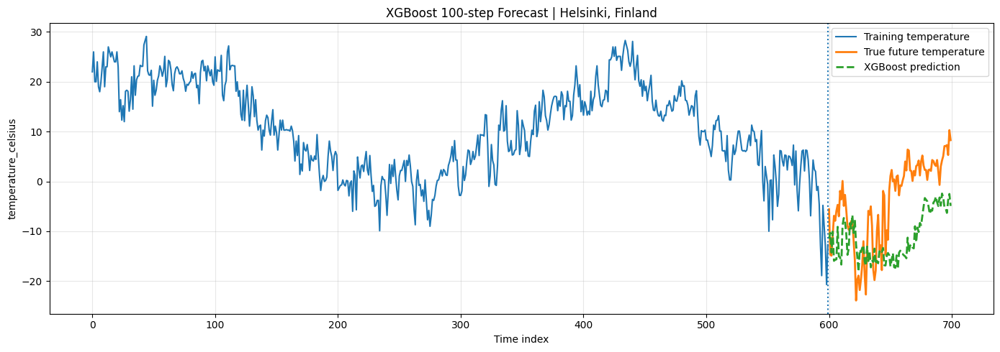

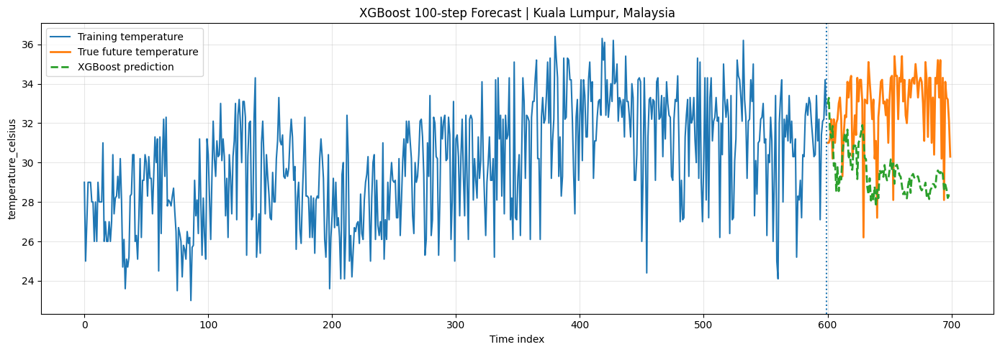

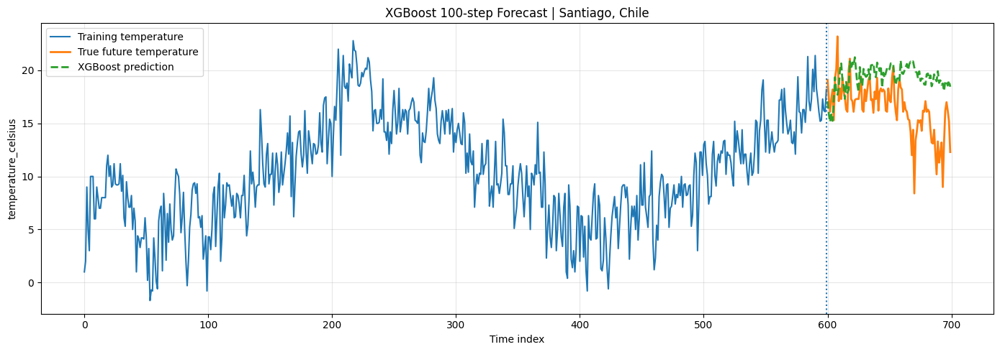

In [ ]:
# Visualization: 100-step selected cities
sample_indices = [0, 1, 2, 50, 99, 150]
for idx in sample_indices:
    if idx >= len(city_order):
        continue
    country = city_order.loc[idx, "country"]
    city = city_order.loc[idx, "location_name"]
    plt.figure(figsize=(14, 5))
    plt.plot(np.arange(600),
        X_main_train[idx],
        label="Training temperature",
        linewidth=1.5)
    plt.plot(np.arange(600, 700),
        Y_test[idx],
        label="True future temperature",
        linewidth=2)
    plt.plot(np.arange(600, 700),
        Y_pred_xgb[idx],
        label="XGBoost prediction",
        linewidth=2,
        linestyle="--")
    plt.axvline(599, linestyle=":", linewidth=1.5)
    plt.title(f"XGBoost 100-step Forecast | {city}, {country}")
    plt.xlabel("Time index")
    plt.ylabel("temperature_celsius")
    plt.legend()
    plt.grid(alpha=0.3)
    plt.tight_layout()
    plt.show()

In [ ]:
# Save 100-step figures
FIG_100_DIR = os.path.join(FIG_DIR, "100step")
os.makedirs(FIG_100_DIR, exist_ok=True)
for idx in sample_indices:
    if idx >= len(city_order):
        continue
    country = city_order.loc[idx, "country"]
    city = city_order.loc[idx, "location_name"]
    plt.figure(figsize=(14, 5))
    plt.plot(np.arange(600), X_main_train[idx], label="Training temperature", linewidth=1.5)
    plt.plot(np.arange(600, 700), Y_test[idx], label="True future temperature", linewidth=2)
    plt.plot(np.arange(600, 700), Y_pred_xgb[idx], label="XGBoost prediction", linewidth=2, linestyle="--")
    plt.axvline(599, linestyle=":", linewidth=1.5)
    plt.title(f"XGBoost 100-step Forecast | {city}, {country}")
    plt.xlabel("Time index")
    plt.ylabel("temperature_celsius")
    plt.legend()
    plt.grid(alpha=0.3)
    plt.tight_layout()
    fig_name = f"XGBoost_100step_city_{idx}_{str(city).replace(' ', '_')}.png"
    plt.savefig(os.path.join(FIG_100_DIR, fig_name),dpi=300)
    plt.close()
print("Saved 100-step figures to:")
print(FIG_100_DIR)

Saved 100-step figures to:
/content/drive/MyDrive/Weather Trend Forecasting/prediction_outputs/model_outputs/XGBoost/figures/100step


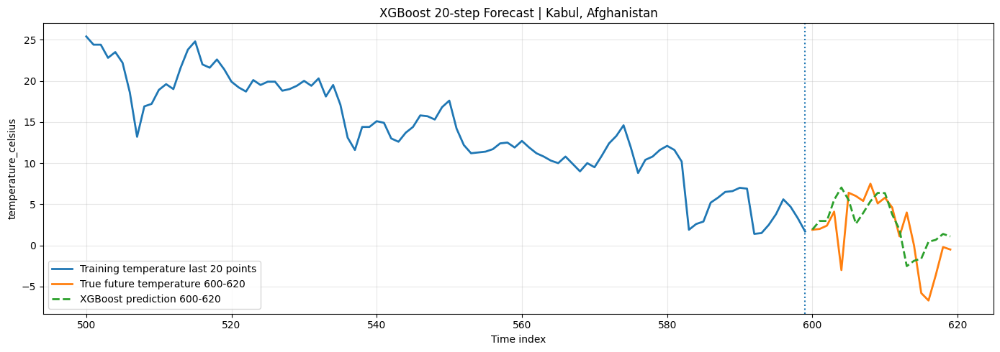

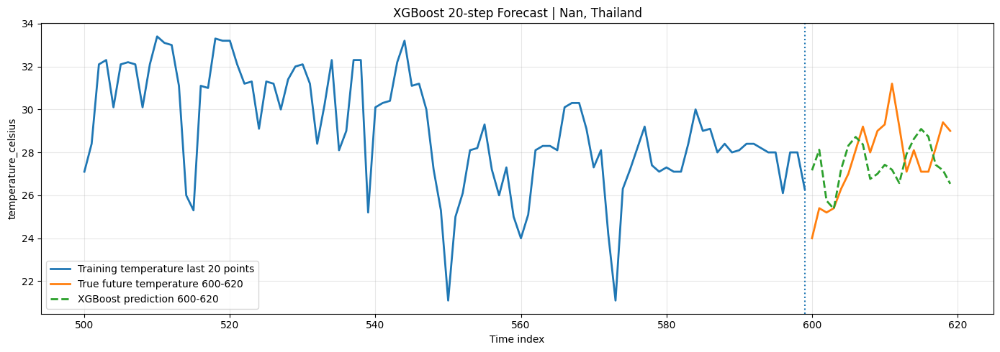

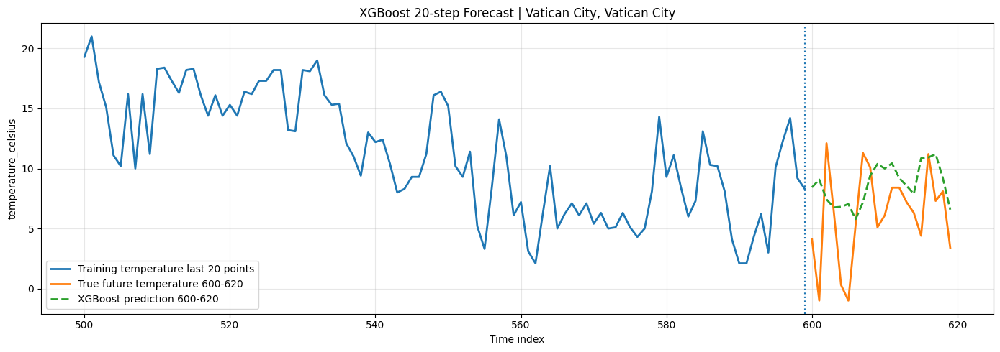

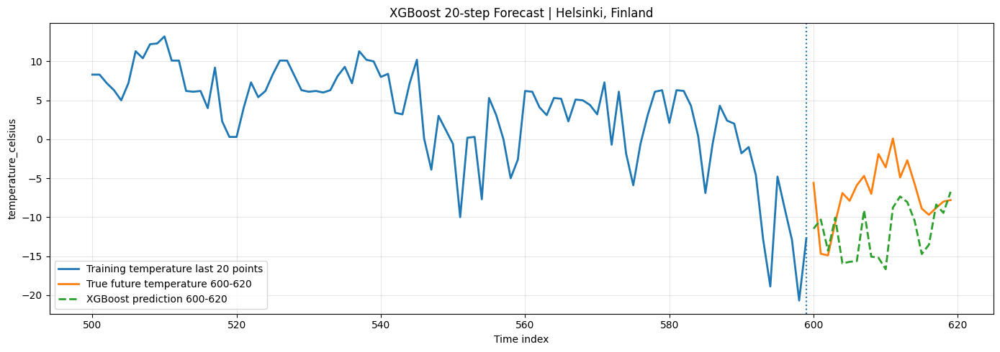

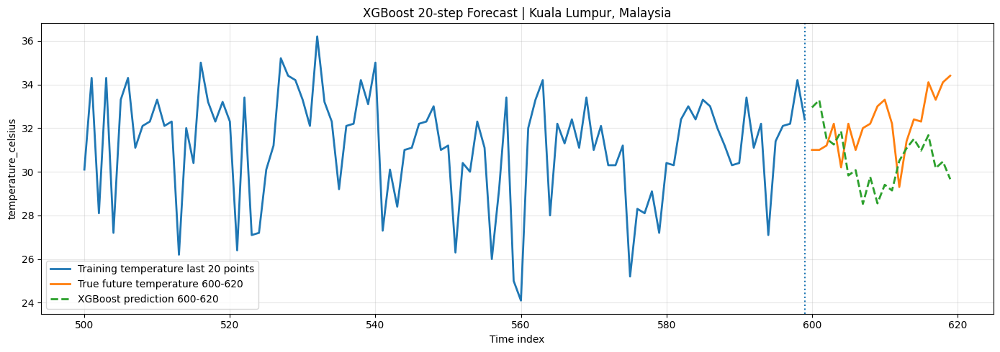

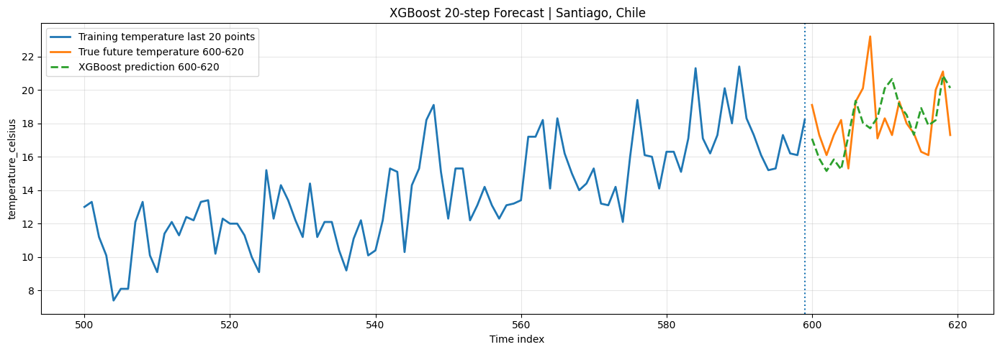

In [ ]:
# Visualization: 20-step selected cities
FIG_20_DIR = os.path.join(FIG_DIR, "20step")
os.makedirs(FIG_20_DIR, exist_ok=True)
for idx in sample_indices:
    if idx >= len(city_order):
        continue
    country = city_order.loc[idx, "country"]
    city = city_order.loc[idx, "location_name"]
    plt.figure(figsize=(14, 5))
    plt.plot(
        np.arange(500, 600),
        X_main_train[idx, 500:600],
        label="Training temperature last 20 points",
        linewidth=2)
    plt.plot(
        np.arange(600, 620),
        Y_test[idx, :20],
        label="True future temperature 600-620",
        linewidth=2)
    plt.plot(
        np.arange(600, 620),
        Y_pred_xgb[idx, :20],
        label="XGBoost prediction 600-620",
        linewidth=2,
        linestyle="--")
    plt.axvline(599, linestyle=":", linewidth=1.5)
    plt.title(f"XGBoost 20-step Forecast | {city}, {country}")
    plt.xlabel("Time index")
    plt.ylabel("temperature_celsius")
    plt.legend()
    plt.grid(alpha=0.3)
    plt.tight_layout()
    plt.show()

In [ ]:
# Save 20-step figures
for idx in sample_indices:
    if idx >= len(city_order):
        continue
    country = city_order.loc[idx, "country"]
    city = city_order.loc[idx, "location_name"]
    plt.figure(figsize=(14, 5))
    plt.plot(np.arange(500, 600), X_main_train[idx, 500:600], label="Training temperature last 20 points", linewidth=2)
    plt.plot(np.arange(600, 620), Y_test[idx, :20], label="True future temperature 600-620", linewidth=2)
    plt.plot(np.arange(600, 620), Y_pred_xgb[idx, :20], label="XGBoost prediction 600-620", linewidth=2, linestyle="--")
    plt.axvline(599, linestyle=":", linewidth=1.5)
    plt.title(f"XGBoost 20-step Forecast | {city}, {country}")
    plt.xlabel("Time index")
    plt.ylabel("temperature_celsius")
    plt.legend()
    plt.grid(alpha=0.3)
    plt.tight_layout()
    fig_name = f"XGBoost_20step_city_{idx}_{str(city).replace(' ', '_')}.png"
    plt.savefig(os.path.join(FIG_20_DIR, fig_name),dpi=300)
    plt.close()
print("Saved 20-step figures to:")
print(FIG_20_DIR)

Saved 20-step figures to:
/content/drive/MyDrive/Weather Trend Forecasting/prediction_outputs/model_outputs/XGBoost/figures/20step


<Figure size 4000x2000 with 0 Axes>

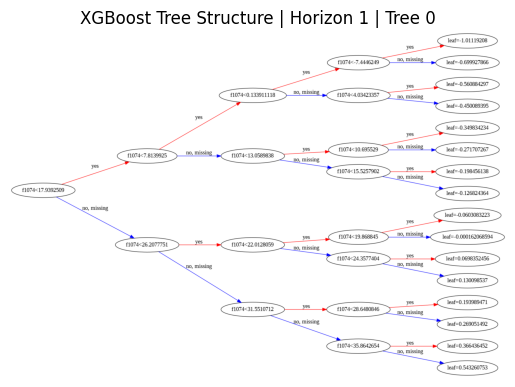

Saved: /content/drive/MyDrive/Weather Trend Forecasting/prediction_outputs/model_outputs/XGBoost/figures/tree_structures/xgboost_horizon_1_tree_0.png


<Figure size 4000x2000 with 0 Axes>

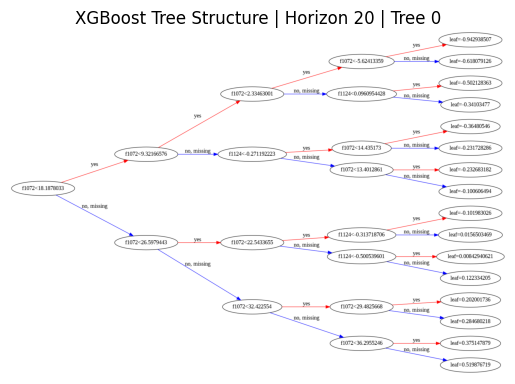

Saved: /content/drive/MyDrive/Weather Trend Forecasting/prediction_outputs/model_outputs/XGBoost/figures/tree_structures/xgboost_horizon_20_tree_0.png


<Figure size 4000x2000 with 0 Axes>

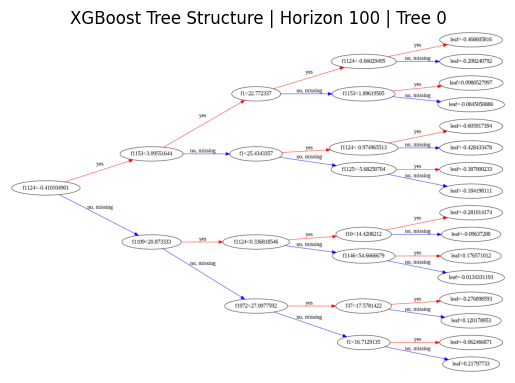

Saved: /content/drive/MyDrive/Weather Trend Forecasting/prediction_outputs/model_outputs/XGBoost/figures/tree_structures/xgboost_horizon_100_tree_0.png


In [ ]:
# Plot selected XGBoost trees
import os
import matplotlib.pyplot as plt
from xgboost import plot_tree
XGB_TREE_DIR = os.path.join(
    BASE_DIR,
    "prediction_outputs",
    "model_outputs",
    "XGBoost",
    "figures",
    "tree_structures")
os.makedirs(XGB_TREE_DIR, exist_ok=True)
selected_horizons = [1, 20, 100]
selected_tree_index = 0
for h in selected_horizons:
    model = trained_models[h]
    plt.figure(figsize=(40, 20))
    plot_tree(model,num_trees=selected_tree_index,rankdir="LR")
    plt.title(f"XGBoost Tree Structure | Horizon {h} | Tree {selected_tree_index}")
    fig_path = os.path.join(XGB_TREE_DIR,
        f"xgboost_horizon_{h}_tree_{selected_tree_index}.png")
    plt.savefig(fig_path,dpi=300,bbox_inches="tight")
    plt.show()
    print("Saved:", fig_path)

<Figure size 1000x1200 with 0 Axes>

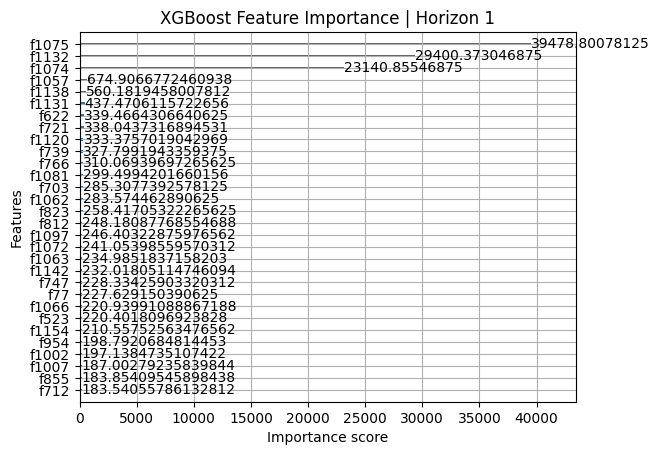

Saved: /content/drive/MyDrive/Weather Trend Forecasting/prediction_outputs/model_outputs/XGBoost/figures/feature_importance/xgboost_horizon_1_feature_importance.png


<Figure size 1000x1200 with 0 Axes>

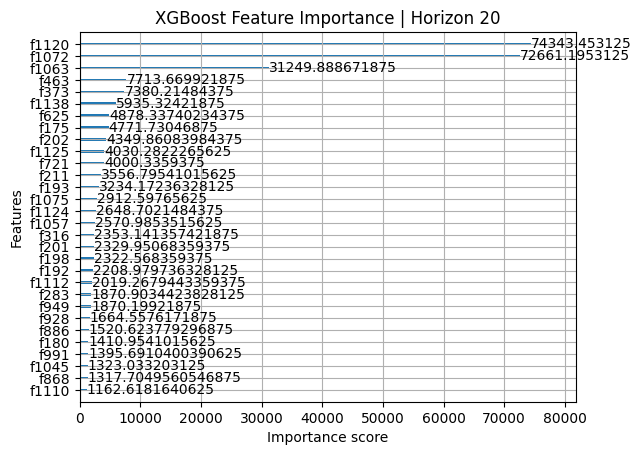

Saved: /content/drive/MyDrive/Weather Trend Forecasting/prediction_outputs/model_outputs/XGBoost/figures/feature_importance/xgboost_horizon_20_feature_importance.png


<Figure size 1000x1200 with 0 Axes>

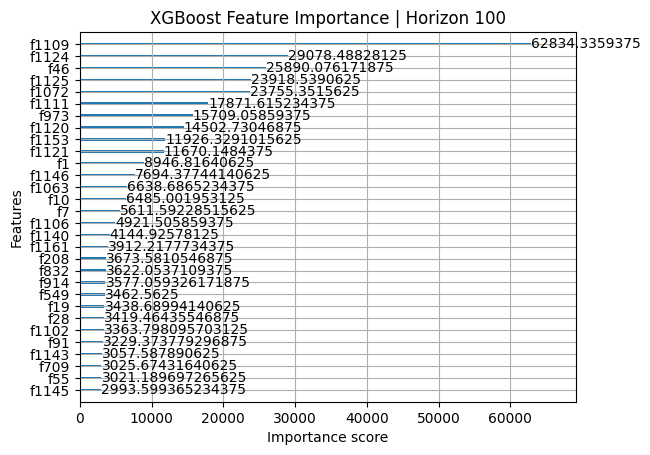

Saved: /content/drive/MyDrive/Weather Trend Forecasting/prediction_outputs/model_outputs/XGBoost/figures/feature_importance/xgboost_horizon_100_feature_importance.png


In [ ]:
# Plot feature importance for selected horizons
from xgboost import plot_importance
XGB_IMPORTANCE_DIR = os.path.join(
    BASE_DIR,
    "prediction_outputs",
    "model_outputs",
    "XGBoost",
    "figures",
    "feature_importance")
os.makedirs(XGB_IMPORTANCE_DIR, exist_ok=True)
selected_horizons = [1, 20, 100]
for h in selected_horizons:
    model = trained_models[h]
    plt.figure(figsize=(10, 12))
    plot_importance(model,max_num_features=30,importance_type="gain")
    plt.title(f"XGBoost Feature Importance | Horizon {h}")
    fig_path = os.path.join(XGB_IMPORTANCE_DIR,
        f"xgboost_horizon_{h}_feature_importance.png")
    plt.savefig(fig_path,dpi=300,bbox_inches="tight")
    plt.show()
    print("Saved:", fig_path)

**LightGBM**

In [ ]:
# LightGBM Multi-Horizon Forecasting
# Input:  temperature + 8 auxiliary features, shape (182, 600, 9)
# Output: temperature forecast, shape (182, 100)

import os
import warnings
warnings.filterwarnings("ignore")
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.model_selection import train_test_split
try:
    from lightgbm import LGBMRegressor
except ImportError:
    !pip install lightgbm -q
    from lightgbm import LGBMRegressor

In [ ]:
BASE_DIR = "/content/drive/MyDrive/Weather Trend Forecasting"
MAIN_DIR = os.path.join(
    BASE_DIR,
    "prediction_outputs",
    "temperature_main_dataset")
AUX_DIR = os.path.join(
    BASE_DIR,
    "prediction_outputs",
    "temperature_auxiliary_dataset")
LGBM_OUTPUT_DIR = os.path.join(
    BASE_DIR,
    "prediction_outputs",
    "model_outputs",
    "LightGBM")
FIG_DIR = os.path.join(LGBM_OUTPUT_DIR, "figures")
REPORT_DIR = os.path.join(LGBM_OUTPUT_DIR, "reports")
PRED_DIR = os.path.join(LGBM_OUTPUT_DIR, "predictions")
for p in [LGBM_OUTPUT_DIR, FIG_DIR, REPORT_DIR, PRED_DIR]:
    os.makedirs(p, exist_ok=True)

X_main_train = np.load(os.path.join(MAIN_DIR, "temperature_train_input.npy"))
Y_test = np.load(os.path.join(MAIN_DIR, "temperature_test_target.npy"))
X_aux = np.load(os.path.join(AUX_DIR, "X_auxiliary_8features.npy"))
city_order = pd.read_csv(os.path.join(MAIN_DIR, "city_order.csv"))
aux_feature_names = pd.read_csv(
    os.path.join(AUX_DIR, "auxiliary_feature_names.csv")
)["feature_name"].tolist()
feature_names = ["temperature_celsius"] + aux_feature_names

print("Main input:", X_main_train.shape)
print("Aux input:", X_aux.shape)
print("Target:", Y_test.shape)
print("Feature names:", feature_names)

assert X_main_train.shape == (182, 600)
assert X_aux.shape == (182, 600, 8)
assert Y_test.shape == (182, 100)

X_all = np.concatenate([X_main_train[:, :, None],X_aux],axis=2)
print("Combined input:", X_all.shape)

Main input: (182, 600)
Aux input: (182, 600, 8)
Target: (182, 100)
Feature names: ['temperature_celsius', 'STL_trend_of_temperature', 'STL_seasonal_of_temperature', 'Gaussian_7_temperature', 'Gaussian_30_temperature', 'humidity', 'pressure_mb', 'uv_index', 'cloud']
Combined input: (182, 600, 9)


In [ ]:
# Metrics
def calculate_metrics(y_true, y_pred):
    y_true = np.asarray(y_true, dtype=float)
    y_pred = np.asarray(y_pred, dtype=float)
    mae = mean_absolute_error(y_true, y_pred)
    rmse = np.sqrt(mean_squared_error(y_true, y_pred))
    smape = np.mean(2 * np.abs(y_pred - y_true)
        / np.maximum(np.abs(y_true) + np.abs(y_pred), 1e-6)) * 100
    r2 = r2_score(y_true, y_pred)
    return {
        "MAE": mae,
        "RMSE": rmse,
        "SMAPE_%": smape,
        "R2": r2}

In [ ]:
# Feature construction
# Same feature engineering logic as XGBoost for fair comparison

WINDOW_SIZE = 120
FORECAST_STEPS = 100
TRAIN_STRIDE = 2

def extract_window_features(window):
    """
    window shape: (WINDOW_SIZE, 9)
    Feature groups:
    1. Flattened recent sequence
    2. Temperature lag features
    3. Temperature rolling statistics
    4. Auxiliary statistics
    """
    window = np.asarray(window, dtype=float)
    temp = window[:, 0]
    flat_features = window.flatten()
    lag_indices = [1, 2, 3, 7, 14, 30, 60, 90, 120]
    temp_lags = np.array([
        temp[-lag]
        for lag in lag_indices])
    rolling_windows = [7, 14, 30, 60, 120]
    temp_stats = []
    for w in rolling_windows:
        segment = temp[-w:]
        temp_stats.extend([
            np.mean(segment),
            np.std(segment),
            np.min(segment),
            np.max(segment),
            segment[-1] - segment[0]])
    temp_stats = np.array(temp_stats)
    aux_stats = []
    for j in range(window.shape[1]):
        series = window[:, j]
        aux_stats.extend([
            series[-1],
            np.mean(series[-7:]),
            np.mean(series[-30:]),
            np.std(series[-30:]),
            series[-1] - series[-7],
            series[-1] - series[-30]])
    aux_stats = np.array(aux_stats)
    return np.concatenate([
        flat_features,
        temp_lags,
        temp_stats,
        aux_stats])


def build_training_data_for_horizon(
    X_all,
    horizon,
    window_size=120,
    stride=2):
    """
    Build supervised samples for one forecast horizon.
    input:X[t-window_size:t]
    target:temperature[t+horizon-1]
    Only uses first 600 points.
    """
    X_rows = []
    y_rows = []
    n_city, seq_len, _ = X_all.shape
    max_end = seq_len - horizon + 1
    for city_idx in range(n_city):
        city_seq = X_all[city_idx]
        for end in range(window_size, max_end, stride):
            window = city_seq[end-window_size:end]
            target = city_seq[end + horizon - 1, 0]
            X_rows.append(extract_window_features(window))
            y_rows.append(target)
    X_mat = np.vstack(X_rows)
    y_vec = np.array(y_rows)
    return X_mat, y_vec


def build_forecast_feature_for_city(X_all,city_idx,window_size=120):
    window = X_all[city_idx,-window_size:,:]
    return extract_window_features(window)

In [ ]:
# LightGBM parameters
lgbm_params = {
    "n_estimators": 900,
    "learning_rate": 0.025,
    "num_leaves": 31,
    "max_depth": -1,
    "min_child_samples": 20,
    "subsample": 0.85,
    "subsample_freq": 1,
    "colsample_bytree": 0.85,
    "reg_alpha": 0.05,
    "reg_lambda": 2.0,
    "objective": "regression",
    "random_state": 42,
    "n_jobs": -1,
    "verbosity": -1}
print(lgbm_params)

{'n_estimators': 900, 'learning_rate': 0.025, 'num_leaves': 31, 'max_depth': -1, 'min_child_samples': 20, 'subsample': 0.85, 'subsample_freq': 1, 'colsample_bytree': 0.85, 'reg_alpha': 0.05, 'reg_lambda': 2.0, 'objective': 'regression', 'random_state': 42, 'n_jobs': -1, 'verbosity': -1}


In [ ]:
# Train 100 direct LightGBM models

Y_pred_lgbm = np.zeros((X_all.shape[0], FORECAST_STEPS))
horizon_metrics_records = []
trained_lgbm_models = {}

for horizon in range(1, FORECAST_STEPS + 1):
    print(f"\nTraining LightGBM horizon {horizon}/{FORECAST_STEPS}")
    X_h, y_h = build_training_data_for_horizon(X_all,
        horizon=horizon,window_size=WINDOW_SIZE,stride=TRAIN_STRIDE)
    X_train_h, X_val_h, y_train_h, y_val_h = train_test_split(
        X_h,y_h,test_size=0.15,random_state=42,shuffle=True)
    model = LGBMRegressor(**lgbm_params)
    model.fit(X_train_h,y_train_h,eval_set=[(X_val_h, y_val_h)],eval_metric="rmse")
    X_forecast_h = np.vstack([
        build_forecast_feature_for_city(X_all,city_idx,window_size=WINDOW_SIZE)
        for city_idx in range(X_all.shape[0])])
    y_pred_h = model.predict(X_forecast_h)
    Y_pred_lgbm[:, horizon - 1] = y_pred_h
    val_pred = model.predict(X_val_h)
    val_metrics = calculate_metrics(y_val_h,val_pred)
    horizon_metrics_records.append({"horizon": horizon,**val_metrics})
    trained_lgbm_models[horizon] = model

horizon_metrics_df = pd.DataFrame(horizon_metrics_records)
print("LightGBM prediction shape:", Y_pred_lgbm.shape)
display(horizon_metrics_df.head())


Training LightGBM horizon 1/100

Training LightGBM horizon 2/100

Training LightGBM horizon 3/100

Training LightGBM horizon 4/100

Training LightGBM horizon 5/100

Training LightGBM horizon 6/100

Training LightGBM horizon 7/100

Training LightGBM horizon 8/100

Training LightGBM horizon 9/100

Training LightGBM horizon 10/100

Training LightGBM horizon 11/100

Training LightGBM horizon 12/100

Training LightGBM horizon 13/100

Training LightGBM horizon 14/100

Training LightGBM horizon 15/100

Training LightGBM horizon 16/100

Training LightGBM horizon 17/100

Training LightGBM horizon 18/100

Training LightGBM horizon 19/100

Training LightGBM horizon 20/100

Training LightGBM horizon 21/100

Training LightGBM horizon 22/100

Training LightGBM horizon 23/100

Training LightGBM horizon 24/100

Training LightGBM horizon 25/100

Training LightGBM horizon 26/100

Training LightGBM horizon 27/100

Training LightGBM horizon 28/100

Training LightGBM horizon 29/100

Training LightGBM hori

,horizon,MAE,RMSE,SMAPE_%,R2
0,1,0.669367,0.991981,7.497020,0.988698
1,2,1.103299,1.632976,10.994292,0.969456
2,3,1.143218,1.695816,11.208932,0.966461
3,4,1.109236,1.657654,10.776637,0.968242
4,5,1.161311,1.762865,10.983723,0.964056


In [ ]:
# Evaluation: 100-step

lgbm_100_overall = calculate_metrics(Y_test.flatten(),Y_pred_lgbm.flatten())
lgbm_100_overall_df = pd.DataFrame([{
    "model": "LightGBM",
    "horizon": "600_to_700",
    "forecast_steps": 100,
    **lgbm_100_overall}])

city_100_records = []

for city_idx in range(Y_test.shape[0]):
    country = city_order.loc[city_idx,"country"]
    city = city_order.loc[city_idx,"location_name"]
    metrics = calculate_metrics(Y_test[city_idx],Y_pred_lgbm[city_idx])
    city_100_records.append({
        "city_index": city_idx,
        "country": country,
        "location_name": city,
        **metrics})
lgbm_100_city_df = pd.DataFrame(
    city_100_records)
display(lgbm_100_overall_df)
display(lgbm_100_city_df.describe())

,model,horizon,forecast_steps,MAE,RMSE,SMAPE_%,R2
0,LightGBM,600_to_700,100,4.495685,6.241451,52.857619,0.67325


,city_index,MAE,RMSE,SMAPE_%,R2
count,182.000000,182.000000,182.000000,182.000000,182.000000
mean,90.500000,4.495685,5.223343,52.857619,-2.643925
std,52.683014,3.121018,3.425914,55.113431,3.710269
min,0.000000,0.558580,0.825532,2.310971,-27.980199
25%,45.250000,1.927563,2.277545,8.245423,-3.747060
50%,90.500000,3.797694,4.534736,24.650664,-1.432648
75%,135.750000,6.295751,7.509591,98.443584,-0.490957
max,181.000000,14.804196,16.482870,186.746061,0.679679


In [ ]:
# Evaluation: 20-step

SHORT_HORIZON = 20
Y_true_20 = Y_test[:, :SHORT_HORIZON]
Y_pred_20 = Y_pred_lgbm[:, :SHORT_HORIZON]
lgbm_20_overall = calculate_metrics(Y_true_20.flatten(),Y_pred_20.flatten())
lgbm_20_overall_df = pd.DataFrame([{
    "model": "LightGBM",
    "horizon": "600_to_620",
    "forecast_steps": 20,
    **lgbm_20_overall}])

city_20_records = []

for city_idx in range(Y_true_20.shape[0]):
    country = city_order.loc[city_idx,"country"]
    city = city_order.loc[city_idx,"location_name"]
    metrics = calculate_metrics(Y_true_20[city_idx],Y_pred_20[city_idx])
    city_20_records.append({"city_index": city_idx,
        "country": country,
        "location_name": city,
        **metrics})
lgbm_20_city_df = pd.DataFrame(city_20_records)
display(lgbm_20_overall_df)
display(lgbm_20_city_df.describe())

,model,horizon,forecast_steps,MAE,RMSE,SMAPE_%,R2
0,LightGBM,600_to_620,20,2.985373,4.223687,43.482697,0.88517


,city_index,MAE,RMSE,SMAPE_%,R2
count,182.000000,182.000000,182.000000,182.000000,182.000000
mean,90.500000,2.985373,3.655834,43.482697,-2.457019
std,52.683014,1.783241,2.121115,49.899015,5.828947
min,0.000000,0.547892,0.738746,2.120019,-70.926645
25%,45.250000,1.536316,1.914208,6.674615,-2.599355
50%,90.500000,2.571476,3.226688,13.431639,-1.070693
75%,135.750000,4.056896,4.940543,80.419604,-0.436185
max,181.000000,10.197239,12.135596,170.206722,0.653046


In [ ]:
# Save numeric results
np.save(os.path.join(PRED_DIR,"Y_pred_lightgbm.npy"),Y_pred_lgbm)
pd.DataFrame(Y_pred_lgbm).to_csv(os.path.join(PRED_DIR,"Y_pred_lightgbm.csv"),index=False)
lgbm_100_overall_df.to_csv(os.path.join(REPORT_DIR,"lightgbm_overall_100step_metrics.csv"),index=False)
lgbm_100_city_df.to_csv(os.path.join(REPORT_DIR,"lightgbm_city_level_100step_metrics.csv"),index=False)
lgbm_20_overall_df.to_csv(os.path.join(REPORT_DIR,"lightgbm_overall_20step_metrics.csv"),index=False)
lgbm_20_city_df.to_csv(os.path.join(REPORT_DIR,"lightgbm_city_level_20step_metrics.csv"),index=False)
horizon_metrics_df.to_csv(os.path.join(REPORT_DIR,"lightgbm_validation_metrics_by_horizon.csv"),index=False)
print("Saved LightGBM results to:")
print(LGBM_OUTPUT_DIR)

Saved LightGBM results to:
/content/drive/MyDrive/Weather Trend Forecasting/prediction_outputs/model_outputs/LightGBM


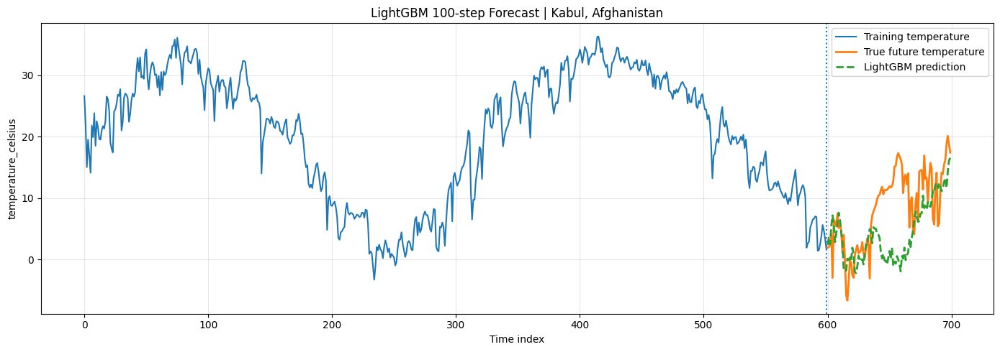

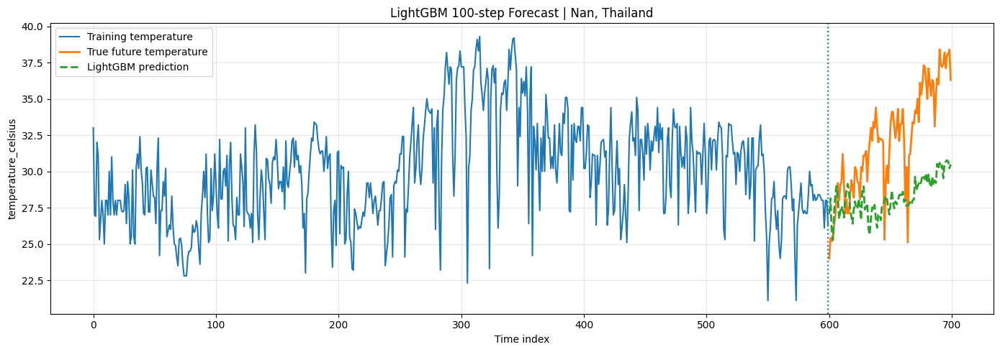

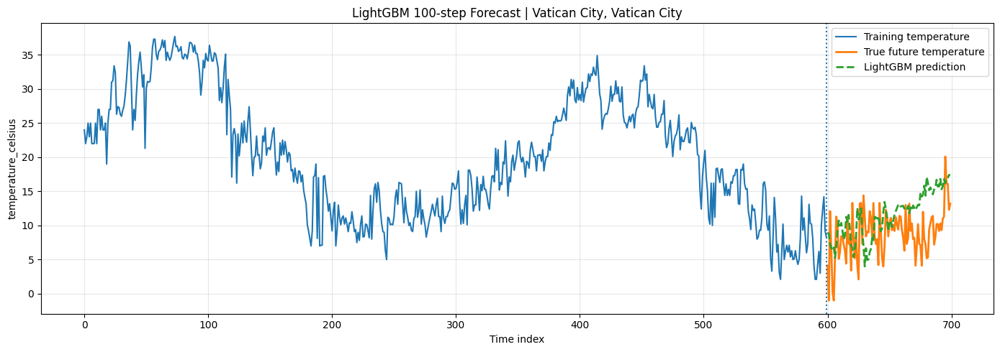

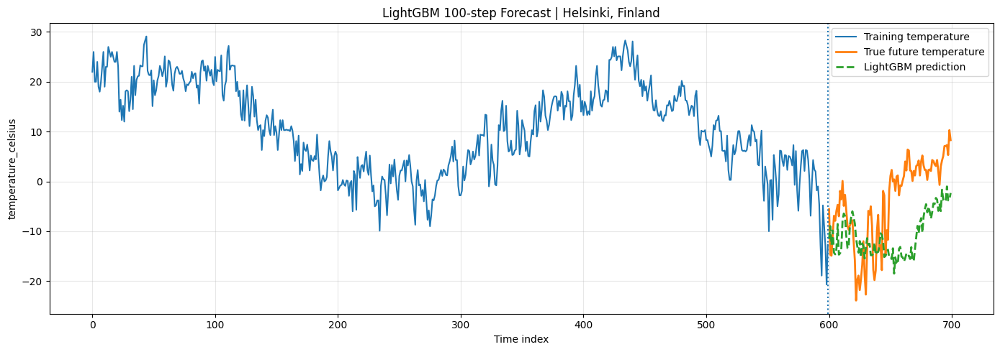

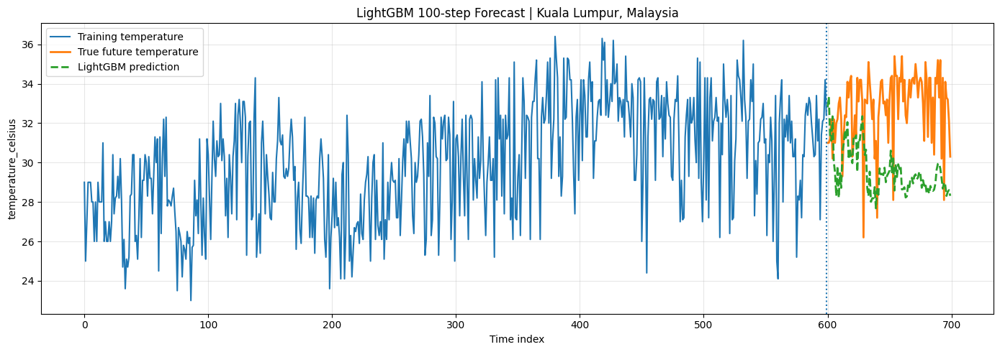

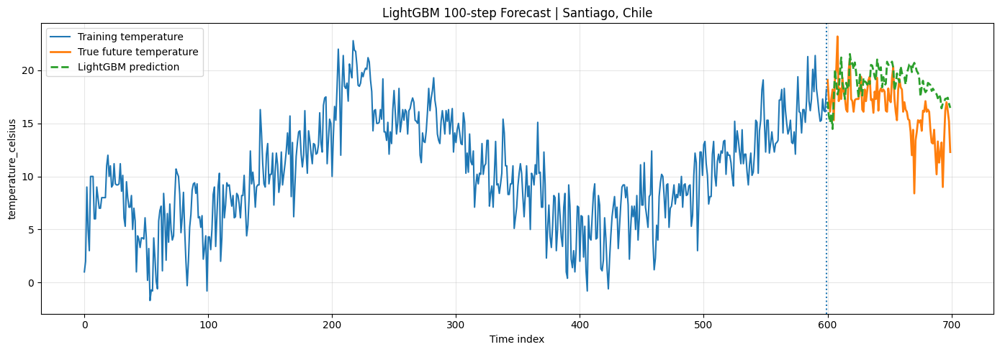

In [ ]:
# Visualization: 100-step selected cities
sample_indices = [0, 1, 2, 50, 99, 150]
for idx in sample_indices:
    if idx >= len(city_order):
        continue
    country = city_order.loc[idx,"country"]
    city = city_order.loc[idx,"location_name"]
    plt.figure(figsize=(14, 5))
    plt.plot(np.arange(600),
        X_main_train[idx],
        label="Training temperature",
        linewidth=1.5)
    plt.plot(np.arange(600, 700),
        Y_test[idx],
        label="True future temperature",
        linewidth=2)
    plt.plot(np.arange(600, 700),
        Y_pred_lgbm[idx],
        label="LightGBM prediction",
        linewidth=2,
        linestyle="--")
    plt.axvline(599,linestyle=":",linewidth=1.5)
    plt.title(f"LightGBM 100-step Forecast | {city}, {country}")
    plt.xlabel("Time index")
    plt.ylabel("temperature_celsius")
    plt.legend()
    plt.grid(alpha=0.3)
    plt.tight_layout()
    plt.show()

In [ ]:
# Save 100-step figures
FIG_100_DIR = os.path.join(FIG_DIR,"100step")
os.makedirs(FIG_100_DIR,exist_ok=True)
for idx in sample_indices:
    if idx >= len(city_order):
        continue
    country = city_order.loc[idx,"country"]
    city = city_order.loc[idx,"location_name"]
    plt.figure(figsize=(14, 5))
    plt.plot(
        np.arange(600),
        X_main_train[idx],
        label="Training temperature",
        linewidth=1.5)
    plt.plot(np.arange(600, 700),
        Y_test[idx],
        label="True future temperature",
        linewidth=2)
    plt.plot(np.arange(600, 700),
        Y_pred_lgbm[idx],
        label="LightGBM prediction",
        linewidth=2,
        linestyle="--")
    plt.axvline(599,linestyle=":",linewidth=1.5)
    plt.title(f"LightGBM 100-step Forecast | {city}, {country}")
    plt.xlabel("Time index")
    plt.ylabel("temperature_celsius")
    plt.legend()
    plt.grid(alpha=0.3)
    plt.tight_layout()
    fig_name = (f"LightGBM_100step_city_{idx}_"f"{str(city).replace(' ', '_')}.png")
    plt.savefig(os.path.join(FIG_100_DIR,fig_name),dpi=300)
    plt.close()
print("Saved 100-step figures to:")
print(FIG_100_DIR)

Saved 100-step figures to:
/content/drive/MyDrive/Weather Trend Forecasting/prediction_outputs/model_outputs/LightGBM/figures/100step


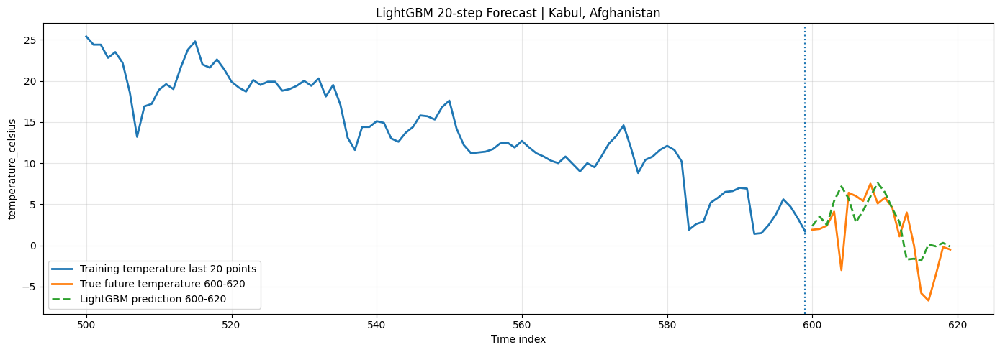

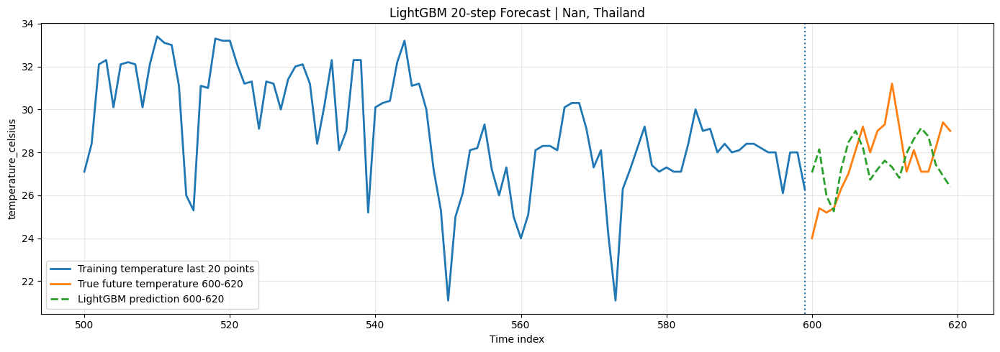

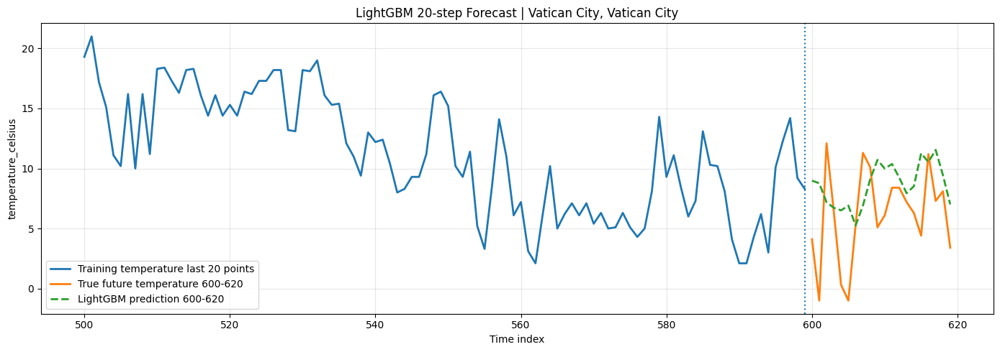

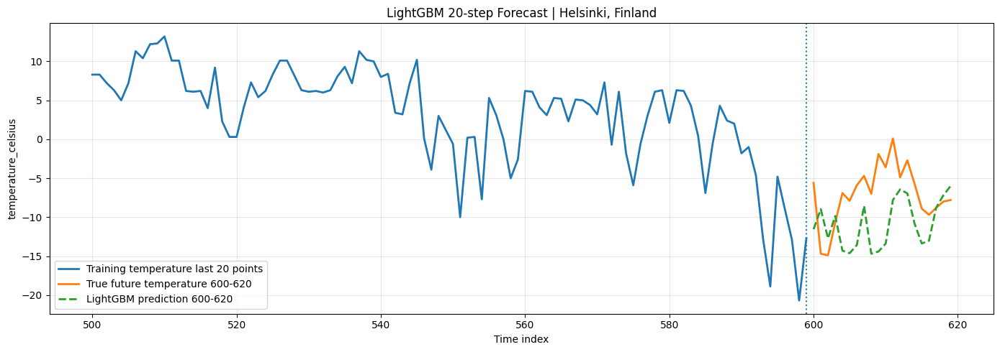

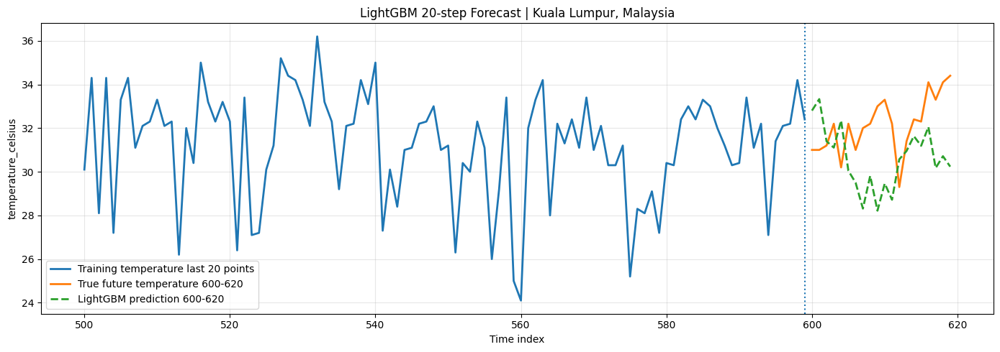

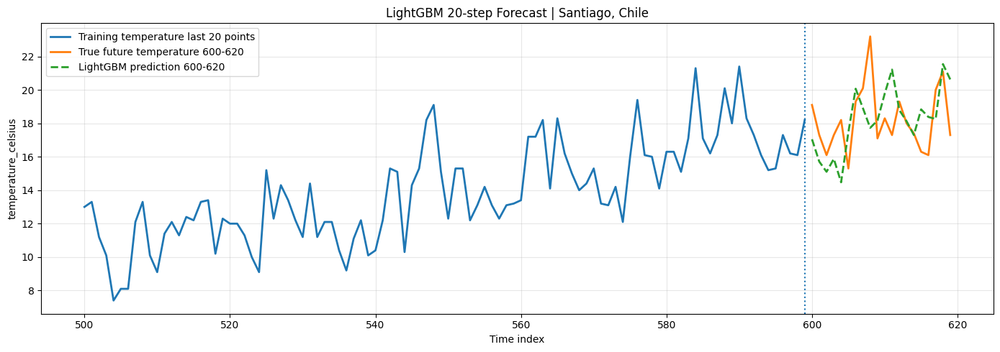

In [ ]:
# Visualization: 20-step selected cities
FIG_20_DIR = os.path.join(FIG_DIR,"20step")
os.makedirs(FIG_20_DIR,exist_ok=True)
for idx in sample_indices:
    if idx >= len(city_order):
        continue
    country = city_order.loc[idx,"country"]
    city = city_order.loc[idx,"location_name"]
    plt.figure(figsize=(14, 5))
    plt.plot(np.arange(500, 600),
        X_main_train[idx, 500:600],
        label="Training temperature last 20 points",
        linewidth=2)
    plt.plot(np.arange(600, 620),
        Y_test[idx, :20],
        label="True future temperature 600-620",
        linewidth=2)
    plt.plot(np.arange(600, 620),
        Y_pred_lgbm[idx, :20],
        label="LightGBM prediction 600-620",
        linewidth=2,
        linestyle="--")
    plt.axvline(599,linestyle=":",linewidth=1.5)
    plt.title(f"LightGBM 20-step Forecast | {city}, {country}")
    plt.xlabel("Time index")
    plt.ylabel("temperature_celsius")
    plt.legend()
    plt.grid(alpha=0.3)
    plt.tight_layout()
    plt.show()

In [ ]:
# Save 20-step figures
for idx in sample_indices:
    if idx >= len(city_order):
        continue
    country = city_order.loc[idx,"country"]
    city = city_order.loc[idx,"location_name"]
    plt.figure(figsize=(14, 5))
    plt.plot(np.arange(500, 600),
        X_main_train[idx, 500:600],
        label="Training temperature last 20 points",
        linewidth=2)
    plt.plot(np.arange(600, 620),
        Y_test[idx, :20],
        label="True future temperature 600-620",
        linewidth=2)
    plt.plot(np.arange(600, 620),
        Y_pred_lgbm[idx, :20],
        label="LightGBM prediction 600-620",
        linewidth=2,
        linestyle="--")
    plt.axvline(599,linestyle=":",linewidth=1.5)
    plt.title(f"LightGBM 20-step Forecast | {city}, {country}")
    plt.xlabel("Time index")
    plt.ylabel("temperature_celsius")
    plt.legend()
    plt.grid(alpha=0.3)
    plt.tight_layout()
    fig_name = (f"LightGBM_20step_city_{idx}_"f"{str(city).replace(' ', '_')}.png")
    plt.savefig(os.path.join(FIG_20_DIR,fig_name),dpi=300)
    plt.close()
print("Saved 20-step figures to:")
print(FIG_20_DIR)

Saved 20-step figures to:
/content/drive/MyDrive/Weather Trend Forecasting/prediction_outputs/model_outputs/LightGBM/figures/20step


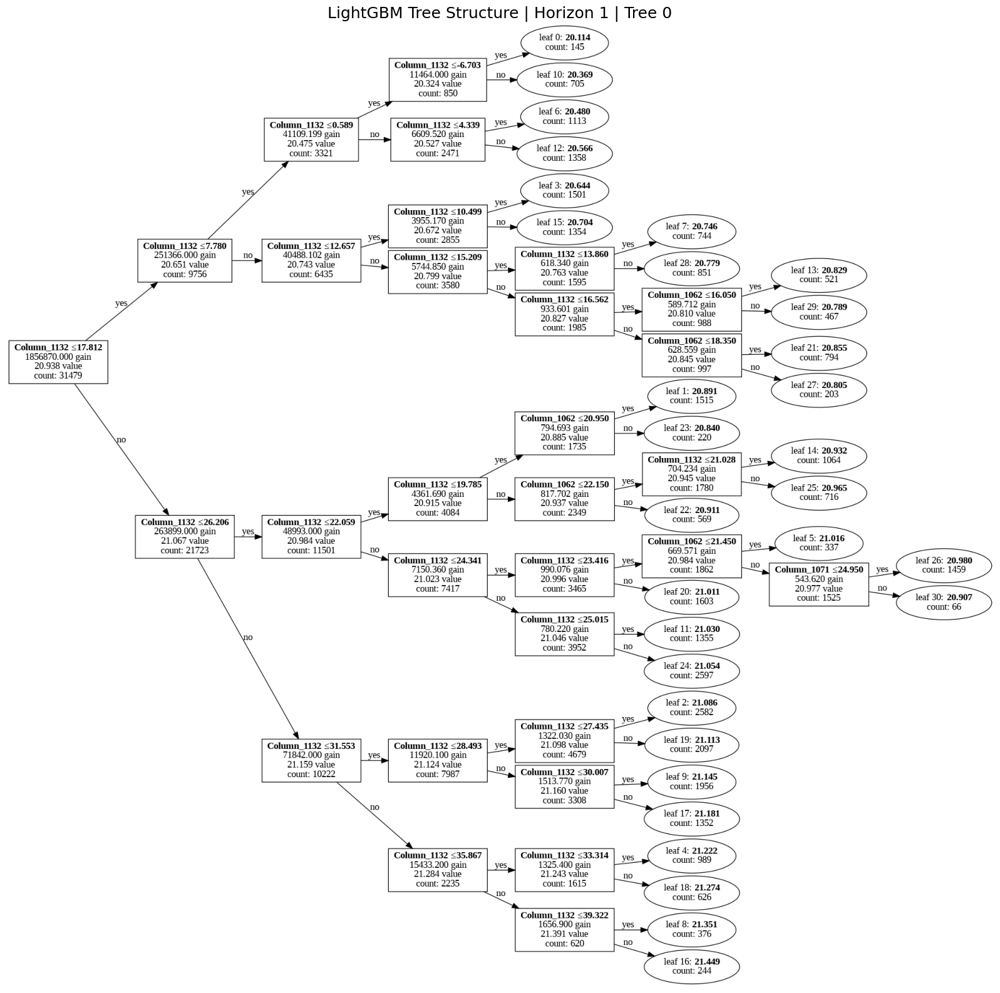

Saved: /content/drive/MyDrive/Weather Trend Forecasting/prediction_outputs/model_outputs/LightGBM/figures/tree_structures/lightgbm_horizon_1_tree_0.png


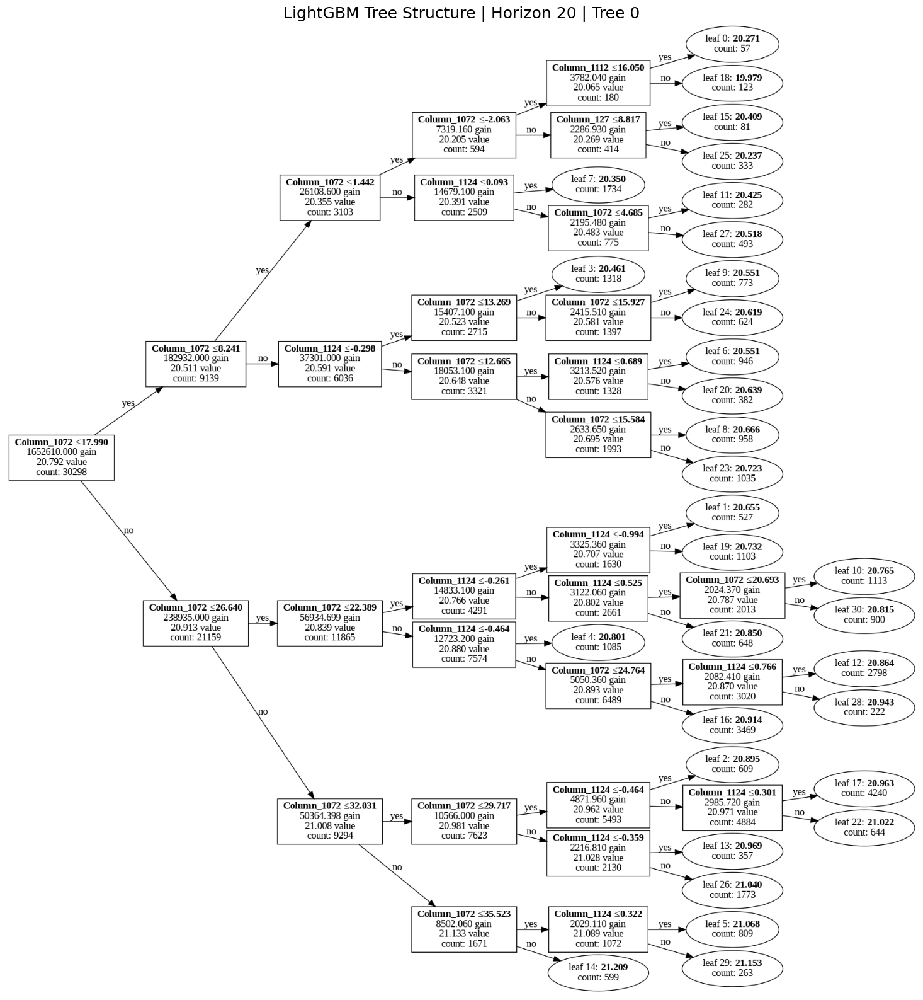

Saved: /content/drive/MyDrive/Weather Trend Forecasting/prediction_outputs/model_outputs/LightGBM/figures/tree_structures/lightgbm_horizon_20_tree_0.png


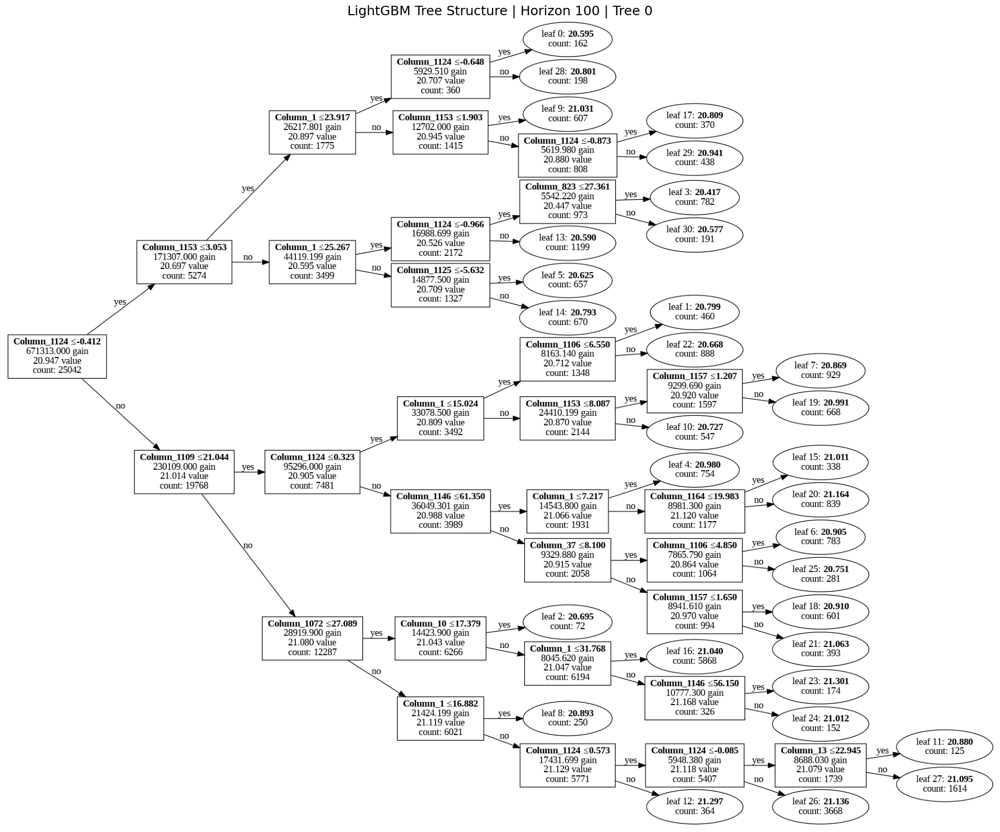

Saved: /content/drive/MyDrive/Weather Trend Forecasting/prediction_outputs/model_outputs/LightGBM/figures/tree_structures/lightgbm_horizon_100_tree_0.png


In [ ]:
# Plot selected LightGBM tree structures
import os
import matplotlib.pyplot as plt
import lightgbm as lgb
LGBM_TREE_DIR = os.path.join(
    BASE_DIR,
    "prediction_outputs",
    "model_outputs",
    "LightGBM",
    "figures",
    "tree_structures")

os.makedirs(LGBM_TREE_DIR, exist_ok=True)
selected_horizons = [1, 20, 100]
selected_tree_index = 0

for h in selected_horizons:
    model = trained_lgbm_models[h]
    ax = lgb.plot_tree(
        model,
        tree_index=selected_tree_index,
        figsize=(40, 20),
        show_info=[
            "split_gain",
            "internal_value",
            "internal_count",
            "leaf_count"])
    plt.title(f"LightGBM Tree Structure | Horizon {h} | Tree {selected_tree_index}",fontsize=18)
    fig_path = os.path.join(LGBM_TREE_DIR,f"lightgbm_horizon_{h}_tree_{selected_tree_index}.png")
    plt.savefig(fig_path,dpi=300,bbox_inches="tight")
    plt.show()
    print("Saved:", fig_path)

**LSTM**

In [ ]:
# LSTM Multi-step Temperature Forecasting
# Input:  temperature + 8 auxiliary features, shape (182, 600, 9)
# Output: temperature forecast, shape (182, 100)
# GPU: CUDA / L4

import os
import random
import warnings
warnings.filterwarnings("ignore")
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.model_selection import train_test_split
import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
from google.colab import drive
drive.mount('/content/drive')

SEED = 42

random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)
torch.cuda.manual_seed_all(SEED)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", device)

Mounted at /content/drive
Using device: cuda


In [ ]:
BASE_DIR = "/content/drive/MyDrive/Weather Trend Forecasting"
MAIN_DIR = os.path.join(BASE_DIR,
    "prediction_outputs",
    "temperature_main_dataset")
AUX_DIR = os.path.join(BASE_DIR,
    "prediction_outputs",
    "temperature_auxiliary_dataset")
LSTM_OUTPUT_DIR = os.path.join(BASE_DIR,
    "prediction_outputs",
    "model_outputs",
    "LSTM")
FIG_DIR = os.path.join(LSTM_OUTPUT_DIR, "figures")
REPORT_DIR = os.path.join(LSTM_OUTPUT_DIR, "reports")
PRED_DIR = os.path.join(LSTM_OUTPUT_DIR, "predictions")
MODEL_DIR = os.path.join(LSTM_OUTPUT_DIR, "saved_model")
for p in [LSTM_OUTPUT_DIR, FIG_DIR, REPORT_DIR, PRED_DIR, MODEL_DIR]:
    os.makedirs(p, exist_ok=True)

X_main_train = np.load(os.path.join(MAIN_DIR, "temperature_train_input.npy"))
Y_test = np.load(os.path.join(MAIN_DIR, "temperature_test_target.npy"))
X_aux = np.load(os.path.join(AUX_DIR, "X_auxiliary_8features.npy"))
city_order = pd.read_csv(os.path.join(MAIN_DIR, "city_order.csv"))
aux_feature_names = pd.read_csv(
    os.path.join(AUX_DIR, "auxiliary_feature_names.csv")
)["feature_name"].tolist()
feature_names = ["temperature_celsius"] + aux_feature_names
X_all = np.concatenate([X_main_train[:, :, None],X_aux],axis=2)

print("X_all:", X_all.shape)
print("Y_test:", Y_test.shape)
print("Features:", feature_names)

assert X_all.shape == (182, 600, 9)
assert Y_test.shape == (182, 100)

X_all: (182, 600, 9)
Y_test: (182, 100)
Features: ['temperature_celsius', 'STL_trend_of_temperature', 'STL_seasonal_of_temperature', 'Gaussian_7_temperature', 'Gaussian_30_temperature', 'humidity', 'pressure_mb', 'uv_index', 'cloud']


In [ ]:
# Hyperparameters

INPUT_LEN = 400
OUTPUT_LEN = 100
TRAIN_STRIDE = 1

BATCH_SIZE = 128
EPOCHS = 300
PATIENCE = 15

HIDDEN_SIZE = 128
NUM_LAYERS = 2
DROPOUT = 0.10
LEARNING_RATE = 1e-3
WEIGHT_DECAY = 1e-4

print("INPUT_LEN:", INPUT_LEN)
print("OUTPUT_LEN:", OUTPUT_LEN)

INPUT_LEN: 400
OUTPUT_LEN: 100


In [ ]:
# Standardization: Fit scaler using only training 600-point input data
feature_mean = X_all.reshape(-1, X_all.shape[-1]).mean(axis=0)
feature_std = X_all.reshape(-1, X_all.shape[-1]).std(axis=0)
feature_std[feature_std < 1e-8] = 1.0
X_all_scaled = (X_all - feature_mean) / feature_std
target_mean = feature_mean[0]
target_std = feature_std[0]
Y_test_scaled = (Y_test - target_mean) / target_std
print("Feature mean shape:", feature_mean.shape)
print("Feature std shape:", feature_std.shape)

Feature mean shape: (9,)
Feature std shape: (9,)


In [ ]:
# Build sliding-window training samples from first 600 points
# Each sample:
# input  = 300 × 9
# target = next 100 temperature values

X_samples = []
Y_samples = []
sample_city_indices = []

n_cities, seq_len, n_features = X_all_scaled.shape
max_start = seq_len - INPUT_LEN - OUTPUT_LEN + 1
for city_idx in range(n_cities):
    for start in range(0, max_start, TRAIN_STRIDE):
        end = start + INPUT_LEN
        out_end = end + OUTPUT_LEN
        X_samples.append(X_all_scaled[city_idx, start:end, :])
        Y_samples.append(X_all_scaled[city_idx, end:out_end, 0])
        sample_city_indices.append(city_idx)

X_samples = np.array(X_samples, dtype=np.float32)
Y_samples = np.array(Y_samples, dtype=np.float32)
sample_city_indices = np.array(sample_city_indices)

print("Sliding-window X:", X_samples.shape)
print("Sliding-window Y:", Y_samples.shape)

Sliding-window X: (18382, 400, 9)
Sliding-window Y: (18382, 100)


In [ ]:
# Train / Test datasets
train_idx, val_idx = train_test_split(
    np.arange(len(X_samples)),
    test_size=0.15,
    random_state=SEED,
    shuffle=True)

X_train_lstm = X_samples[train_idx]
Y_train_lstm = Y_samples[train_idx]

X_val_lstm = X_samples[val_idx]
Y_val_lstm = Y_samples[val_idx]

print("Train:", X_train_lstm.shape, Y_train_lstm.shape)
print("Val:", X_val_lstm.shape, Y_val_lstm.shape)

Train: (15624, 400, 9) (15624, 100)
Val: (2758, 400, 9) (2758, 100)


In [ ]:
# Dataset / DataLoader

class SequenceForecastDataset(Dataset):
    def __init__(self, X, Y):
        self.X = torch.tensor(X, dtype=torch.float32)
        self.Y = torch.tensor(Y, dtype=torch.float32)

    def __len__(self):
        return len(self.X)

    def __getitem__(self, idx):
        return self.X[idx], self.Y[idx]


train_dataset = SequenceForecastDataset(
    X_train_lstm,
    Y_train_lstm)

val_dataset = SequenceForecastDataset(
    X_val_lstm,
    Y_val_lstm)

train_loader = DataLoader(
    train_dataset,
    batch_size=BATCH_SIZE,
    shuffle=True,
    drop_last=False)

val_loader = DataLoader(
    val_dataset,
    batch_size=BATCH_SIZE,
    shuffle=False,
    drop_last=False)

In [ ]:
# LSTM Model
# Encoder LSTM + Dense decoder for 100-step direct forecast

class LSTMForecaster(nn.Module):
    def __init__(self,input_size,hidden_size=128,num_layers=2,
        dropout=0.2,output_len=100):
        super().__init__()
        self.lstm = nn.LSTM(
            input_size=input_size,
            hidden_size=hidden_size,
            num_layers=num_layers,
            batch_first=True,
            dropout=dropout if num_layers > 1 else 0.0)
        self.decoder = nn.Sequential(
            nn.Linear(hidden_size, hidden_size),
            nn.ReLU(),
            nn.Dropout(dropout),
            nn.Linear(hidden_size, hidden_size // 2),
            nn.ReLU(),
            nn.Linear(hidden_size // 2, output_len))

    def forward(self, x):
        output, (h_n, c_n) = self.lstm(x)
        last_hidden = h_n[-1]
        y_hat = self.decoder(last_hidden)
        return y_hat

model = LSTMForecaster(
    input_size=n_features,
    hidden_size=HIDDEN_SIZE,
    num_layers=NUM_LAYERS,
    dropout=DROPOUT,
    output_len=OUTPUT_LEN).to(device)
criterion = nn.MSELoss()
optimizer = torch.optim.AdamW(
    model.parameters(),
    lr=LEARNING_RATE,
    weight_decay=WEIGHT_DECAY)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
    optimizer,
    mode="min",
    factor=0.5,
    patience=5)

print(model)

LSTMForecaster(
  (lstm): LSTM(9, 128, num_layers=2, batch_first=True, dropout=0.1)
  (decoder): Sequential(
    (0): Linear(in_features=128, out_features=128, bias=True)
    (1): ReLU()
    (2): Dropout(p=0.1, inplace=False)
    (3): Linear(in_features=128, out_features=64, bias=True)
    (4): ReLU()
    (5): Linear(in_features=64, out_features=100, bias=True)
  )
)


In [ ]:
# Training loop with early stopping

best_val_loss = np.inf
best_epoch = -1
patience_counter = 0
history = []

best_model_path = os.path.join(MODEL_DIR,"best_lstm_model.pt")
for epoch in range(1, EPOCHS + 1):
    model.train()
    train_losses = []
    for xb, yb in train_loader:
        xb = xb.to(device)
        yb = yb.to(device)
        optimizer.zero_grad()
        pred = model(xb)
        loss = criterion(pred, yb)
        loss.backward()
        torch.nn.utils.clip_grad_norm_(
            model.parameters(),
            max_norm=1.0)
        optimizer.step()
        train_losses.append(loss.item())
    train_loss = float(np.mean(train_losses))
    model.eval()
    val_losses = []
    with torch.no_grad():
        for xb, yb in val_loader:
            xb = xb.to(device)
            yb = yb.to(device)
            pred = model(xb)
            loss = criterion(pred, yb)
            val_losses.append(loss.item())
    val_loss = float(np.mean(val_losses))
    scheduler.step(val_loss)
    history.append({
        "epoch": epoch,
        "train_loss": train_loss,
        "val_loss": val_loss,
        "lr": optimizer.param_groups[0]["lr"]})
    print(
        f"Epoch {epoch:03d} | "
        f"Train Loss: {train_loss:.5f} | "
        f"Val Loss: {val_loss:.5f} | "
        f"LR: {optimizer.param_groups[0]['lr']:.6f}")
    if val_loss < best_val_loss:
        best_val_loss = val_loss
        best_epoch = epoch
        patience_counter = 0
        torch.save({
                "model_state_dict": model.state_dict(),
                "feature_mean": feature_mean,
                "feature_std": feature_std,
                "target_mean": target_mean,
                "target_std": target_std,
                "config": {
                    "INPUT_LEN": INPUT_LEN,
                    "OUTPUT_LEN": OUTPUT_LEN,
                    "HIDDEN_SIZE": HIDDEN_SIZE,
                    "NUM_LAYERS": NUM_LAYERS,
                    "DROPOUT": DROPOUT}},
            best_model_path)
    else:
        patience_counter += 1
    if patience_counter >= PATIENCE:
        print("Early stopping triggered.")
        break

print("Best epoch:", best_epoch)
print("Best val loss:", best_val_loss)

Epoch 001 | Train Loss: 0.33097 | Val Loss: 0.17730 | LR: 0.001000
Epoch 002 | Train Loss: 0.16059 | Val Loss: 0.13324 | LR: 0.001000
Epoch 003 | Train Loss: 0.13263 | Val Loss: 0.13067 | LR: 0.001000
Epoch 004 | Train Loss: 0.12457 | Val Loss: 0.10913 | LR: 0.001000
Epoch 005 | Train Loss: 0.11308 | Val Loss: 0.10676 | LR: 0.001000
Epoch 006 | Train Loss: 0.10656 | Val Loss: 0.10803 | LR: 0.001000
Epoch 007 | Train Loss: 0.10088 | Val Loss: 0.09482 | LR: 0.001000
Epoch 008 | Train Loss: 0.09359 | Val Loss: 0.09139 | LR: 0.001000
Epoch 009 | Train Loss: 0.09416 | Val Loss: 0.09195 | LR: 0.001000
Epoch 010 | Train Loss: 0.09292 | Val Loss: 0.08601 | LR: 0.001000
Epoch 011 | Train Loss: 0.08633 | Val Loss: 0.08310 | LR: 0.001000
Epoch 012 | Train Loss: 0.08450 | Val Loss: 0.08463 | LR: 0.001000
Epoch 013 | Train Loss: 0.08841 | Val Loss: 0.08116 | LR: 0.001000
Epoch 014 | Train Loss: 0.08443 | Val Loss: 0.09226 | LR: 0.001000
Epoch 015 | Train Loss: 0.08340 | Val Loss: 0.07907 | LR: 0.00

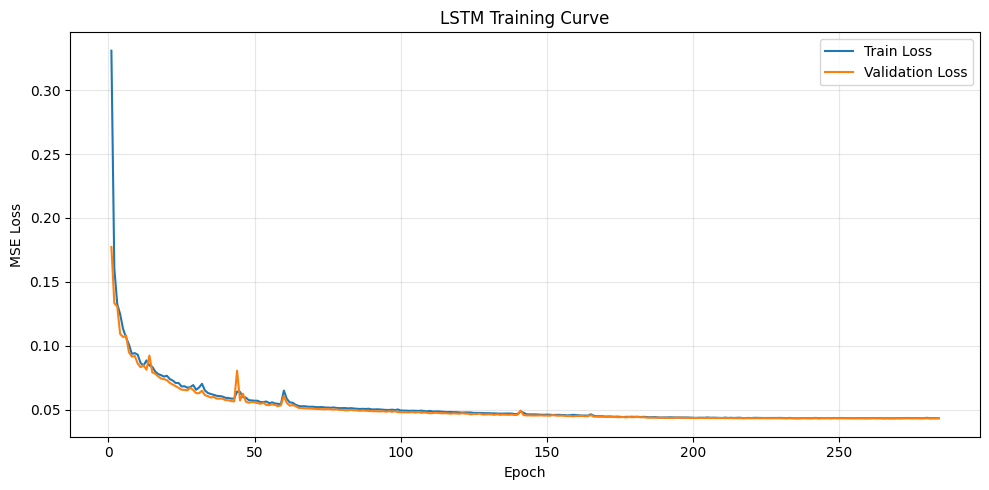

In [ ]:
# Load best model
checkpoint = torch.load(best_model_path,map_location=device,weights_only=False)
model.load_state_dict(checkpoint["model_state_dict"])
model.eval()
history_df = pd.DataFrame(history)
history_df.to_csv(os.path.join(REPORT_DIR, "lstm_training_history.csv"),index=False)
plt.figure(figsize=(10, 5))
plt.plot(history_df["epoch"], history_df["train_loss"], label="Train Loss")
plt.plot(history_df["epoch"], history_df["val_loss"], label="Validation Loss")
plt.xlabel("Epoch")
plt.ylabel("MSE Loss")
plt.title("LSTM Training Curve")
plt.legend()
plt.grid(alpha=0.3)
plt.tight_layout()
plt.savefig(
    os.path.join(FIG_DIR, "lstm_training_curve.png"),
    dpi=300)
plt.show()

In [ ]:
# Forecast 100 steps for all 182 cities
# Use last INPUT_LEN points from each 600-point training sequence
X_forecast = X_all_scaled[:, -INPUT_LEN:, :].astype(np.float32)
forecast_dataset = torch.tensor(X_forecast,dtype=torch.float32).to(device)
with torch.no_grad():
    Y_pred_scaled = model(forecast_dataset).cpu().numpy()
Y_pred_lstm = Y_pred_scaled * target_std + target_mean
print("Y_pred_lstm:", Y_pred_lstm.shape)

Y_pred_lstm: (182, 100)


In [ ]:
# Metrics
def calculate_metrics(y_true, y_pred):
    y_true = np.asarray(y_true, dtype=float)
    y_pred = np.asarray(y_pred, dtype=float)
    mae = mean_absolute_error(y_true, y_pred)
    rmse = np.sqrt(mean_squared_error(y_true, y_pred))
    smape = np.mean(2 * np.abs(y_pred - y_true)
        / np.maximum(np.abs(y_true) + np.abs(y_pred), 1e-6)) * 100
    r2 = r2_score(y_true, y_pred)
    return {
        "MAE": mae,
        "RMSE": rmse,
        "SMAPE_%": smape,
        "R2": r2}

In [ ]:
# 100-step evaluation

lstm_100_overall = calculate_metrics(
    Y_test.flatten(),
    Y_pred_lstm.flatten())

lstm_100_overall_df = pd.DataFrame([{
    "model": "LSTM",
    "horizon": "600_to_700",
    "forecast_steps": 100,
    **lstm_100_overall}])

city_100_records = []

for city_idx in range(Y_test.shape[0]):
    country = city_order.loc[city_idx, "country"]
    city = city_order.loc[city_idx, "location_name"]
    metrics = calculate_metrics(
        Y_test[city_idx],
        Y_pred_lstm[city_idx])
    city_100_records.append({
        "city_index": city_idx,
        "country": country,
        "location_name": city,
        **metrics})

lstm_100_city_df = pd.DataFrame(city_100_records)
display(lstm_100_overall_df)
display(lstm_100_city_df.describe())

,model,horizon,forecast_steps,MAE,RMSE,SMAPE_%,R2
0,LSTM,600_to_700,100,4.743418,7.075972,45.02436,0.580031


,city_index,MAE,RMSE,SMAPE_%,R2
count,182.000000,182.000000,182.000000,182.000000,182.000000
mean,90.500000,4.743418,5.537906,45.024360,-3.345714
std,52.683014,3.955920,4.416804,47.661324,6.263488
min,0.000000,0.555911,0.754376,2.298195,-51.388386
25%,45.250000,1.907487,2.283234,8.192339,-3.129787
50%,90.500000,3.232087,3.853770,24.676640,-1.411739
75%,135.750000,6.253425,7.097590,67.344622,-0.334261
max,181.000000,18.572669,21.175831,188.975687,0.555301


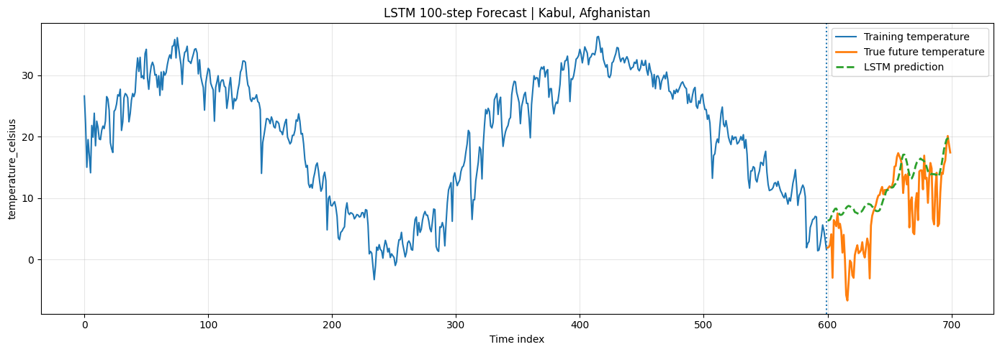

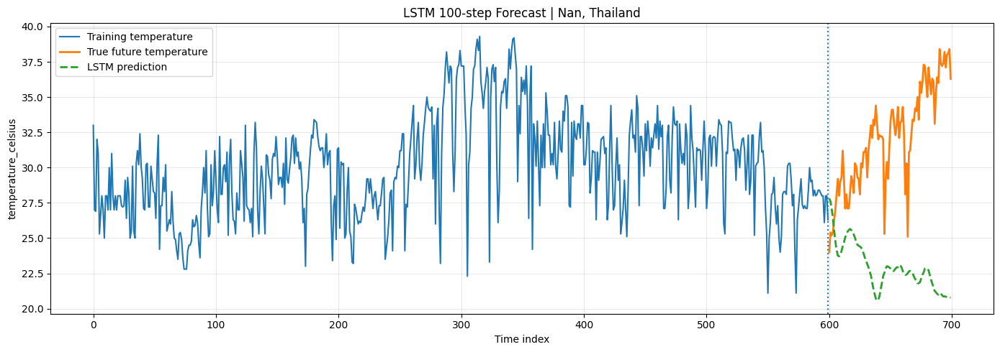

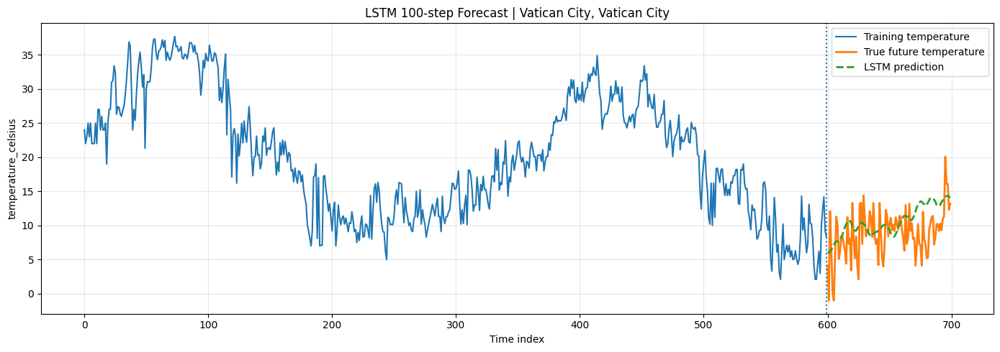

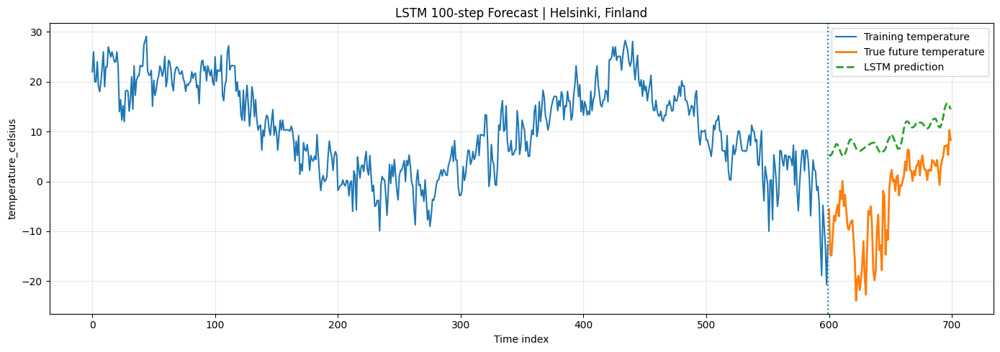

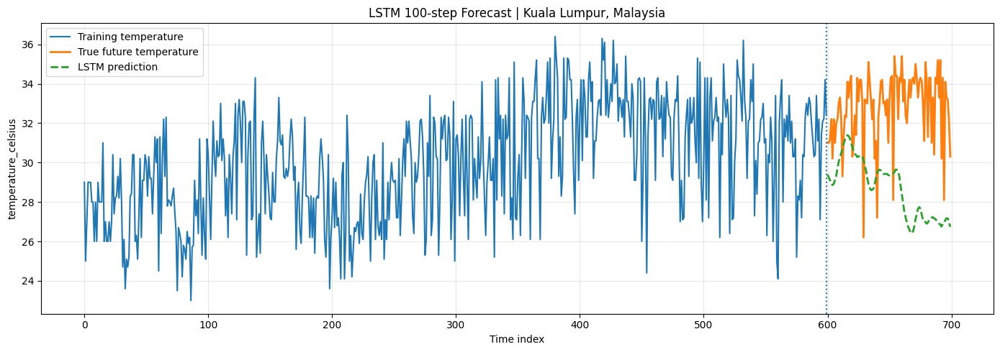

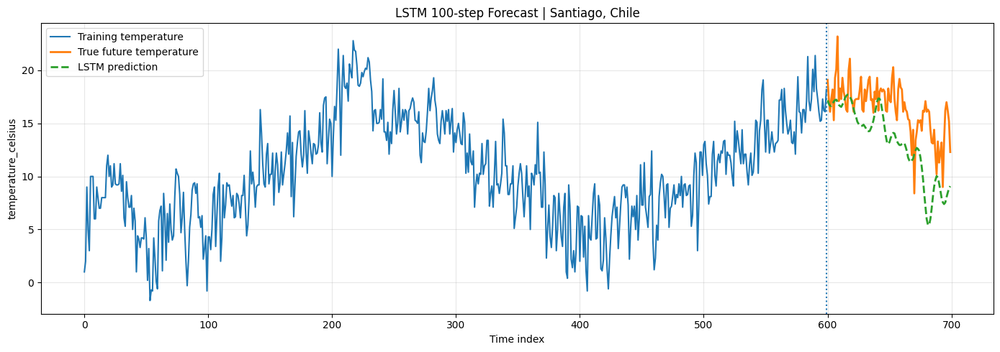

In [ ]:
# Visualization: 100-step selected cities

sample_indices = [0, 1, 2, 50, 99, 150]
FIG_100_DIR = os.path.join(FIG_DIR, "100step")
FIG_20_DIR = os.path.join(FIG_DIR, "20step")
os.makedirs(FIG_100_DIR, exist_ok=True)
os.makedirs(FIG_20_DIR, exist_ok=True)
for idx in sample_indices:
    if idx >= len(city_order):
        continue
    country = city_order.loc[idx, "country"]
    city = city_order.loc[idx, "location_name"]
    plt.figure(figsize=(14, 5))
    plt.plot(
        np.arange(600),
        X_main_train[idx],
        label="Training temperature",
        linewidth=1.5)
    plt.plot(
        np.arange(600, 700),
        Y_test[idx],
        label="True future temperature",
        linewidth=2)
    plt.plot(
        np.arange(600, 700),
        Y_pred_lstm[idx],
        label="LSTM prediction",
        linewidth=2,
        linestyle="--")
    plt.axvline(
        599,
        linestyle=":",
        linewidth=1.5)
    plt.title(
        f"LSTM 100-step Forecast | {city}, {country}")

    plt.xlabel("Time index")
    plt.ylabel("temperature_celsius")
    plt.legend()
    plt.grid(alpha=0.3)
    plt.tight_layout()
    plt.show()
    fig_name = f"LSTM_100step_city_{idx}_{str(city).replace(' ', '_')}.png"
    plt.savefig(os.path.join(FIG_100_DIR, fig_name),dpi=300)
    plt.close()

In [ ]:
# 20-step evaluation

SHORT_HORIZON = 20
Y_true_20 = Y_test[:, :SHORT_HORIZON]
Y_pred_20 = Y_pred_lstm[:, :SHORT_HORIZON]
lstm_20_overall = calculate_metrics(
    Y_true_20.flatten(),
    Y_pred_20.flatten())

lstm_20_overall_df = pd.DataFrame([{
    "model": "LSTM",
    "horizon": "600_to_620",
    "forecast_steps": 20,
    **lstm_20_overall}])

city_20_records = []

for city_idx in range(Y_true_20.shape[0]):
    country = city_order.loc[city_idx, "country"]
    city = city_order.loc[city_idx, "location_name"]
    metrics = calculate_metrics(
        Y_true_20[city_idx],
        Y_pred_20[city_idx])
    city_20_records.append({
        "city_index": city_idx,
        "country": country,
        "location_name": city,
        **metrics})

lstm_20_city_df = pd.DataFrame(city_20_records)
display(lstm_20_overall_df)
display(lstm_20_city_df.describe())

,model,horizon,forecast_steps,MAE,RMSE,SMAPE_%,R2
0,LSTM,600_to_620,20,3.967312,6.322626,50.033918,0.742683


,city_index,MAE,RMSE,SMAPE_%,R2
count,182.000000,182.000000,182.000000,182.000000,182.000000
mean,90.500000,3.967312,4.500036,50.033918,-2.956058
std,52.683014,4.259237,4.453566,65.347468,5.036227
min,0.000000,0.201862,0.266522,0.802472,-33.472554
25%,45.250000,1.417851,1.695953,5.796206,-2.869711
50%,90.500000,2.310938,2.793160,13.292508,-0.904835
75%,135.750000,4.726750,5.603937,72.002986,-0.328906
max,181.000000,23.379031,23.952400,200.000000,0.267410


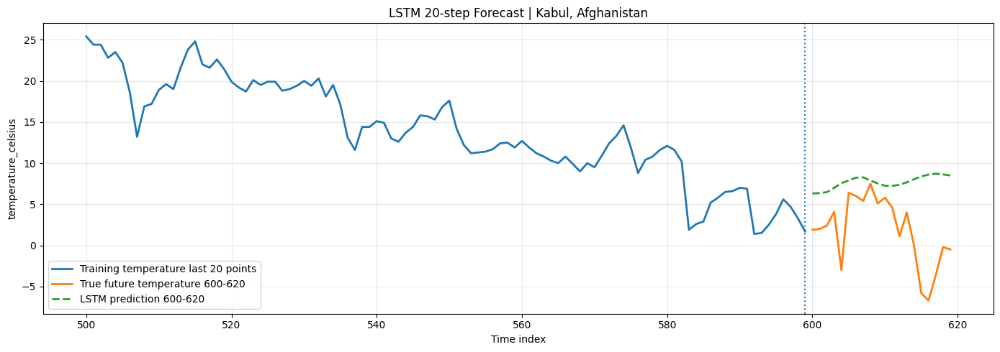

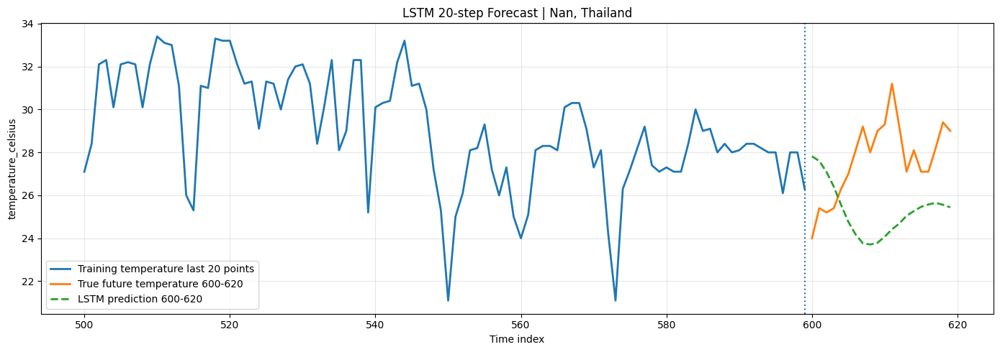

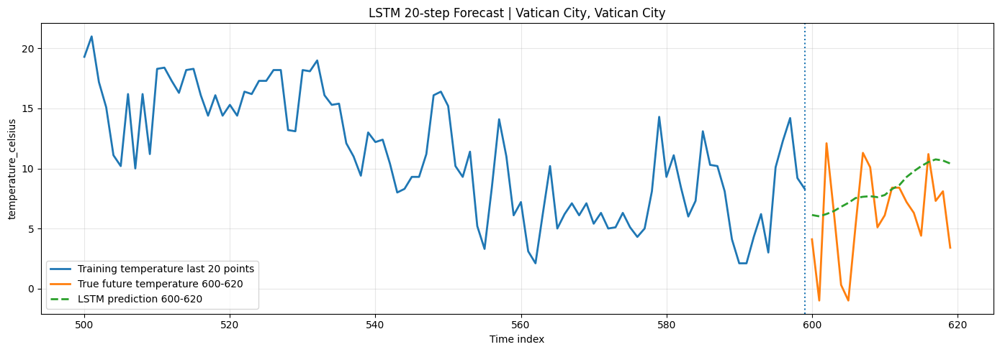

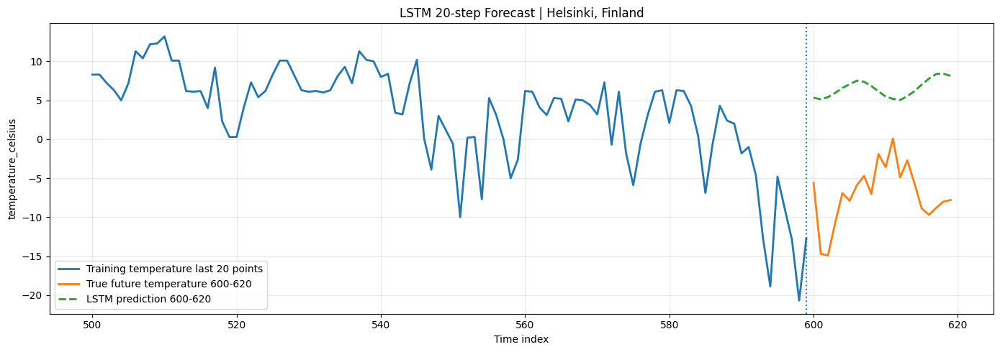

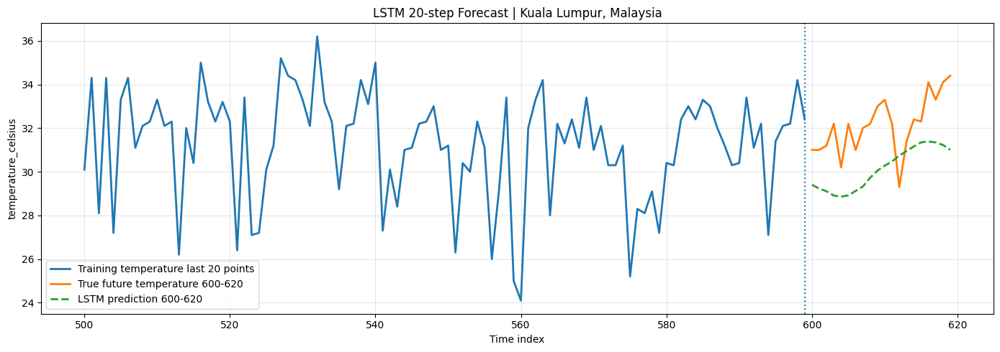

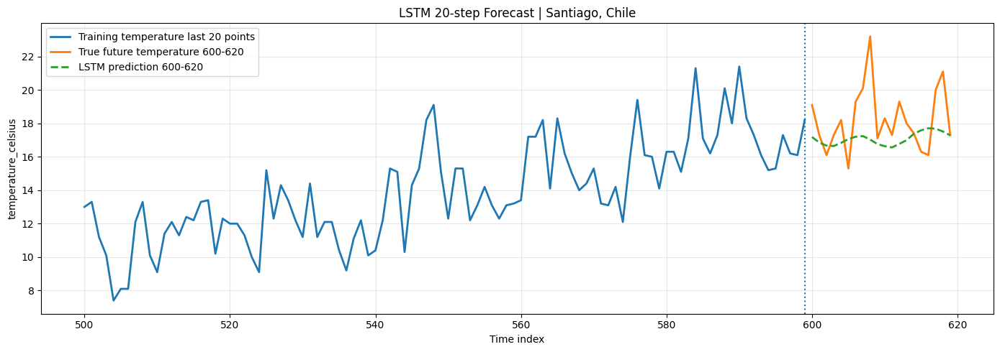

Saved LSTM figures to:
/content/drive/MyDrive/Weather Trend Forecasting/prediction_outputs/model_outputs/LSTM/figures


In [ ]:
# Visualization: 20-step selected cities
for idx in sample_indices:
    if idx >= len(city_order):
        continue
    country = city_order.loc[idx, "country"]
    city = city_order.loc[idx, "location_name"]
    plt.figure(figsize=(14, 5))
    plt.plot(
        np.arange(500, 600),
        X_main_train[idx, 500:600],
        label="Training temperature last 20 points",
        linewidth=2)
    plt.plot(
        np.arange(600, 620),
        Y_test[idx, :20],
        label="True future temperature 600-620",
        linewidth=2)
    plt.plot(
        np.arange(600, 620),
        Y_pred_lstm[idx, :20],
        label="LSTM prediction 600-620",
        linewidth=2,
        linestyle="--")
    plt.axvline(
        599,
        linestyle=":",
        linewidth=1.5)
    plt.title(f"LSTM 20-step Forecast | {city}, {country}")
    plt.xlabel("Time index")
    plt.ylabel("temperature_celsius")
    plt.legend()
    plt.grid(alpha=0.3)
    plt.tight_layout()
    plt.show()
    fig_name = f"LSTM_20step_city_{idx}_{str(city).replace(' ', '_')}.png"
    plt.savefig(os.path.join(FIG_20_DIR, fig_name),dpi=300)
    plt.close()
print("Saved LSTM figures to:")
print(FIG_DIR)

In [ ]:
# Save numeric results
np.save(os.path.join(PRED_DIR, "Y_pred_lstm.npy"),Y_pred_lstm)
pd.DataFrame(Y_pred_lstm).to_csv(os.path.join(PRED_DIR, "Y_pred_lstm.csv"),index=False)
lstm_100_overall_df.to_csv(os.path.join(REPORT_DIR, "lstm_overall_100step_metrics.csv"),index=False)
lstm_100_city_df.to_csv(os.path.join(REPORT_DIR, "lstm_city_level_100step_metrics.csv"),index=False)
lstm_20_overall_df.to_csv(os.path.join(REPORT_DIR, "lstm_overall_20step_metrics.csv"),index=False)
lstm_20_city_df.to_csv(os.path.join(REPORT_DIR, "lstm_city_level_20step_metrics.csv"),index=False)
print("Saved LSTM results to:")
print(LSTM_OUTPUT_DIR)

Saved LSTM results to:
/content/drive/MyDrive/Weather Trend Forecasting/prediction_outputs/model_outputs/LSTM


**Temporal Fusion Transformer（TFT）**

In [ ]:
# Temporal Fusion Transformer-style Forecasting
# Input:  (182, 600, 9)
# Output: (182, 100)
# GPU: CUDA / L4

import os
import random
import warnings
warnings.filterwarnings("ignore")

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.model_selection import train_test_split

import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader

SEED = 42
random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)
torch.cuda.manual_seed_all(SEED)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", device)

Using device: cuda


In [ ]:
# Paths + Auto Load Data

BASE_DIR = "/content/drive/MyDrive/Weather Trend Forecasting"
MAIN_DIR = None
AUX_DIR = None

for root, dirs, files in os.walk(BASE_DIR):
    if "temperature_train_input.npy" in files:
        MAIN_DIR = root
    if "X_auxiliary_8features.npy" in files:
        AUX_DIR = root

print("MAIN_DIR:", MAIN_DIR)
print("AUX_DIR:", AUX_DIR)

if MAIN_DIR is None:
    raise FileNotFoundError("temperature_train_input.npy not found.")

if AUX_DIR is None:
    raise FileNotFoundError("X_auxiliary_8features.npy not found.")

TFT_OUTPUT_DIR = os.path.join(
    BASE_DIR,
    "prediction_outputs",
    "model_outputs",
    "TFT")

FIG_DIR = os.path.join(TFT_OUTPUT_DIR, "figures")
REPORT_DIR = os.path.join(TFT_OUTPUT_DIR, "reports")
PRED_DIR = os.path.join(TFT_OUTPUT_DIR, "predictions")
MODEL_DIR = os.path.join(TFT_OUTPUT_DIR, "saved_model")

for p in [TFT_OUTPUT_DIR, FIG_DIR, REPORT_DIR, PRED_DIR, MODEL_DIR]:
    os.makedirs(p, exist_ok=True)

X_main_train = np.load(os.path.join(MAIN_DIR, "temperature_train_input.npy"))
Y_test = np.load(os.path.join(MAIN_DIR, "temperature_test_target.npy"))
X_aux = np.load(os.path.join(AUX_DIR, "X_auxiliary_8features.npy"))

city_order = pd.read_csv(os.path.join(MAIN_DIR, "city_order.csv"))

aux_feature_names = pd.read_csv(
    os.path.join(AUX_DIR, "auxiliary_feature_names.csv")
)["feature_name"].tolist()

feature_names = ["temperature_celsius"] + aux_feature_names

X_all = np.concatenate(
    [X_main_train[:, :, None], X_aux],
    axis=2)

print("X_all:", X_all.shape)
print("Y_test:", Y_test.shape)
print("Features:", feature_names)

assert X_all.shape == (182, 600, 9)
assert Y_test.shape == (182, 100)

MAIN_DIR: /content/drive/MyDrive/Weather Trend Forecasting/prediction_outputs/temperature_main_dataset
AUX_DIR: /content/drive/MyDrive/Weather Trend Forecasting/prediction_outputs/temperature_auxiliary_dataset
X_all: (182, 600, 9)
Y_test: (182, 100)
Features: ['temperature_celsius', 'STL_trend_of_temperature', 'STL_seasonal_of_temperature', 'Gaussian_7_temperature', 'Gaussian_30_temperature', 'humidity', 'pressure_mb', 'uv_index', 'cloud']


In [ ]:
# Hyperparameters

INPUT_LEN = 400
OUTPUT_LEN = 100
TRAIN_STRIDE = 1

BATCH_SIZE = 128
EPOCHS = 300
PATIENCE = 20

D_MODEL = 128
N_HEADS = 4
NUM_TRANSFORMER_LAYERS = 2
DROPOUT = 0.15

LEARNING_RATE = 8e-4
WEIGHT_DECAY = 1e-4

In [ ]:
# Standardization
feature_mean = X_all.reshape(-1, X_all.shape[-1]).mean(axis=0)
feature_std = X_all.reshape(-1, X_all.shape[-1]).std(axis=0)
feature_std[feature_std < 1e-8] = 1.0
X_all_scaled = (X_all - feature_mean) / feature_std
target_mean = feature_mean[0]
target_std = feature_std[0]
print("target_mean:", target_mean)
print("target_std:", target_std)

target_mean: 22.0373717948754
target_std: 9.223535762223879


In [ ]:
# Sliding Window Samples

X_samples = []
Y_samples = []

n_cities, seq_len, n_features = X_all_scaled.shape
max_start = seq_len - INPUT_LEN - OUTPUT_LEN + 1

for city_idx in range(n_cities):
    for start in range(0, max_start, TRAIN_STRIDE):
        end = start + INPUT_LEN
        out_end = end + OUTPUT_LEN

        X_samples.append(X_all_scaled[city_idx, start:end, :])
        Y_samples.append(X_all_scaled[city_idx, end:out_end, 0])

X_samples = np.array(X_samples, dtype=np.float32)
Y_samples = np.array(Y_samples, dtype=np.float32)

print("X_samples:", X_samples.shape)
print("Y_samples:", Y_samples.shape)

X_samples: (18382, 400, 9)
Y_samples: (18382, 100)


In [ ]:
# Train / Validation Split

train_idx, val_idx = train_test_split(
    np.arange(len(X_samples)),
    test_size=0.15,
    random_state=SEED,
    shuffle=True)

X_train = X_samples[train_idx]
Y_train = Y_samples[train_idx]

X_val = X_samples[val_idx]
Y_val = Y_samples[val_idx]

print("Train:", X_train.shape, Y_train.shape)
print("Val:", X_val.shape, Y_val.shape)

Train: (15624, 400, 9) (15624, 100)
Val: (2758, 400, 9) (2758, 100)


In [ ]:
# Dataset
class ForecastDataset(Dataset):
    def __init__(self, X, Y):
        self.X = torch.tensor(X, dtype=torch.float32)
        self.Y = torch.tensor(Y, dtype=torch.float32)

    def __len__(self):
        return len(self.X)

    def __getitem__(self, idx):
        return self.X[idx], self.Y[idx]


train_loader = DataLoader(
    ForecastDataset(X_train, Y_train),
    batch_size=BATCH_SIZE,
    shuffle=True)

val_loader = DataLoader(
    ForecastDataset(X_val, Y_val),
    batch_size=BATCH_SIZE,
    shuffle=False)

In [ ]:
# TFT-style Model
# Variable Selection + LSTM Encoder + Transformer Attention + Decoder

class VariableSelectionNetwork(nn.Module):
    def __init__(self, input_size, d_model):
        super().__init__()
        self.feature_proj = nn.ModuleList([
            nn.Linear(1, d_model)
            for _ in range(input_size)])
        self.weight_net = nn.Sequential(
            nn.Linear(input_size, d_model),
            nn.ReLU(),
            nn.Linear(d_model, input_size),
            nn.Softmax(dim=-1))

    def forward(self, x):
        # x: batch, time, features
        weights = self.weight_net(x)  # batch, time, features
        projected = []
        for i, proj in enumerate(self.feature_proj):
            projected.append(proj(x[:, :, i:i+1]))
        projected = torch.stack(projected, dim=2)  # batch,time,features,d_model
        weighted = projected * weights.unsqueeze(-1)
        out = weighted.sum(dim=2)
        return out, weights


class TFTStyleForecaster(nn.Module):
    def __init__(
        self,
        input_size,
        d_model=128,
        n_heads=4,
        num_layers=2,
        dropout=0.15,
        output_len=100):
        super().__init__()
        self.vsn = VariableSelectionNetwork(
            input_size=input_size,
            d_model=d_model)
        self.lstm = nn.LSTM(
            input_size=d_model,
            hidden_size=d_model,
            num_layers=1,
            batch_first=True)
        encoder_layer = nn.TransformerEncoderLayer(
            d_model=d_model,
            nhead=n_heads,
            dim_feedforward=d_model * 4,
            dropout=dropout,
            batch_first=True,
            activation="gelu")
        self.transformer_encoder = nn.TransformerEncoder(
            encoder_layer,
            num_layers=num_layers)
        self.gate = nn.Sequential(
            nn.Linear(d_model, d_model),
            nn.Sigmoid())
        self.norm = nn.LayerNorm(d_model)
        self.decoder = nn.Sequential(
            nn.Linear(d_model, d_model),
            nn.GELU(),
            nn.Dropout(dropout),
            nn.Linear(d_model, d_model // 2),
            nn.GELU(),
            nn.Linear(d_model // 2, output_len))

    def forward(self, x):
        x_vsn, weights = self.vsn(x)
        lstm_out, _ = self.lstm(x_vsn)
        attn_out = self.transformer_encoder(lstm_out)
        pooled = attn_out[:, -1, :]
        gated = self.gate(pooled) * pooled
        gated = self.norm(gated)
        y_hat = self.decoder(gated)
        return y_hat, weights


model = TFTStyleForecaster(
    input_size=n_features,
    d_model=D_MODEL,
    n_heads=N_HEADS,
    num_layers=NUM_TRANSFORMER_LAYERS,
    dropout=DROPOUT,
    output_len=OUTPUT_LEN
).to(device)

criterion = nn.MSELoss()

optimizer = torch.optim.AdamW(
    model.parameters(),
    lr=LEARNING_RATE,
    weight_decay=WEIGHT_DECAY)

scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
    optimizer,
    mode="min",
    factor=0.5,
    patience=6)

print(model)

TFTStyleForecaster(
  (vsn): VariableSelectionNetwork(
    (feature_proj): ModuleList(
      (0-8): 9 x Linear(in_features=1, out_features=128, bias=True)
    )
    (weight_net): Sequential(
      (0): Linear(in_features=9, out_features=128, bias=True)
      (1): ReLU()
      (2): Linear(in_features=128, out_features=9, bias=True)
      (3): Softmax(dim=-1)
    )
  )
  (lstm): LSTM(128, 128, batch_first=True)
  (transformer_encoder): TransformerEncoder(
    (layers): ModuleList(
      (0-1): 2 x TransformerEncoderLayer(
        (self_attn): MultiheadAttention(
          (out_proj): NonDynamicallyQuantizableLinear(in_features=128, out_features=128, bias=True)
        )
        (linear1): Linear(in_features=128, out_features=512, bias=True)
        (dropout): Dropout(p=0.15, inplace=False)
        (linear2): Linear(in_features=512, out_features=128, bias=True)
        (norm1): LayerNorm((128,), eps=1e-05, elementwise_affine=True)
        (norm2): LayerNorm((128,), eps=1e-05, elementwise_

In [ ]:
# Training

best_val_loss = np.inf
patience_counter = 0
best_epoch = -1
history = []
best_model_path = os.path.join(MODEL_DIR, "best_tft_style_model.pt")

for epoch in range(1, EPOCHS + 1):
    model.train()
    train_losses = []
    for xb, yb in train_loader:
        xb = xb.to(device)
        yb = yb.to(device)
        optimizer.zero_grad()
        pred, _ = model(xb)
        loss = criterion(pred, yb)
        loss.backward()
        torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)
        optimizer.step()
        train_losses.append(loss.item())
    train_loss = float(np.mean(train_losses))
    model.eval()
    val_losses = []
    with torch.no_grad():
        for xb, yb in val_loader:
            xb = xb.to(device)
            yb = yb.to(device)
            pred, _ = model(xb)
            loss = criterion(pred, yb)
            val_losses.append(loss.item())
    val_loss = float(np.mean(val_losses))
    scheduler.step(val_loss)
    history.append({
        "epoch": epoch,
        "train_loss": train_loss,
        "val_loss": val_loss,
        "lr": optimizer.param_groups[0]["lr"]})
    print(
        f"Epoch {epoch:03d} | "
        f"Train Loss: {train_loss:.5f} | "
        f"Val Loss: {val_loss:.5f} | "
        f"LR: {optimizer.param_groups[0]['lr']:.6f}")
    if val_loss < best_val_loss:
        best_val_loss = val_loss
        best_epoch = epoch
        patience_counter = 0
        torch.save({
            "model_state_dict": model.state_dict(),
            "feature_mean": feature_mean,
            "feature_std": feature_std,
            "target_mean": target_mean,
            "target_std": target_std,
            "feature_names": feature_names,
            "config": {
                "INPUT_LEN": INPUT_LEN,
                "OUTPUT_LEN": OUTPUT_LEN,
                "D_MODEL": D_MODEL,
                "N_HEADS": N_HEADS,
                "NUM_TRANSFORMER_LAYERS": NUM_TRANSFORMER_LAYERS,
                "DROPOUT": DROPOUT}}, best_model_path)
    else:
        patience_counter += 1
    if patience_counter >= PATIENCE:
        print("Early stopping triggered.")
        break
print("Best epoch:", best_epoch)
print("Best val loss:", best_val_loss)

Epoch 001 | Train Loss: 0.25329 | Val Loss: 0.11949 | LR: 0.000800
Epoch 002 | Train Loss: 0.11481 | Val Loss: 0.10250 | LR: 0.000800
Epoch 003 | Train Loss: 0.10448 | Val Loss: 0.09340 | LR: 0.000800
Epoch 004 | Train Loss: 0.09351 | Val Loss: 0.08732 | LR: 0.000800
Epoch 005 | Train Loss: 0.08859 | Val Loss: 0.08119 | LR: 0.000800
Epoch 006 | Train Loss: 0.08542 | Val Loss: 0.08050 | LR: 0.000800
Epoch 007 | Train Loss: 0.08271 | Val Loss: 0.07715 | LR: 0.000800
Epoch 008 | Train Loss: 0.08137 | Val Loss: 0.07824 | LR: 0.000800
Epoch 009 | Train Loss: 0.08034 | Val Loss: 0.07603 | LR: 0.000800
Epoch 010 | Train Loss: 0.07880 | Val Loss: 0.07392 | LR: 0.000800
Epoch 011 | Train Loss: 0.07663 | Val Loss: 0.08109 | LR: 0.000800
Epoch 012 | Train Loss: 0.07775 | Val Loss: 0.07259 | LR: 0.000800
Epoch 013 | Train Loss: 0.07541 | Val Loss: 0.07113 | LR: 0.000800
Epoch 014 | Train Loss: 0.07414 | Val Loss: 0.06961 | LR: 0.000800
Epoch 015 | Train Loss: 0.07371 | Val Loss: 0.06923 | LR: 0.00

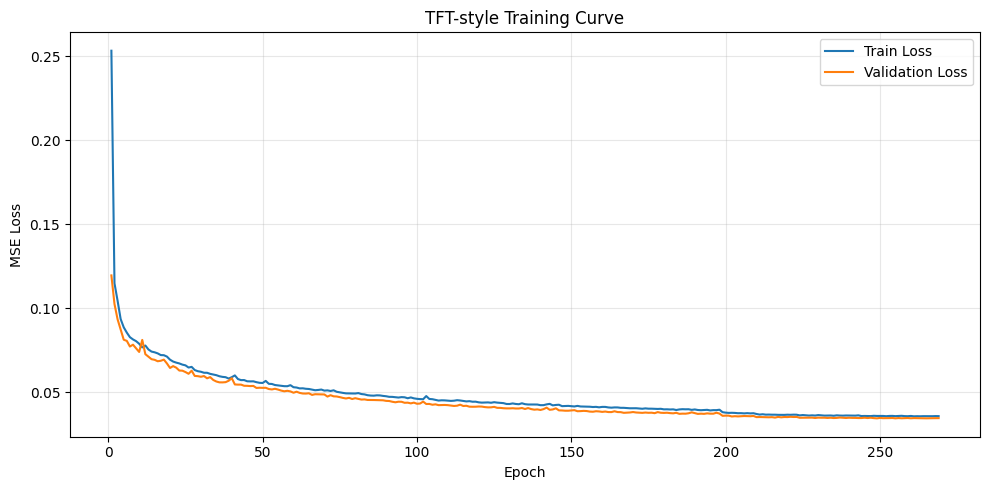

In [ ]:
# Load best model + training curve
checkpoint = torch.load(best_model_path, map_location=device, weights_only=False)
model.load_state_dict(checkpoint["model_state_dict"])
model.eval()
history_df = pd.DataFrame(history)
history_df.to_csv(os.path.join(REPORT_DIR, "tft_training_history.csv"),index=False)
plt.figure(figsize=(10, 5))
plt.plot(history_df["epoch"], history_df["train_loss"], label="Train Loss")
plt.plot(history_df["epoch"], history_df["val_loss"], label="Validation Loss")
plt.xlabel("Epoch")
plt.ylabel("MSE Loss")
plt.title("TFT-style Training Curve")
plt.legend()
plt.grid(alpha=0.3)
plt.tight_layout()
plt.savefig(os.path.join(FIG_DIR, "tft_training_curve.png"),dpi=300)
plt.show()

In [ ]:
# Forecast 100 steps for all cities
X_forecast = X_all_scaled[:, -INPUT_LEN:, :].astype(np.float32)
forecast_tensor = torch.tensor(X_forecast,
    dtype=torch.float32).to(device)
with torch.no_grad():
    Y_pred_scaled, variable_weights = model(forecast_tensor)
Y_pred_tft = Y_pred_scaled.cpu().numpy() * target_std + target_mean
variable_weights_np = variable_weights.cpu().numpy()
print("Y_pred_tft:", Y_pred_tft.shape)
print("Variable weights:", variable_weights_np.shape)

Y_pred_tft: (182, 100)
Variable weights: (182, 400, 9)


In [ ]:
# Metrics
def calculate_metrics(y_true, y_pred):
    y_true = np.asarray(y_true, dtype=float)
    y_pred = np.asarray(y_pred, dtype=float)
    mae = mean_absolute_error(y_true, y_pred)
    rmse = np.sqrt(mean_squared_error(y_true, y_pred))
    smape = np.mean(2 * np.abs(y_pred - y_true)
        / np.maximum(np.abs(y_true) + np.abs(y_pred), 1e-6)) * 100
    r2 = r2_score(y_true, y_pred)
    return {
        "MAE": mae,
        "RMSE": rmse,
        "SMAPE_%": smape,
        "R2": r2}

In [ ]:
# 100-step Evaluation
tft_100_overall = calculate_metrics(
    Y_test.flatten(),
    Y_pred_tft.flatten())
tft_100_overall_df = pd.DataFrame([{
    "model": "TFT_style",
    "horizon": "600_to_700",
    "forecast_steps": 100,
    **tft_100_overall}])
city_100_records = []
for city_idx in range(Y_test.shape[0]):
    country = city_order.loc[city_idx, "country"]
    city = city_order.loc[city_idx, "location_name"]
    metrics = calculate_metrics(
        Y_test[city_idx],
        Y_pred_tft[city_idx])
    city_100_records.append({
        "city_index": city_idx,
        "country": country,
        "location_name": city,
        **metrics})
tft_100_city_df = pd.DataFrame(city_100_records)
display(tft_100_overall_df)
display(tft_100_city_df.describe())

,model,horizon,forecast_steps,MAE,RMSE,SMAPE_%,R2
0,TFT_style,600_to_700,100,5.131756,7.696363,46.897765,0.50316


,city_index,MAE,RMSE,SMAPE_%,R2
count,182.000000,182.000000,182.000000,182.000000,182.000000
mean,90.500000,5.131756,5.963568,46.897765,-4.046481
std,52.683014,4.333566,4.878590,49.148238,8.384836
min,0.000000,0.436821,0.539893,1.749005,-66.197707
25%,45.250000,1.868280,2.318947,7.954419,-3.257571
50%,90.500000,3.427310,4.187113,24.740123,-1.439912
75%,135.750000,7.569106,8.548150,73.180830,-0.469230
max,181.000000,18.460754,21.090176,186.786140,0.499072


In [ ]:
# 20-step Evaluation
SHORT_HORIZON = 20
Y_true_20 = Y_test[:, :SHORT_HORIZON]
Y_pred_20 = Y_pred_tft[:, :SHORT_HORIZON]
tft_20_overall = calculate_metrics(
    Y_true_20.flatten(),
    Y_pred_20.flatten())
tft_20_overall_df = pd.DataFrame([{
    "model": "TFT_style",
    "horizon": "600_to_620",
    "forecast_steps": 20,
    **tft_20_overall}])
city_20_records = []
for city_idx in range(Y_true_20.shape[0]):
    country = city_order.loc[city_idx, "country"]
    city = city_order.loc[city_idx, "location_name"]
    metrics = calculate_metrics(
        Y_true_20[city_idx],
        Y_pred_20[city_idx])
    city_20_records.append({
        "city_index": city_idx,
        "country": country,
        "location_name": city,
        **metrics})
tft_20_city_df = pd.DataFrame(city_20_records)
display(tft_20_overall_df)
display(tft_20_city_df.describe())

,model,horizon,forecast_steps,MAE,RMSE,SMAPE_%,R2
0,TFT_style,600_to_620,20,4.620947,7.477156,52.041313,0.64013


,city_index,MAE,RMSE,SMAPE_%,R2
count,182.000000,182.000000,182.000000,182.000000,182.000000
mean,90.500000,4.620947,5.156087,52.041313,-4.363227
std,52.683014,5.294115,5.429976,66.793513,7.381069
min,0.000000,0.302738,0.383371,1.209190,-51.157101
25%,45.250000,1.494272,1.915894,6.553403,-5.094051
50%,90.500000,2.587114,2.987635,15.094155,-1.114076
75%,135.750000,5.067731,5.951647,75.277701,-0.347544
max,181.000000,30.526461,31.148480,200.000000,0.413775


In [ ]:
# Save numeric results
np.save(os.path.join(PRED_DIR, "Y_pred_tft_style.npy"),Y_pred_tft)
pd.DataFrame(Y_pred_tft).to_csv(os.path.join(PRED_DIR, "Y_pred_tft_style.csv"),index=False)
tft_100_overall_df.to_csv(os.path.join(REPORT_DIR, "tft_overall_100step_metrics.csv"),index=False)
tft_100_city_df.to_csv(os.path.join(REPORT_DIR, "tft_city_level_100step_metrics.csv"),index=False)
tft_20_overall_df.to_csv(os.path.join(REPORT_DIR, "tft_overall_20step_metrics.csv"),index=False)
tft_20_city_df.to_csv(os.path.join(REPORT_DIR, "tft_city_level_20step_metrics.csv"),index=False)
np.save(os.path.join(REPORT_DIR, "tft_variable_weights.npy"),variable_weights_np)
print("Saved TFT-style results to:")
print(TFT_OUTPUT_DIR)

Saved TFT-style results to:
/content/drive/MyDrive/Weather Trend Forecasting/prediction_outputs/model_outputs/TFT


,feature,mean_variable_weight
1,STL_trend_of_temperature,0.189113
4,Gaussian_30_temperature,0.147011
3,Gaussian_7_temperature,0.110849
2,STL_seasonal_of_temperature,0.101546
0,temperature_celsius,0.098121
6,pressure_mb,0.097852
5,humidity,0.091099
8,cloud,0.084333
7,uv_index,0.080072


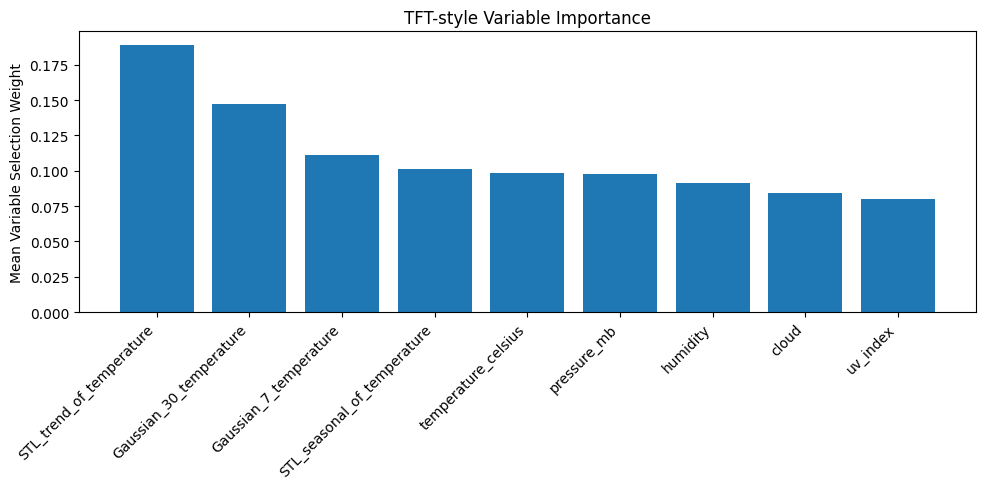

In [ ]:
# Variable Importance
mean_variable_weights = variable_weights_np.mean(axis=(0, 1))
var_importance_df = pd.DataFrame({
    "feature": feature_names,
    "mean_variable_weight": mean_variable_weights}).sort_values(
    "mean_variable_weight",
    ascending=False)
display(var_importance_df)
var_importance_df.to_csv(
    os.path.join(REPORT_DIR, "tft_variable_importance.csv"),
    index=False)
plt.figure(figsize=(10, 5))
plt.bar(
    var_importance_df["feature"],
    var_importance_df["mean_variable_weight"])
plt.xticks(rotation=45, ha="right")
plt.ylabel("Mean Variable Selection Weight")
plt.title("TFT-style Variable Importance")
plt.tight_layout()
plt.savefig(
    os.path.join(FIG_DIR, "tft_variable_importance.png"),
    dpi=300)
plt.show()

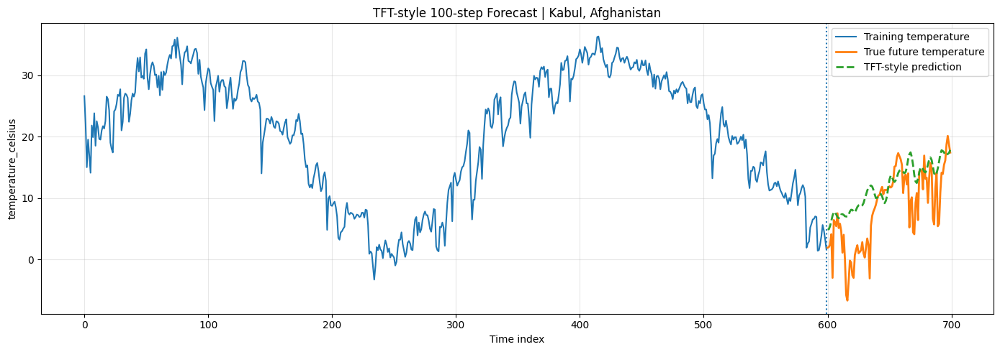

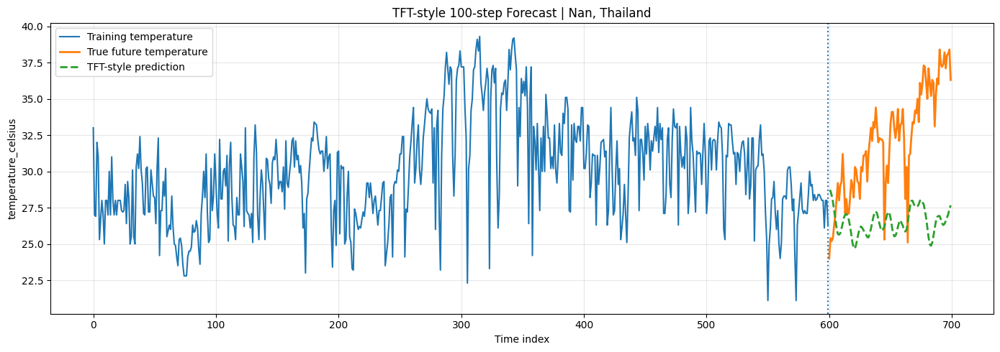

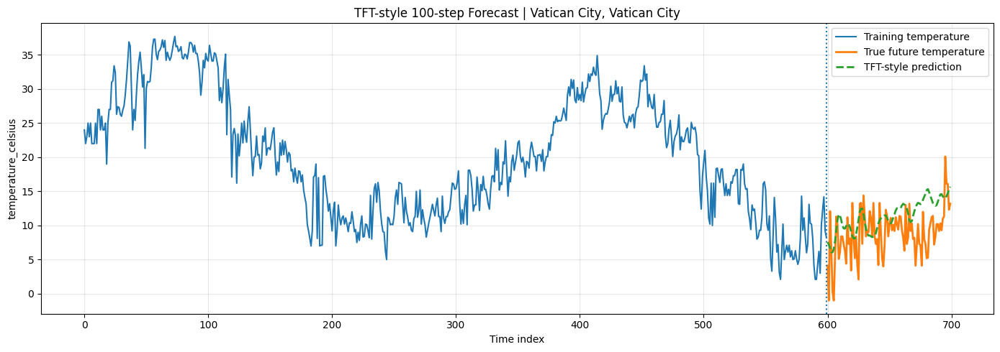

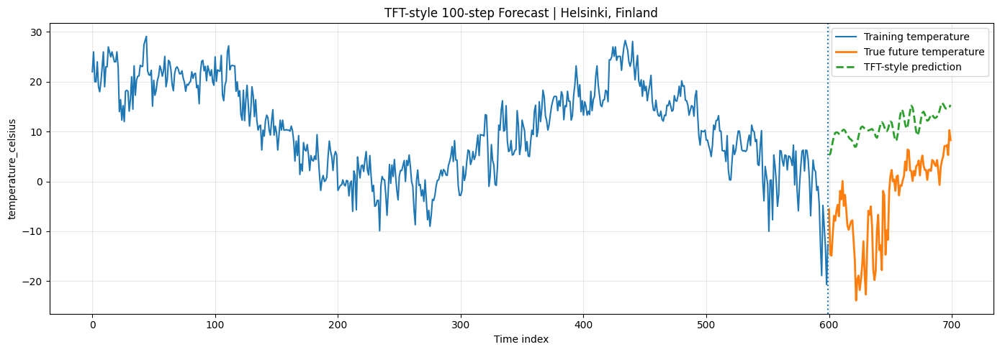

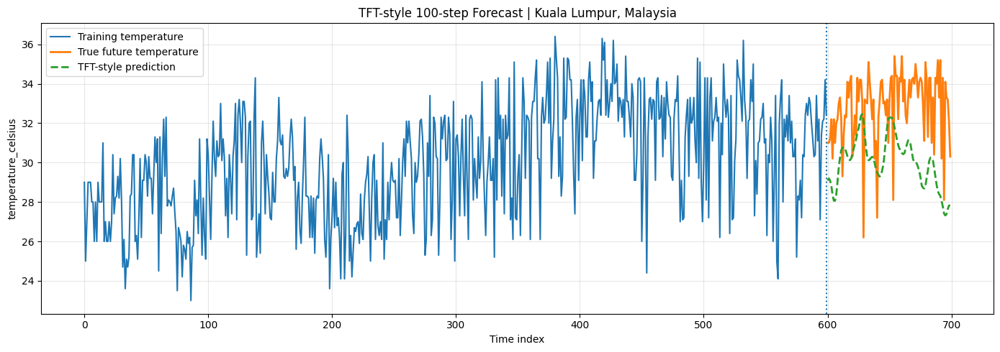

...

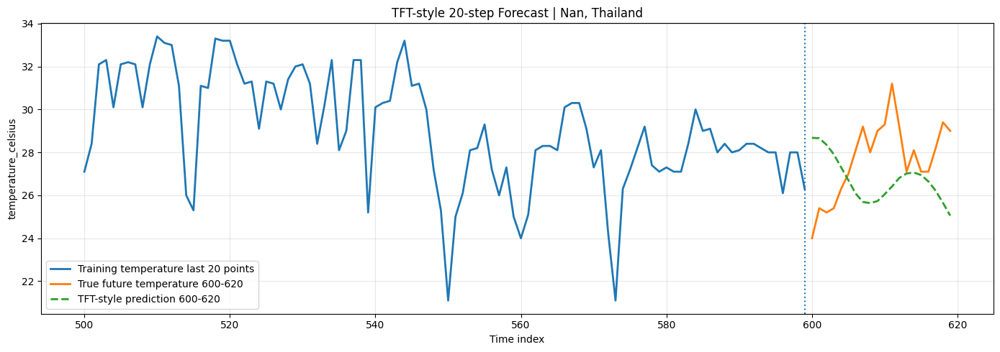

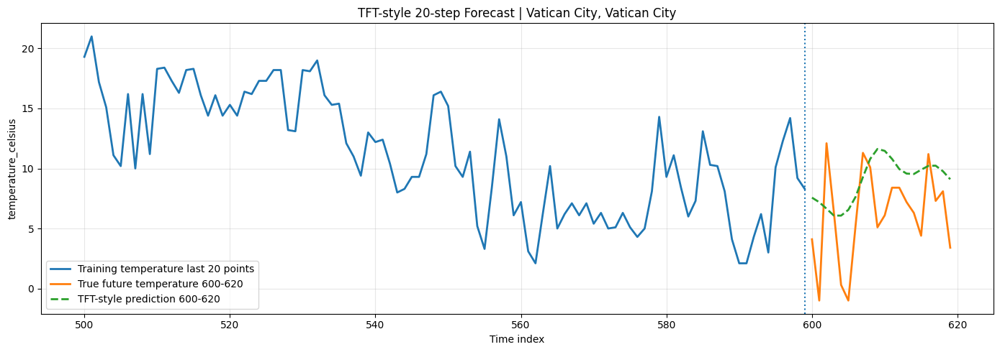

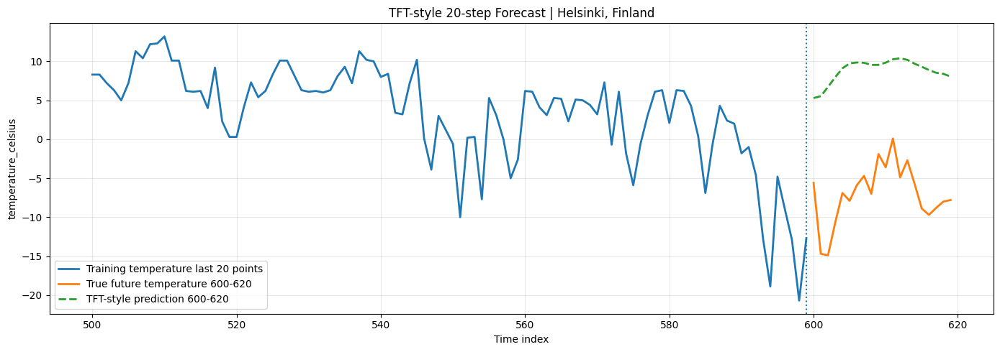

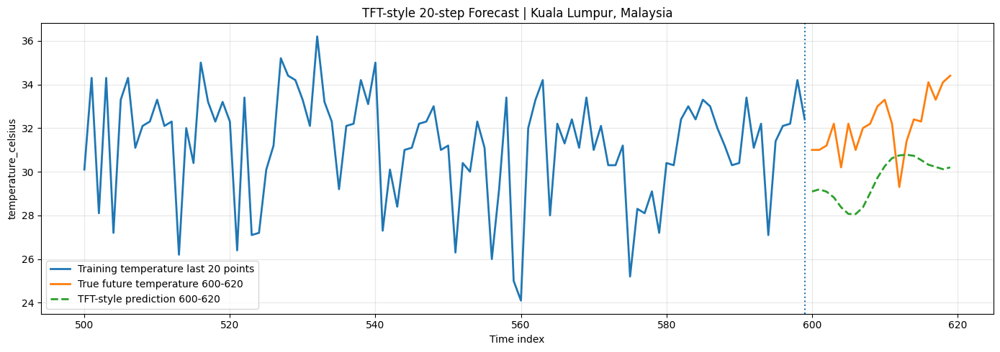

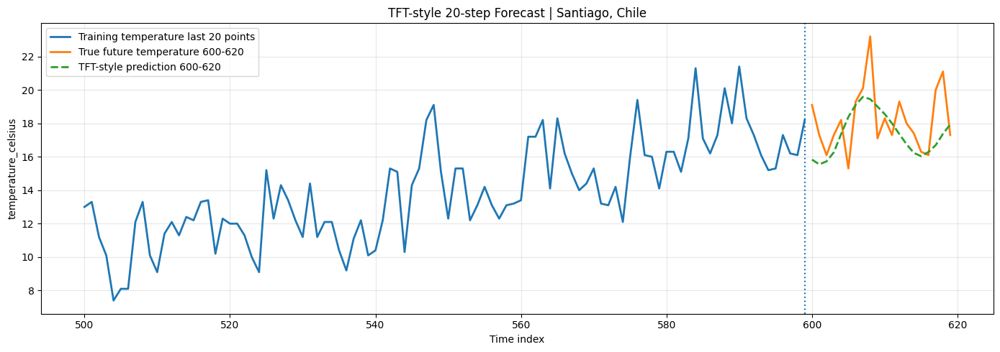

Saved TFT-style figures to:
/content/drive/MyDrive/Weather Trend Forecasting/prediction_outputs/model_outputs/TFT/figures


In [ ]:
# Visualization: 100-step and 20-step
sample_indices = [0, 1, 2, 50, 99, 150]
FIG_100_DIR = os.path.join(FIG_DIR, "100step")
FIG_20_DIR = os.path.join(FIG_DIR, "20step")
os.makedirs(FIG_100_DIR, exist_ok=True)
os.makedirs(FIG_20_DIR, exist_ok=True)
for idx in sample_indices:
    if idx >= len(city_order):
        continue
    country = city_order.loc[idx, "country"]
    city = city_order.loc[idx, "location_name"]
    plt.figure(figsize=(14, 5))
    plt.plot(np.arange(600), X_main_train[idx], label="Training temperature", linewidth=1.5)
    plt.plot(np.arange(600, 700), Y_test[idx], label="True future temperature", linewidth=2)
    plt.plot(np.arange(600, 700), Y_pred_tft[idx], label="TFT-style prediction", linewidth=2, linestyle="--")
    plt.axvline(599, linestyle=":", linewidth=1.5)
    plt.title(f"TFT-style 100-step Forecast | {city}, {country}")
    plt.xlabel("Time index")
    plt.ylabel("temperature_celsius")
    plt.legend()
    plt.grid(alpha=0.3)
    plt.tight_layout()
    fig_name = f"TFT_100step_city_{idx}_{str(city).replace(' ', '_')}.png"
    plt.savefig(os.path.join(FIG_100_DIR, fig_name), dpi=300)
    plt.show()
    plt.close()

for idx in sample_indices:
    if idx >= len(city_order):
        continue
    country = city_order.loc[idx, "country"]
    city = city_order.loc[idx, "location_name"]
    plt.figure(figsize=(14, 5))
    plt.plot(np.arange(500, 600), X_main_train[idx, 500:600], label="Training temperature last 20 points", linewidth=2)
    plt.plot(np.arange(600, 620), Y_test[idx, :20], label="True future temperature 600-620", linewidth=2)
    plt.plot(np.arange(600, 620), Y_pred_tft[idx, :20], label="TFT-style prediction 600-620", linewidth=2, linestyle="--")
    plt.axvline(599, linestyle=":", linewidth=1.5)
    plt.title(f"TFT-style 20-step Forecast | {city}, {country}")
    plt.xlabel("Time index")
    plt.ylabel("temperature_celsius")
    plt.legend()
    plt.grid(alpha=0.3)
    plt.tight_layout()
    fig_name = f"TFT_20step_city_{idx}_{str(city).replace(' ', '_')}.png"
    plt.savefig(os.path.join(FIG_20_DIR, fig_name), dpi=300)
    plt.show()
    plt.close()

print("Saved TFT-style figures to:")
print(FIG_DIR)

**TFT_v2**

In [ ]:
# TFT-style Model with Known Future Time Features
# Input:
#   historical observed: temperature + 8 aux
#   known future: month_sin, month_cos, dayofyear_sin, dayofyear_cos
# Output:
#   temperature forecast 100 steps

import os
import random
import warnings
warnings.filterwarnings("ignore")

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.model_selection import train_test_split

import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader

SEED = 42
random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)
torch.cuda.manual_seed_all(SEED)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", device)

Using device: cuda


In [ ]:
# Paths: auto locate saved datasets

BASE_DIR = "/content/drive/MyDrive/Weather Trend Forecasting"

MAIN_DIR = None
AUX_DIR = None
FULL_DATA_FILE = None

for root, dirs, files in os.walk(BASE_DIR):
    if "temperature_train_input.npy" in files:
        MAIN_DIR = root
    if "X_auxiliary_8features.npy" in files:
        AUX_DIR = root
    if "GlobalWeatherRepository_missing_outlier_cleaned.csv" in files:
        FULL_DATA_FILE = os.path.join(root, "GlobalWeatherRepository_missing_outlier_cleaned.csv")

print("MAIN_DIR:", MAIN_DIR)
print("AUX_DIR:", AUX_DIR)
print("FULL_DATA_FILE:", FULL_DATA_FILE)

if MAIN_DIR is None:
    raise FileNotFoundError("temperature_train_input.npy not found.")
if AUX_DIR is None:
    raise FileNotFoundError("X_auxiliary_8features.npy not found.")
if FULL_DATA_FILE is None:
    raise FileNotFoundError("GlobalWeatherRepository_missing_outlier_cleaned.csv not found.")

TFT_OUTPUT_DIR = os.path.join(
    BASE_DIR,
    "prediction_outputs",
    "model_outputs",
    "TFT_known_future_time"
)

FIG_DIR = os.path.join(TFT_OUTPUT_DIR, "figures")
REPORT_DIR = os.path.join(TFT_OUTPUT_DIR, "reports")
PRED_DIR = os.path.join(TFT_OUTPUT_DIR, "predictions")
MODEL_DIR = os.path.join(TFT_OUTPUT_DIR, "saved_model")

for p in [TFT_OUTPUT_DIR, FIG_DIR, REPORT_DIR, PRED_DIR, MODEL_DIR]:
    os.makedirs(p, exist_ok=True)

MAIN_DIR: /content/drive/MyDrive/Weather Trend Forecasting/prediction_outputs/temperature_main_dataset
AUX_DIR: /content/drive/MyDrive/Weather Trend Forecasting/prediction_outputs/temperature_auxiliary_dataset
FULL_DATA_FILE: /content/drive/MyDrive/Weather Trend Forecasting/processed_outputs/outlier_processed_outputs/GlobalWeatherRepository_missing_outlier_cleaned.csv


In [ ]:
# Load prepared data

X_main_train = np.load(os.path.join(MAIN_DIR, "temperature_train_input.npy"))
Y_test = np.load(os.path.join(MAIN_DIR, "temperature_test_target.npy"))
X_aux = np.load(os.path.join(AUX_DIR, "X_auxiliary_8features.npy"))
city_order = pd.read_csv(os.path.join(MAIN_DIR, "city_order.csv"))
aux_feature_names = pd.read_csv(
    os.path.join(AUX_DIR, "auxiliary_feature_names.csv")
)["feature_name"].tolist()
observed_feature_names = ["temperature_celsius"] + aux_feature_names
X_observed = np.concatenate(
    [
        X_main_train[:, :, None],
        X_aux
    ],
    axis=2
)

print("X_observed:", X_observed.shape)
print("Y_test:", Y_test.shape)
print("Observed features:", observed_feature_names)
assert X_observed.shape == (182, 600, 9)
assert Y_test.shape == (182, 100)

X_observed: (182, 600, 9)
Y_test: (182, 100)
Observed features: ['temperature_celsius', 'STL_trend_of_temperature', 'STL_seasonal_of_temperature', 'Gaussian_7_temperature', 'Gaussian_30_temperature', 'humidity', 'pressure_mb', 'uv_index', 'cloud']


In [ ]:
# Build known time features for first 700 timestamps
# Need:
#   past 0:600 for training encoder
#   future 600:700 for TFT decoder

df_full = pd.read_csv(FULL_DATA_FILE)
df_full["last_updated"] = pd.to_datetime(df_full["last_updated"], errors="coerce")

df_full = df_full.dropna(
    subset=["country", "location_name", "last_updated"]
)

df_full = df_full.sort_values(
    ["location_name", "last_updated"]
).reset_index(drop=True)


def make_time_features(timestamps):
    ts = pd.to_datetime(pd.Series(timestamps))

    month = ts.dt.month.values
    dayofyear = ts.dt.dayofyear.values

    month_sin = np.sin(2 * np.pi * month / 12)
    month_cos = np.cos(2 * np.pi * month / 12)

    dayofyear_sin = np.sin(2 * np.pi * dayofyear / 365.25)
    dayofyear_cos = np.cos(2 * np.pi * dayofyear / 365.25)

    return np.stack(
        [
            month_sin,
            month_cos,
            dayofyear_sin,
            dayofyear_cos
        ],
        axis=1
    )

known_time_features = []
timestamp_records = []

for idx, row in city_order.iterrows():
    country = row["country"]
    city = row["location_name"]
    city_df = (
        df_full[
            (df_full["country"] == country)
            &
            (df_full["location_name"] == city)
        ]
        .sort_values("last_updated")
        .reset_index(drop=True)
    )

    if len(city_df) < 700:
        raise ValueError(f"{city}, {country} has fewer than 700 records.")
    timestamps_700 = city_df["last_updated"].iloc[:700].values
    tf = make_time_features(timestamps_700)
    known_time_features.append(tf)
    timestamp_records.append({
        "city_index": idx,
        "country": country,
        "location_name": city,
        "start_time": timestamps_700[0],
        "train_end_time": timestamps_700[599],
        "test_start_time": timestamps_700[600],
        "end_time": timestamps_700[699]
    })

known_time_features = np.array(known_time_features, dtype=np.float32)
timestamp_df = pd.DataFrame(timestamp_records)
print("known_time_features:", known_time_features.shape)
display(timestamp_df.head())
assert known_time_features.shape == (182, 700, 4)
timestamp_df.to_csv(
    os.path.join(REPORT_DIR, "tft_city_timestamp_ranges.csv"),
    index=False
)

known_time_features: (182, 700, 4)


,city_index,country,location_name,start_time,train_end_time,test_start_time,end_time
0,0,Afghanistan,Kabul,2024-05-16 13:15:00,2026-01-06 11:45:00,2026-01-07 11:45:00,2026-04-17 11:00:00
1,1,Thailand,Nan,2024-05-16 15:45:00,2026-01-07 14:15:00,2026-01-08 14:15:00,2026-04-17 13:30:00
2,2,Vatican City,Vatican City,2024-05-16 10:45:00,2026-01-06 08:15:00,2026-01-07 08:15:00,2026-04-17 08:30:00
3,3,Japan,Tokyo,2024-05-16 17:45:00,2026-01-06 16:15:00,2026-01-07 16:15:00,2026-04-17 15:30:00
4,4,Jordan,Amman,2024-05-16 11:45:00,2026-01-06 10:15:00,2026-01-07 10:15:00,2026-04-17 09:30:00


In [ ]:
# Standardization
# Observed variables are standardized.
# Time sin/cos features are already bounded, but still kept as float.

obs_mean = X_observed.reshape(-1, X_observed.shape[-1]).mean(axis=0)
obs_std = X_observed.reshape(-1, X_observed.shape[-1]).std(axis=0)
obs_std[obs_std < 1e-8] = 1.0
X_observed_scaled = (X_observed - obs_mean) / obs_std
target_mean = obs_mean[0]
target_std = obs_std[0]
known_time_mean = known_time_features[:, :600, :].reshape(-1, 4).mean(axis=0)
known_time_std = known_time_features[:, :600, :].reshape(-1, 4).std(axis=0)
known_time_std[known_time_std < 1e-8] = 1.0
known_time_scaled = (known_time_features - known_time_mean) / known_time_std
print("target_mean:", target_mean)
print("target_std:", target_std)

target_mean: 22.0373717948754
target_std: 9.223535762223879


In [ ]:
# Hyperparameters

INPUT_LEN = 400
OUTPUT_LEN = 100
TRAIN_STRIDE = 1

BATCH_SIZE = 128
EPOCHS = 300
PATIENCE = 25

D_MODEL = 128
N_HEADS = 4
ENCODER_LAYERS = 2
DECODER_LAYERS = 2
DROPOUT = 0.15

LEARNING_RATE = 8e-4
WEIGHT_DECAY = 1e-4

print("INPUT_LEN:", INPUT_LEN)
print("OUTPUT_LEN:", OUTPUT_LEN)
print("TRAIN_STRIDE:", TRAIN_STRIDE)

INPUT_LEN: 400
OUTPUT_LEN: 100
TRAIN_STRIDE: 1


In [ ]:
# Build sliding-window samples
#
# encoder input:
#   observed features + past known time features
#
# decoder input:
#   future known time features only
#
# target:
#   future temperature

X_encoder_samples = []
X_decoder_known_samples = []
Y_samples = []
sample_city_indices = []

n_cities = X_observed_scaled.shape[0]
seq_len = 600

max_start = seq_len - INPUT_LEN - OUTPUT_LEN + 1

for city_idx in range(n_cities):
    for start in range(0, max_start, TRAIN_STRIDE):
        enc_start = start
        enc_end = start + INPUT_LEN
        dec_end = enc_end + OUTPUT_LEN

        obs_enc = X_observed_scaled[
            city_idx,
            enc_start:enc_end,
            :
        ]

        time_enc = known_time_scaled[
            city_idx,
            enc_start:enc_end,
            :
        ]

        encoder_x = np.concatenate(
            [
                obs_enc,
                time_enc
            ],
            axis=1
        )

        decoder_known = known_time_scaled[
            city_idx,
            enc_end:dec_end,
            :
        ]

        target_y = X_observed_scaled[
            city_idx,
            enc_end:dec_end,
            0
        ]

        X_encoder_samples.append(encoder_x)
        X_decoder_known_samples.append(decoder_known)
        Y_samples.append(target_y)
        sample_city_indices.append(city_idx)

X_encoder_samples = np.array(X_encoder_samples, dtype=np.float32)
X_decoder_known_samples = np.array(X_decoder_known_samples, dtype=np.float32)
Y_samples = np.array(Y_samples, dtype=np.float32)
sample_city_indices = np.array(sample_city_indices, dtype=np.int64)

print("Encoder samples:", X_encoder_samples.shape)
print("Decoder known samples:", X_decoder_known_samples.shape)
print("Y samples:", Y_samples.shape)
print("City idx samples:", sample_city_indices.shape)

Encoder samples: (18382, 400, 13)
Decoder known samples: (18382, 100, 4)
Y samples: (18382, 100)
City idx samples: (18382,)


In [ ]:
# Train

train_idx, val_idx = train_test_split(
    np.arange(len(Y_samples)),
    test_size=0.15,
    random_state=SEED,
    shuffle=True
)

X_enc_train = X_encoder_samples[train_idx]
X_dec_train = X_decoder_known_samples[train_idx]
Y_train = Y_samples[train_idx]
city_train = sample_city_indices[train_idx]

X_enc_val = X_encoder_samples[val_idx]
X_dec_val = X_decoder_known_samples[val_idx]
Y_val = Y_samples[val_idx]
city_val = sample_city_indices[val_idx]

print("Train encoder:", X_enc_train.shape)
print("Train decoder:", X_dec_train.shape)
print("Train Y:", Y_train.shape)

print("Val encoder:", X_enc_val.shape)
print("Val decoder:", X_dec_val.shape)
print("Val Y:", Y_val.shape)

Train encoder: (15624, 400, 13)
Train decoder: (15624, 100, 4)
Train Y: (15624, 100)
Val encoder: (2758, 400, 13)
Val decoder: (2758, 100, 4)
Val Y: (2758, 100)


In [ ]:
# Dataset

class TFTKnownFutureDataset(Dataset):
    def __init__(self, x_enc, x_dec, y, city_idx):
        self.x_enc = torch.tensor(x_enc, dtype=torch.float32)
        self.x_dec = torch.tensor(x_dec, dtype=torch.float32)
        self.y = torch.tensor(y, dtype=torch.float32)
        self.city_idx = torch.tensor(city_idx, dtype=torch.long)

    def __len__(self):
        return len(self.y)

    def __getitem__(self, idx):
        return (
            self.x_enc[idx],
            self.x_dec[idx],
            self.y[idx],
            self.city_idx[idx]
        )


train_loader = DataLoader(
    TFTKnownFutureDataset(
        X_enc_train,
        X_dec_train,
        Y_train,
        city_train
    ),
    batch_size=BATCH_SIZE,
    shuffle=True,
    drop_last=False)

val_loader = DataLoader(
    TFTKnownFutureDataset(
        X_enc_val,
        X_dec_val,
        Y_val,
        city_val
    ),
    batch_size=BATCH_SIZE,
    shuffle=False,
    drop_last=False)

In [ ]:
# TFT-style model with known future decoder

class VariableSelectionNetwork(nn.Module):
    def __init__(self, input_size, d_model):
        super().__init__()

        self.feature_proj = nn.ModuleList([
            nn.Linear(1, d_model)
            for _ in range(input_size)
        ])

        self.weight_net = nn.Sequential(
            nn.Linear(input_size, d_model),
            nn.ReLU(),
            nn.Linear(d_model, input_size),
            nn.Softmax(dim=-1)
        )

    def forward(self, x):
        weights = self.weight_net(x)

        projected = []

        for i, proj in enumerate(self.feature_proj):
            projected.append(
                proj(x[:, :, i:i+1])
            )

        projected = torch.stack(projected, dim=2)

        out = (
            projected *
            weights.unsqueeze(-1)
        ).sum(dim=2)

        return out, weights


class TFTKnownFutureForecaster(nn.Module):
    def __init__(
        self,
        encoder_input_size,
        decoder_known_size,
        num_cities,
        d_model=128,
        n_heads=4,
        encoder_layers=2,
        decoder_layers=2,
        dropout=0.15,
        output_len=100
    ):
        super().__init__()

        self.output_len = output_len

        self.city_embedding = nn.Embedding(
            num_embeddings=num_cities,
            embedding_dim=d_model
        )

        self.encoder_vsn = VariableSelectionNetwork(
            input_size=encoder_input_size,
            d_model=d_model
        )

        self.encoder_lstm = nn.LSTM(
            input_size=d_model,
            hidden_size=d_model,
            num_layers=1,
            batch_first=True
        )

        encoder_layer = nn.TransformerEncoderLayer(
            d_model=d_model,
            nhead=n_heads,
            dim_feedforward=d_model * 4,
            dropout=dropout,
            batch_first=True,
            activation="gelu"
        )

        self.encoder_transformer = nn.TransformerEncoder(
            encoder_layer,
            num_layers=encoder_layers
        )

        self.decoder_known_proj = nn.Linear(
            decoder_known_size,
            d_model
        )

        self.decoder_pos_embedding = nn.Parameter(
            torch.randn(1, output_len, d_model) * 0.02
        )

        decoder_layer = nn.TransformerEncoderLayer(
            d_model=d_model,
            nhead=n_heads,
            dim_feedforward=d_model * 4,
            dropout=dropout,
            batch_first=True,
            activation="gelu"
        )

        self.decoder_transformer = nn.TransformerEncoder(
            decoder_layer,
            num_layers=decoder_layers
        )

        self.context_gate = nn.Sequential(
            nn.Linear(d_model, d_model),
            nn.Sigmoid()
        )

        self.norm = nn.LayerNorm(d_model)

        self.output_layer = nn.Sequential(
            nn.Linear(d_model, d_model),
            nn.GELU(),
            nn.Dropout(dropout),
            nn.Linear(d_model, 1)
        )

    def forward(self, x_encoder, x_decoder_known, city_idx):
        enc, weights = self.encoder_vsn(x_encoder)

        enc_lstm, _ = self.encoder_lstm(enc)

        enc_out = self.encoder_transformer(enc_lstm)

        context = enc_out[:, -1, :]

        city_context = self.city_embedding(city_idx)

        context = context + city_context

        gate = self.context_gate(context)

        context = self.norm(context * gate)

        dec = self.decoder_known_proj(x_decoder_known)

        dec = (
            dec
            + context.unsqueeze(1)
            + self.decoder_pos_embedding[:, :x_decoder_known.size(1), :]
        )

        dec_out = self.decoder_transformer(dec)

        y_hat = self.output_layer(dec_out).squeeze(-1)

        return y_hat, weights


encoder_input_size = 9 + 4
decoder_known_size = 4

model = TFTKnownFutureForecaster(
    encoder_input_size=encoder_input_size,
    decoder_known_size=decoder_known_size,
    num_cities=182,
    d_model=D_MODEL,
    n_heads=N_HEADS,
    encoder_layers=ENCODER_LAYERS,
    decoder_layers=DECODER_LAYERS,
    dropout=DROPOUT,
    output_len=OUTPUT_LEN
).to(device)

criterion = nn.SmoothL1Loss(beta=0.5)

optimizer = torch.optim.AdamW(
    model.parameters(),
    lr=LEARNING_RATE,
    weight_decay=WEIGHT_DECAY
)

scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
    optimizer,
    mode="min",
    factor=0.5,
    patience=7
)

print(model)

TFTKnownFutureForecaster(
  (city_embedding): Embedding(182, 128)
  (encoder_vsn): VariableSelectionNetwork(
    (feature_proj): ModuleList(
      (0-12): 13 x Linear(in_features=1, out_features=128, bias=True)
    )
    (weight_net): Sequential(
      (0): Linear(in_features=13, out_features=128, bias=True)
      (1): ReLU()
      (2): Linear(in_features=128, out_features=13, bias=True)
      (3): Softmax(dim=-1)
    )
  )
  (encoder_lstm): LSTM(128, 128, batch_first=True)
  (encoder_transformer): TransformerEncoder(
    (layers): ModuleList(
      (0-1): 2 x TransformerEncoderLayer(
        (self_attn): MultiheadAttention(
          (out_proj): NonDynamicallyQuantizableLinear(in_features=128, out_features=128, bias=True)
        )
        (linear1): Linear(in_features=128, out_features=512, bias=True)
        (dropout): Dropout(p=0.15, inplace=False)
        (linear2): Linear(in_features=512, out_features=128, bias=True)
        (norm1): LayerNorm((128,), eps=1e-05, elementwise_affin

In [ ]:
# Training loop

best_val_loss = np.inf
best_epoch = -1
patience_counter = 0

history = []

best_model_path = os.path.join(
    MODEL_DIR,
    "best_tft_known_future_model.pt"
)

for epoch in range(1, EPOCHS + 1):

    model.train()
    train_losses = []

    for x_enc, x_dec, yb, city_idx_batch in train_loader:
        x_enc = x_enc.to(device)
        x_dec = x_dec.to(device)
        yb = yb.to(device)
        city_idx_batch = city_idx_batch.to(device)

        optimizer.zero_grad()

        pred, _ = model(
            x_enc,
            x_dec,
            city_idx_batch
        )

        loss = criterion(pred, yb)

        loss.backward()

        torch.nn.utils.clip_grad_norm_(
            model.parameters(),
            max_norm=1.0
        )

        optimizer.step()

        train_losses.append(loss.item())

    train_loss = float(np.mean(train_losses))

    model.eval()
    val_losses = []

    with torch.no_grad():
        for x_enc, x_dec, yb, city_idx_batch in val_loader:
            x_enc = x_enc.to(device)
            x_dec = x_dec.to(device)
            yb = yb.to(device)
            city_idx_batch = city_idx_batch.to(device)

            pred, _ = model(
                x_enc,
                x_dec,
                city_idx_batch
            )

            loss = criterion(pred, yb)

            val_losses.append(loss.item())

    val_loss = float(np.mean(val_losses))

    scheduler.step(val_loss)

    history.append({
        "epoch": epoch,
        "train_loss": train_loss,
        "val_loss": val_loss,
        "lr": optimizer.param_groups[0]["lr"]
    })

    print(
        f"Epoch {epoch:03d} | "
        f"Train Loss: {train_loss:.5f} | "
        f"Val Loss: {val_loss:.5f} | "
        f"LR: {optimizer.param_groups[0]['lr']:.6f}"
    )

    if val_loss < best_val_loss:
        best_val_loss = val_loss
        best_epoch = epoch
        patience_counter = 0

        torch.save(
            {
                "model_state_dict": model.state_dict(),
                "obs_mean": obs_mean,
                "obs_std": obs_std,
                "known_time_mean": known_time_mean,
                "known_time_std": known_time_std,
                "target_mean": target_mean,
                "target_std": target_std,
                "observed_feature_names": observed_feature_names,
                "known_future_feature_names": [
                    "month_sin",
                    "month_cos",
                    "dayofyear_sin",
                    "dayofyear_cos"
                ],
                "config": {
                    "INPUT_LEN": INPUT_LEN,
                    "OUTPUT_LEN": OUTPUT_LEN,
                    "D_MODEL": D_MODEL,
                    "N_HEADS": N_HEADS,
                    "ENCODER_LAYERS": ENCODER_LAYERS,
                    "DECODER_LAYERS": DECODER_LAYERS,
                    "DROPOUT": DROPOUT
                }
            },
            best_model_path
        )

    else:
        patience_counter += 1

    if patience_counter >= PATIENCE:
        print("Early stopping triggered.")
        break

print("Best epoch:", best_epoch)
print("Best val loss:", best_val_loss)

Epoch 001 | Train Loss: 0.11472 | Val Loss: 0.07376 | LR: 0.000800
Epoch 002 | Train Loss: 0.07530 | Val Loss: 0.07255 | LR: 0.000800
Epoch 003 | Train Loss: 0.07093 | Val Loss: 0.06464 | LR: 0.000800
Epoch 004 | Train Loss: 0.06568 | Val Loss: 0.06402 | LR: 0.000800
Epoch 005 | Train Loss: 0.06280 | Val Loss: 0.05992 | LR: 0.000800
Epoch 006 | Train Loss: 0.06188 | Val Loss: 0.05662 | LR: 0.000800
Epoch 007 | Train Loss: 0.05971 | Val Loss: 0.05584 | LR: 0.000800
Epoch 008 | Train Loss: 0.05816 | Val Loss: 0.05486 | LR: 0.000800
Epoch 009 | Train Loss: 0.05653 | Val Loss: 0.05281 | LR: 0.000800
Epoch 010 | Train Loss: 0.05490 | Val Loss: 0.05086 | LR: 0.000800
Epoch 011 | Train Loss: 0.05360 | Val Loss: 0.04962 | LR: 0.000800
Epoch 012 | Train Loss: 0.05257 | Val Loss: 0.04873 | LR: 0.000800
Epoch 013 | Train Loss: 0.05133 | Val Loss: 0.05224 | LR: 0.000800
Epoch 014 | Train Loss: 0.05095 | Val Loss: 0.04613 | LR: 0.000800
Epoch 015 | Train Loss: 0.04938 | Val Loss: 0.04755 | LR: 0.00

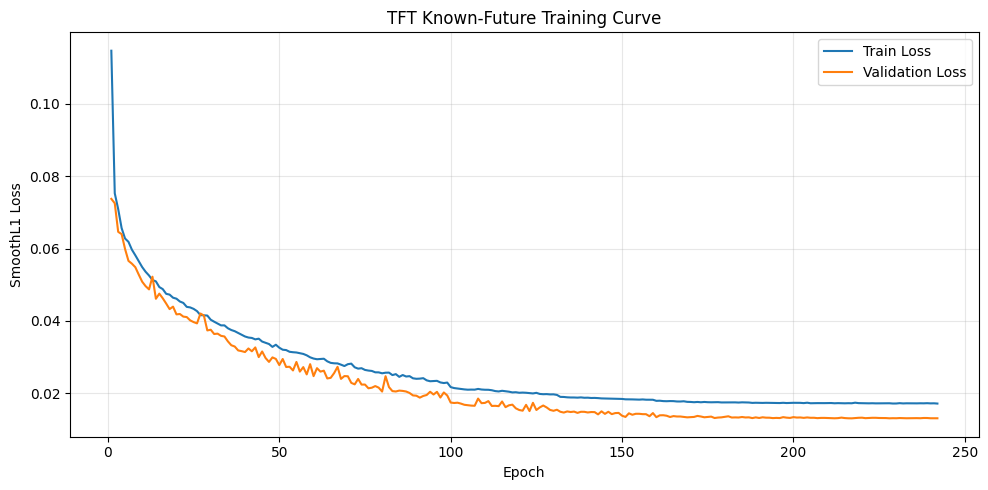

In [ ]:
# Load best model and plot training curve

checkpoint = torch.load(
    best_model_path,
    map_location=device,
    weights_only=False
)

model.load_state_dict(
    checkpoint["model_state_dict"]
)

model.eval()

history_df = pd.DataFrame(history)

history_df.to_csv(
    os.path.join(REPORT_DIR, "tft_known_future_training_history.csv"),
    index=False
)

plt.figure(figsize=(10, 5))
plt.plot(history_df["epoch"], history_df["train_loss"], label="Train Loss")
plt.plot(history_df["epoch"], history_df["val_loss"], label="Validation Loss")
plt.xlabel("Epoch")
plt.ylabel("SmoothL1 Loss")
plt.title("TFT Known-Future Training Curve")
plt.legend()
plt.grid(alpha=0.3)
plt.tight_layout()
plt.savefig(
    os.path.join(FIG_DIR, "tft_known_future_training_curve.png"),
    dpi=300
)
plt.show()

In [ ]:
# Final forecast: use 600-history to predict 600:700
# Encoder:
#   observed 600-INPUT_LEN : 600
#   known time 600-INPUT_LEN : 600
#
# Decoder known:
#   known time 600 : 700

final_encoder_list = []
final_decoder_known_list = []

for city_idx in range(182):
    obs_enc = X_observed_scaled[
        city_idx,
        600 - INPUT_LEN:600,
        :
    ]

    time_enc = known_time_scaled[
        city_idx,
        600 - INPUT_LEN:600,
        :
    ]

    encoder_x = np.concatenate(
        [
            obs_enc,
            time_enc
        ],
        axis=1
    )

    decoder_known = known_time_scaled[
        city_idx,
        600:700,
        :
    ]

    final_encoder_list.append(encoder_x)
    final_decoder_known_list.append(decoder_known)

X_final_encoder = np.array(final_encoder_list, dtype=np.float32)
X_final_decoder_known = np.array(final_decoder_known_list, dtype=np.float32)
final_city_idx = np.arange(182, dtype=np.int64)

print("X_final_encoder:", X_final_encoder.shape)
print("X_final_decoder_known:", X_final_decoder_known.shape)

with torch.no_grad():
    x_enc_tensor = torch.tensor(X_final_encoder, dtype=torch.float32).to(device)
    x_dec_tensor = torch.tensor(X_final_decoder_known, dtype=torch.float32).to(device)
    city_tensor = torch.tensor(final_city_idx, dtype=torch.long).to(device)

    Y_pred_scaled, variable_weights = model(
        x_enc_tensor,
        x_dec_tensor,
        city_tensor
    )

Y_pred_tft = Y_pred_scaled.cpu().numpy() * target_std + target_mean
variable_weights_np = variable_weights.cpu().numpy()
print("Y_pred_tft:", Y_pred_tft.shape)
print("variable_weights:", variable_weights_np.shape)

X_final_encoder: (182, 400, 13)
X_final_decoder_known: (182, 100, 4)
Y_pred_tft: (182, 100)
variable_weights: (182, 400, 13)


In [ ]:
# Metrics

def calculate_metrics(y_true, y_pred):
    y_true = np.asarray(y_true, dtype=float)
    y_pred = np.asarray(y_pred, dtype=float)

    mae = mean_absolute_error(y_true, y_pred)

    rmse = np.sqrt(
        mean_squared_error(y_true, y_pred)
    )

    smape = np.mean(
        2 * np.abs(y_pred - y_true)
        / np.maximum(np.abs(y_true) + np.abs(y_pred), 1e-6)
    ) * 100

    r2 = r2_score(y_true, y_pred)

    return {
        "MAE": mae,
        "RMSE": rmse,
        "SMAPE_%": smape,
        "R2": r2
    }

In [ ]:
# 100-step evaluation

tft_100_overall = calculate_metrics(
    Y_test.flatten(),
    Y_pred_tft.flatten()
)

tft_100_overall_df = pd.DataFrame([{
    "model": "TFT_known_future_time",
    "horizon": "600_to_700",
    "forecast_steps": 100,
    **tft_100_overall
}])

city_100_records = []

for city_idx in range(182):
    country = city_order.loc[city_idx, "country"]
    city = city_order.loc[city_idx, "location_name"]

    metrics = calculate_metrics(
        Y_test[city_idx],
        Y_pred_tft[city_idx]
    )

    city_100_records.append({
        "city_index": city_idx,
        "country": country,
        "location_name": city,
        **metrics
    })

tft_100_city_df = pd.DataFrame(city_100_records)

display(tft_100_overall_df)
display(tft_100_city_df.describe())

,model,horizon,forecast_steps,MAE,RMSE,SMAPE_%,R2
0,TFT_known_future_time,600_to_700,100,7.602129,10.443705,52.755091,0.085141


,city_index,MAE,RMSE,SMAPE_%,R2
count,182.000000,182.000000,182.000000,182.000000,182.000000
mean,90.500000,7.602129,8.212203,52.755091,-8.268082
std,52.683014,6.346976,6.469984,54.544163,9.318903
min,0.000000,0.571194,0.709031,2.021913,-41.334828
25%,45.250000,2.970391,3.444980,12.631671,-11.917623
50%,90.500000,4.814883,5.260929,24.593091,-4.365088
75%,135.750000,11.705962,12.286137,81.927947,-1.511965
max,181.000000,26.493576,28.036893,192.446645,0.336816


In [ ]:
# 20-step evaluation

SHORT_HORIZON = 20
Y_true_20 = Y_test[:, :SHORT_HORIZON]
Y_pred_20 = Y_pred_tft[:, :SHORT_HORIZON]

tft_20_overall = calculate_metrics(
    Y_true_20.flatten(),
    Y_pred_20.flatten()
)

tft_20_overall_df = pd.DataFrame([{
    "model": "TFT_known_future_time",
    "horizon": "600_to_620",
    "forecast_steps": 20,
    **tft_20_overall
}])

city_20_records = []

for city_idx in range(182):
    country = city_order.loc[city_idx, "country"]
    city = city_order.loc[city_idx, "location_name"]

    metrics = calculate_metrics(
        Y_true_20[city_idx],
        Y_pred_20[city_idx]
    )

    city_20_records.append({
        "city_index": city_idx,
        "country": country,
        "location_name": city,
        **metrics
    })

tft_20_city_df = pd.DataFrame(city_20_records)
display(tft_20_overall_df)
display(tft_20_city_df.describe())

,model,horizon,forecast_steps,MAE,RMSE,SMAPE_%,R2
0,TFT_known_future_time,600_to_620,20,8.343014,11.644515,64.305409,0.127198


,city_index,MAE,RMSE,SMAPE_%,R2
count,182.000000,182.000000,182.000000,182.000000,182.000000
mean,90.500000,8.343014,8.785224,64.305409,-17.613636
std,52.683014,7.610897,7.664027,67.800364,27.173113
min,0.000000,0.269414,0.329346,1.067655,-203.625641
25%,45.250000,2.943823,3.386075,13.495382,-21.314347
50%,90.500000,5.441797,5.894347,27.246835,-8.334592
75%,135.750000,12.416098,13.172450,110.029983,-3.210442
max,181.000000,36.144635,36.530348,200.000000,0.187421


In [ ]:
# Save numeric results

np.save(
    os.path.join(PRED_DIR, "Y_pred_tft_known_future.npy"),
    Y_pred_tft
)

pd.DataFrame(Y_pred_tft).to_csv(
    os.path.join(PRED_DIR, "Y_pred_tft_known_future.csv"),
    index=False
)

tft_100_overall_df.to_csv(
    os.path.join(REPORT_DIR, "tft_known_future_overall_100step_metrics.csv"),
    index=False
)

tft_100_city_df.to_csv(
    os.path.join(REPORT_DIR, "tft_known_future_city_level_100step_metrics.csv"),
    index=False
)

tft_20_overall_df.to_csv(
    os.path.join(REPORT_DIR, "tft_known_future_overall_20step_metrics.csv"),
    index=False
)

tft_20_city_df.to_csv(
    os.path.join(REPORT_DIR, "tft_known_future_city_level_20step_metrics.csv"),
    index=False
)

np.save(
    os.path.join(REPORT_DIR, "tft_known_future_variable_weights.npy"),
    variable_weights_np
)

print("Saved TFT known-future results to:")
print(TFT_OUTPUT_DIR)

Saved TFT known-future results to:
/content/drive/MyDrive/Weather Trend Forecasting/prediction_outputs/model_outputs/TFT_known_future_time


,feature,mean_variable_weight
0,temperature_celsius,0.135154
1,STL_trend_of_temperature,0.132918
11,dayofyear_sin,0.118760
4,Gaussian_30_temperature,0.115163
5,humidity,0.084676
7,uv_index,0.071517
6,pressure_mb,0.069666
12,dayofyear_cos,0.068822
3,Gaussian_7_temperature,0.054761
10,month_cos,0.042875


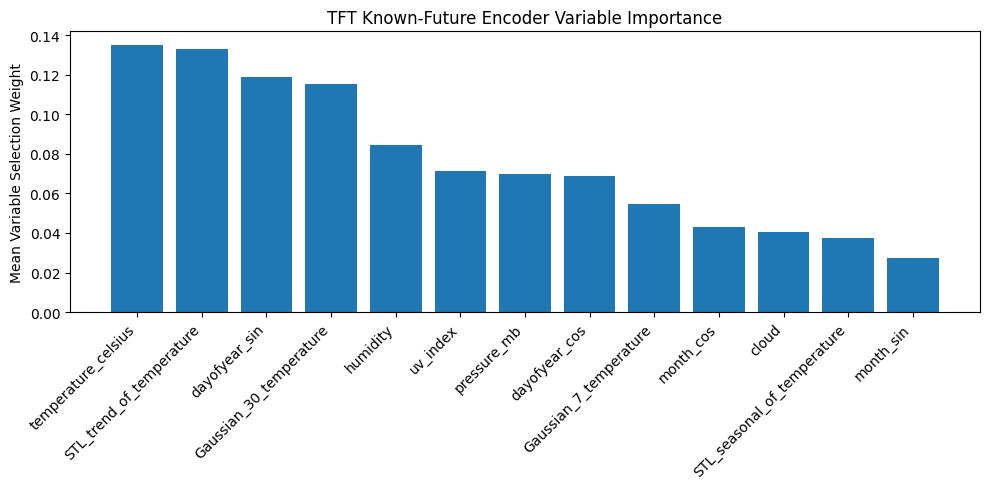

In [ ]:
# Variable importance

encoder_feature_names = (
    observed_feature_names
    +
    [
        "month_sin",
        "month_cos",
        "dayofyear_sin",
        "dayofyear_cos"
    ]
)

mean_variable_weights = variable_weights_np.mean(axis=(0, 1))

var_importance_df = pd.DataFrame({
    "feature": encoder_feature_names,
    "mean_variable_weight": mean_variable_weights
}).sort_values(
    "mean_variable_weight",
    ascending=False
)

display(var_importance_df)

var_importance_df.to_csv(
    os.path.join(REPORT_DIR, "tft_known_future_variable_importance.csv"),
    index=False
)

plt.figure(figsize=(10, 5))
plt.bar(
    var_importance_df["feature"],
    var_importance_df["mean_variable_weight"]
)
plt.xticks(rotation=45, ha="right")
plt.ylabel("Mean Variable Selection Weight")
plt.title("TFT Known-Future Encoder Variable Importance")
plt.tight_layout()
plt.savefig(
    os.path.join(FIG_DIR, "tft_known_future_variable_importance.png"),
    dpi=300
)
plt.show()

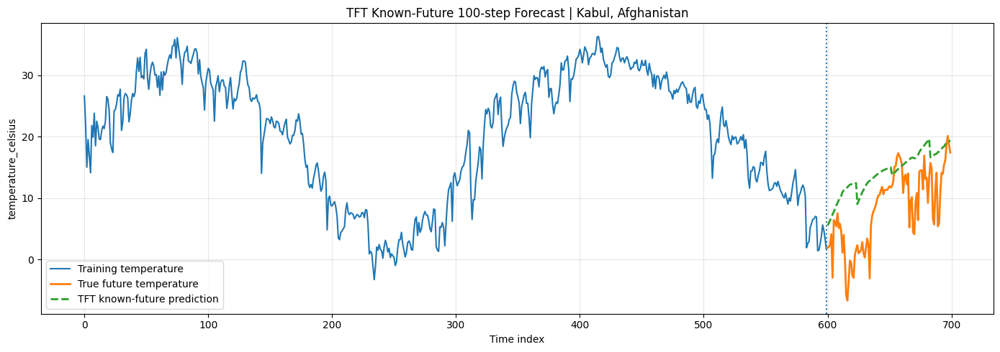

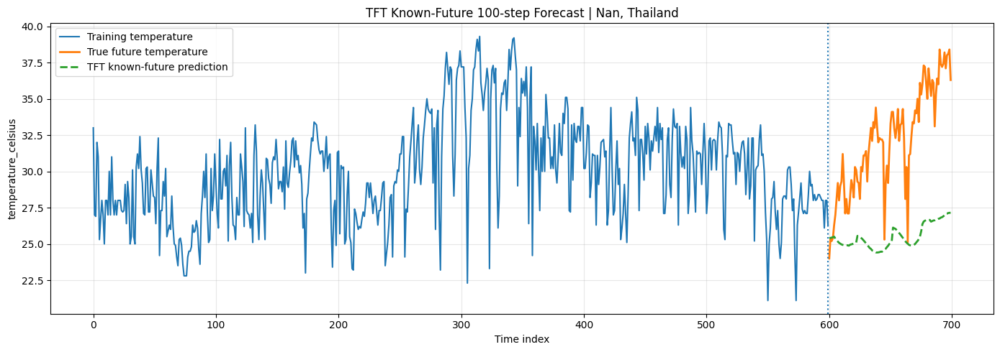

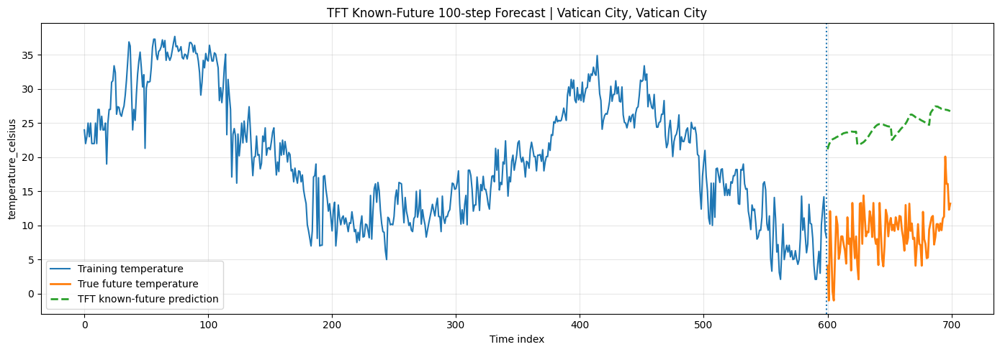

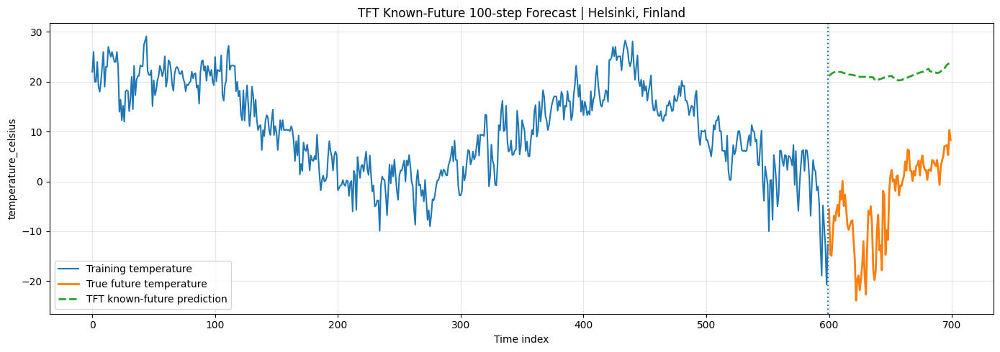

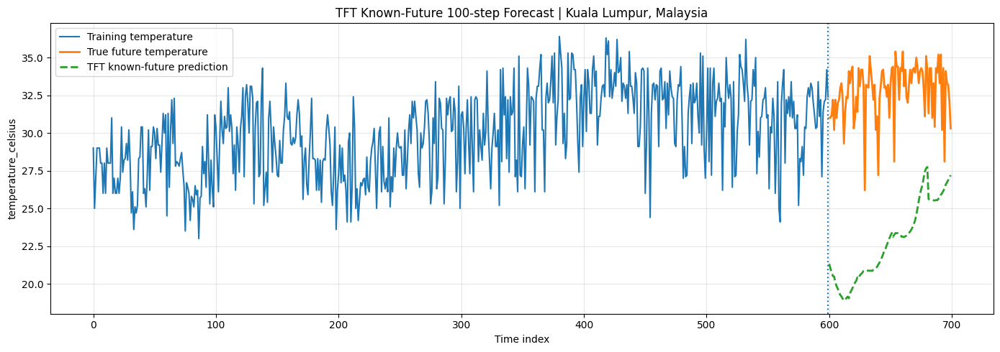

...

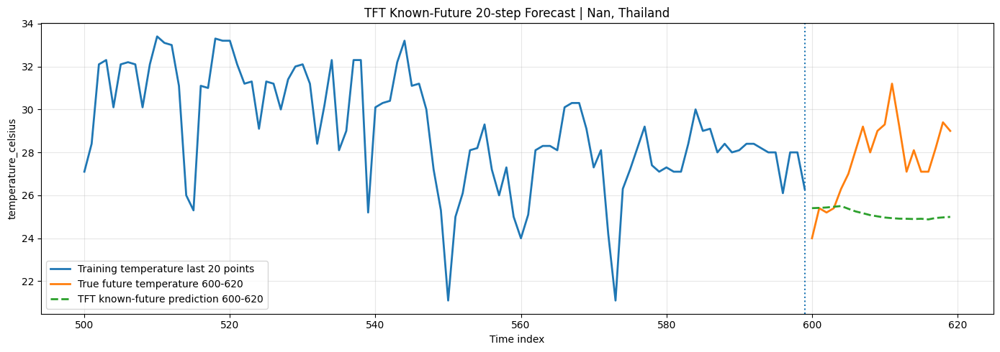

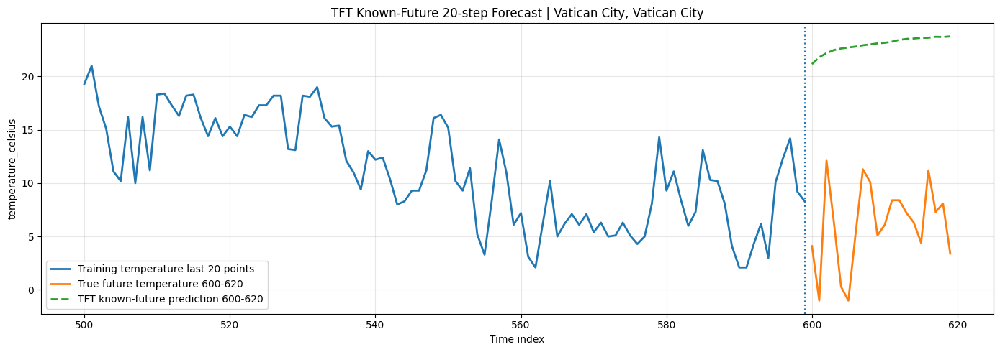

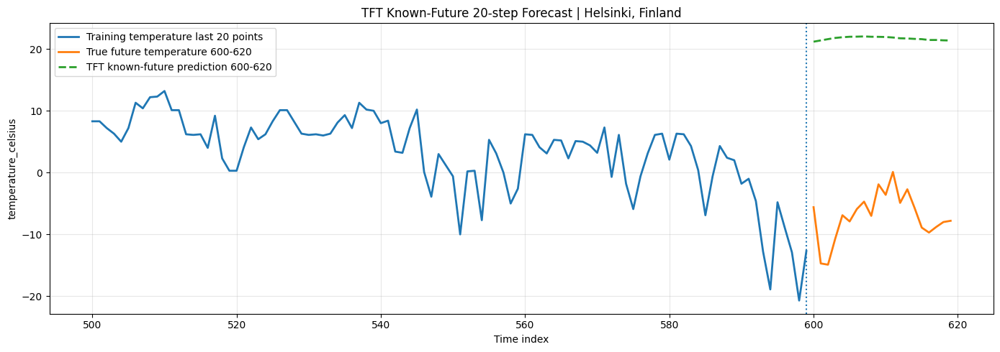

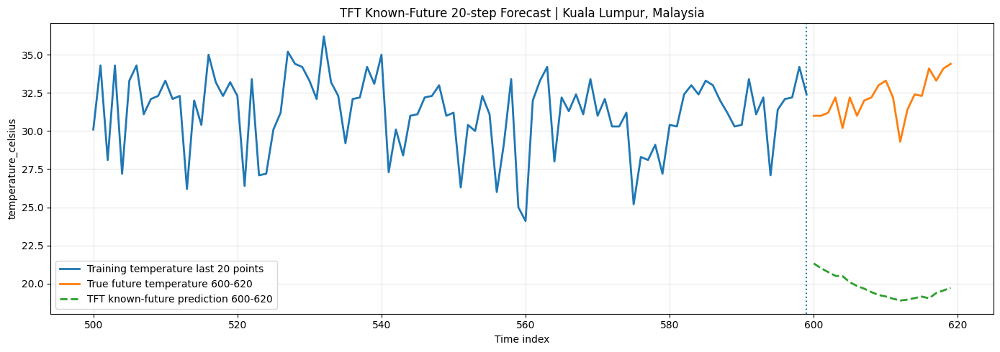

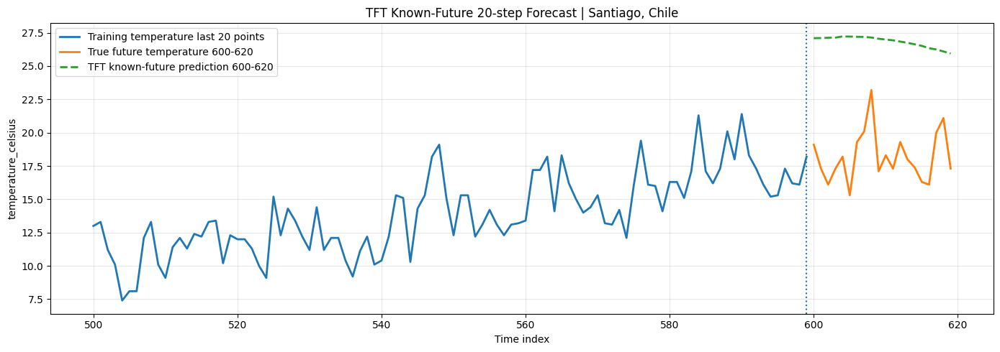

Saved TFT known-future figures to:
/content/drive/MyDrive/Weather Trend Forecasting/prediction_outputs/model_outputs/TFT_known_future_time/figures


In [ ]:
# Visualization

sample_indices = [0, 1, 2, 50, 99, 150]

FIG_100_DIR = os.path.join(FIG_DIR, "100step")
FIG_20_DIR = os.path.join(FIG_DIR, "20step")

os.makedirs(FIG_100_DIR, exist_ok=True)
os.makedirs(FIG_20_DIR, exist_ok=True)

for idx in sample_indices:
    if idx >= len(city_order):
        continue

    country = city_order.loc[idx, "country"]
    city = city_order.loc[idx, "location_name"]

    plt.figure(figsize=(14, 5))

    plt.plot(
        np.arange(600),
        X_main_train[idx],
        label="Training temperature",
        linewidth=1.5
    )

    plt.plot(
        np.arange(600, 700),
        Y_test[idx],
        label="True future temperature",
        linewidth=2
    )

    plt.plot(
        np.arange(600, 700),
        Y_pred_tft[idx],
        label="TFT known-future prediction",
        linewidth=2,
        linestyle="--"
    )

    plt.axvline(
        599,
        linestyle=":",
        linewidth=1.5
    )

    plt.title(
        f"TFT Known-Future 100-step Forecast | {city}, {country}"
    )

    plt.xlabel("Time index")
    plt.ylabel("temperature_celsius")
    plt.legend()
    plt.grid(alpha=0.3)
    plt.tight_layout()

    fig_name = f"TFT_known_future_100step_city_{idx}_{str(city).replace(' ', '_')}.png"

    plt.savefig(
        os.path.join(FIG_100_DIR, fig_name),
        dpi=300
    )

    plt.show()
    plt.close()


for idx in sample_indices:
    if idx >= len(city_order):
        continue

    country = city_order.loc[idx, "country"]
    city = city_order.loc[idx, "location_name"]

    plt.figure(figsize=(14, 5))

    plt.plot(
        np.arange(500, 600),
        X_main_train[idx, 500:600],
        label="Training temperature last 20 points",
        linewidth=2
    )

    plt.plot(
        np.arange(600, 620),
        Y_test[idx, :20],
        label="True future temperature 600-620",
        linewidth=2
    )

    plt.plot(
        np.arange(600, 620),
        Y_pred_tft[idx, :20],
        label="TFT known-future prediction 600-620",
        linewidth=2,
        linestyle="--"
    )

    plt.axvline(
        599,
        linestyle=":",
        linewidth=1.5
    )

    plt.title(
        f"TFT Known-Future 20-step Forecast | {city}, {country}"
    )

    plt.xlabel("Time index")
    plt.ylabel("temperature_celsius")
    plt.legend()
    plt.grid(alpha=0.3)
    plt.tight_layout()

    fig_name = f"TFT_known_future_20step_city_{idx}_{str(city).replace(' ', '_')}.png"

    plt.savefig(
        os.path.join(FIG_20_DIR, fig_name),
        dpi=300
    )

    plt.show()
    plt.close()

print("Saved TFT known-future figures to:")
print(FIG_DIR)